# Group 51 - Project Jupyter Notebook

André Lourenço – 20240743 <br>
Carolina Pinto – 20240494 <br>
Daniel Caridade – 20211588 <br>
Fábio dos Santos - 20240678 <br>
Gustavo Gomes – 20240657 <br>

## Table of Contents
- [1. Import Libraries](#1-import-libraries)
- [2. Data Integration](#2-data-integration)
   - [2.1 Data Description](#21-data-description)
- [3. Explore the Data (EDA - Exploratory Data Analysis)](#3-explore-the-data-eda---exploratory-data-analysis)
   - [3.1 Data Content](#31-data-content)
   - [3.2 Missing Values](#32-missing-values)
   - [3.3 Descriptive Statistics and Univariate Feature Exploration](#33-descriptive-statistics-and-univariate-feature-exploration)
     - [3.3.1 Numerical Features](#331-numerical-features)
     - [3.3.2 Categorical Features](#332-categorical-features)
   - [3.4 Incoherences](#34-incoherences)
   - [3.5 Multivariate Analysis](#35-multivariate-analysis)
     - [3.5.1 Pairwise Relationship of Numerical Features](#351-pairwise-relationship-of-numerical-features)
     - [3.5.2 Comparing Categorical Features](#352-comparing-categorical-features)
     - [3.5.3 Mean and Quantiles of Numeric Features Grouped by Categorical Features](#353-mean-and-quantiles-of-numeric-features-grouped-by-categorical-features)
     - [3.5.4 Plotting Input Features Against the Target Feature](#354-plotting-input-features-against-the-target-feature)
   - [3.6 Additional Features Exploration](#36-additional-features-exploration)
- [4. Data Preprocessing](#4-data-preprocessing)
- [5. Feature Selection](#5-feature-selection)
   - [5.1 Filter Methods](#51-filter-methods)
   - [5.2 Wrapper Methods](#52-wrapper-methods)
   - [5.3 Embedded Methods](#53-embedded-methods)
- [6. Model Selection & Assessment](#6-model-selection--assessment)
- [7. Deployment](#7-deployment)


# 1. Import libraries

`Step 1` Import the required packages

In [1]:
# EDA
import pandas as pd 
import numpy as np
import scipy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import os
import warnings
import xgboost as xgb
import time

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from scipy.stats import chi2_contingency
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.experimental import enable_iterative_imputer  # This is required for the IterativeImputer
from sklearn.impute import IterativeImputer
from matplotlib.colors import LinearSegmentedColormap

# Algorithms
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

# 2. Data Integration

`Step 2` Import the dataset __train_data.csv__ using the method **read_csv()** from pandas.

In [2]:
df = pd.read_csv('Data/train_data.csv')

C:\Users\danie\AppData\Local\Temp\ipykernel_2880\3731236379.py:1: DtypeWarning: Columns (29) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('Data/train_data.csv')


## 2.1. Data Description

`Accident Date`: Injury date of the claim. <br>
`Age at Injury`: Age of injured worker when the injury occured. <br>
`Alternative Disrute Resolution`: Adjudication process external to the Board. <br>
`Assembly Date`: The date the claim was first assembled. <br>
`Attorney/ Representative`: Is the claim being represented by an Attorney? <br>
`Average Weekly Wage`: The wage used to calculate workers' compensation, disability, or an Paid Leave wage replacement benefits. <br>
`Birth Year`: The reported year of birth of the injured worker. <br>
`C-2 Date`: Date of receipt of the Employer's Report of Work-Related Injury/Illness or equivalent (formerly Form C-2). <br>
`C-3 Date`: Date Form C-3 (Employee Claim Form) was received. <br>
`Carrier Name`: Name of primary insurance provider responsible for providing workers' compensation coverage to the injured worker's employer. <br>
`Carrier Type`: Type of primary insurance provider responsible for providing workers compensation coverage. <br>
`Claim Identifier`: Unique identifier for each claim, assigned by WCB. <br>
`County of Injury`: Name of the New York County where the injury occurred. <br>
`COVID-19 Indicator`: Indication that the claim may be associated with COVID-19. <br>
`District Name`: Indication of the WCB district office that oversees claims for that region or area of the state <br>
`First Hearing Date`: Date the first hearing was held on a claim at a WCB hearing location. A blank date means the claim has not yet had a hearing held. <br>
`Gender`: The reported gender of the injured worker. <br>
`IME-4 Count`: Number of IME-4 forms received per claim. The IME-4 form is the "Independent Examiner's Report of Independent Medical Examination" form <br>
`Industry Code`: NAICS code and descriptions available at: https://www.naics.com/search-naics-codes-by-industry/. <br>
`Industry Code Description`: 2-digit NAICS industry code description used to classify businesses according to their economic activity <br>
`Medical Fee Region`: Approcimate region where the injured worker would receive medical service <br>
`OIICS Nature of Injury Description`: The OIICS nature of injury codes & description are available at https://www.bls.gov/iif/oiics_manual_2007.pdf. <br>
`WCIO Cause of Injury Code`: The WCIO cause of injury codes & descriptions are at https://www.wcio.org/Active%20PNC/WCIO_Cause_Table.pdf <br>
`WCIO Cause of Injury Description`: See description of field above <br>
`WCIO Nature of Injury Code`: The WCIO nature of injury are available at https://www.wcio.org/Active%20PNC/WCIO_Nature_Table.pdf <br>
`WCIO Nature of Injury Description`: See description of field above <br>
`WCIO Part Of Body Code`: The WCIO part of body codes & descrptions are available at https://www.wcio.org/Active%20PNC/WCIO_Part_Table.pdf <br>
`WCIO Part of Body Description`: See description of field above. <br>
`Zip Code`: The reported ZIP code of the injured worker's home adress. <br>
`Agreement Reached`: __Binary variable:__ Yes if there is an agreement without the involvement of the WCB -> __unknown__ at the start of claim. <br>
`WCB Decision`: __Multiclass variable__ Decision of the WCB relative to the claim "Accident" means that claim refers to workplace accident, "Occupational Disease" means illness from the workplace. -> __requires WCB deliberation__ so it is unknown at start of claim. <br>
`Claim injury Type`: __Main target variable:__ Deliberation of the WCB relative to benefits awarded to the claim. __Numbering indicates severity__

# 3. Explore the Data (EDA - Exploratory Data Analysis)

## 3.1. Data Content

`Step 3` Check the first 5 rows of the dataset

In [3]:
df.head()

,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,...,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Agreement Reached,WCB Decision,Number of Dependents
0,2019-12-30,31.0,N,2020-01-01,N,0.00,1988.0,2019-12-31,NaN,NEW HAMPSHIRE INSURANCE CO,...,27.0,FROM LIQUID OR GREASE SPILLS,10.0,CONTUSION,62.0,BUTTOCKS,13662,0.0,Not Work Related,1.0
1,2019-08-30,46.0,N,2020-01-01,Y,1745.93,1973.0,2020-01-01,2020-01-14,ZURICH AMERICAN INSURANCE CO,...,97.0,REPETITIVE MOTION,49.0,SPRAIN OR TEAR,38.0,SHOULDER(S),14569,1.0,Not Work Related,4.0
2,2019-12-06,40.0,N,2020-01-01,N,1434.80,1979.0,2020-01-01,NaN,INDEMNITY INSURANCE CO OF,...,79.0,OBJECT BEING LIFTED OR HANDLED,7.0,CONCUSSION,10.0,MULTIPLE HEAD INJURY,12589,0.0,Not Work Related,6.0
3,NaN,NaN,NaN,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-12-30,61.0,N,2020-01-01,N,NaN,1958.0,2019-12-31,NaN,STATE INSURANCE FUND,...,16.0,"HAND TOOL, UTENSIL; NOT POWERED",43.0,PUNCTURE,36.0,FINGER(S),12603,0.0,Not Work Related,1.0


`Step 4` Check the number of rows and columns of the data frame

In [4]:
# Use the function .shape to receive a tuple with the number of rows and the number fo columns of the dataset
df.shape

(593471, 33)

`Step 5` Check the features data types

In [5]:
# Use the function .dtypes to check the variables data types
df.dtypes

Accident Date                          object
Age at Injury                         float64
Alternative Dispute Resolution         object
Assembly Date                          object
Attorney/Representative                object
Average Weekly Wage                   float64
Birth Year                            float64
C-2 Date                               object
C-3 Date                               object
Carrier Name                           object
Carrier Type                           object
Claim Identifier                        int64
Claim Injury Type                      object
County of Injury                       object
COVID-19 Indicator                     object
District Name                          object
First Hearing Date                     object
Gender                                 object
IME-4 Count                           float64
Industry Code                         float64
Industry Code Description              object
Medical Fee Region                

#### Conclusions
- Our data is composed of **593471** observations and **33** columns.
- Variable `Industry Code`, `WCIO Cause of Injury Code`, `WCIO Nature of Injure Code` and `WCIO Part of Body Code` are of type *float64*, but despite being numbers those are categorical variables rather than numeric.
- `OIICS Nature of Injury Description` data type is *float64* but it should be an object since it is a description.
- `Industry Code`, `WCIO Cause of Injury Code`, `WCIO Nature of Injure Code` and `WCIO Part of Body Code` have associated to them other variables about the description of that code, which provide the same information (redundant data).
- The variables related to time were represented as *strings*, since the data type is *object* instead of *datetime64*.

## 3.2. Missing Values

`Step 6` Checking for missing values in the data

In [6]:
# Use the method .isna() and then .sum() to identify the NaN values in the dataset and then sum them
df.isna().sum()

Accident Date                          23134
Age at Injury                          19445
Alternative Dispute Resolution         19445
Assembly Date                              0
Attorney/Representative                19445
Average Weekly Wage                    48096
Birth Year                             48523
C-2 Date                               34005
C-3 Date                              406226
Carrier Name                           19445
Carrier Type                           19445
Claim Identifier                           0
Claim Injury Type                      19445
County of Injury                       19445
COVID-19 Indicator                     19445
District Name                          19445
First Hearing Date                    442673
Gender                                 19445
IME-4 Count                           460668
Industry Code                          29403
Industry Code Description              29403
Medical Fee Region                     19445
OIICS Natu

`Step 7` Check if there are rows that only contain missing values excluding variables `Assembly Date` and `Claim Identifier`.

In [7]:
# Create a variable columns_to_check that contains all the columns that we want to check for missing data (all except Claim Identifier and 
# Assembly Date) 
columns_to_check = df.columns.difference(['Claim Identifier', 'Assembly Date'])

# Check the amount of rows where all columns contain NaN values
df[columns_to_check].isna().all(axis=1).sum()

19445

#### Conclusions
- Besides variables `Assembly Date` and `Claim Identifier` all other variables have missing values.
- There are a lot of variables that have precisely, **19445 rows** with missing data.
- Variable `OIICS Nature of Injury Description` is full of missing values
- There are **19445 rows** that have only missing values (excluding columns `Assembly Date` and `Claim Identifier`), which explains the fact that **13 variables** have this number of missing data.

## 3.3. Descriptive Statistics and Univariate Feature Exploration

`Step 8` Split the columns of the data set into numeric features and categorical features

In [8]:
# Create a list with all the numeric features called numeric_features 
numeric_features = ["Age at Injury", "Average Weekly Wage", "Birth Year", "IME-4 Count", "Number of Dependents"]

# Create a list with all the categorical features (considering the descriptions instead of the codes for readibility and interpretation purposes)
categorical_features = ["Alternative Dispute Resolution", "Attorney/Representative", 'Carrier Name', "Carrier Type", "County of Injury", "COVID-19 Indicator", "District Name", "District Name", "Gender", "Industry Code Description", "Medical Fee Region", "WCIO Cause of Injury Description", "WCIO Nature of Injury Description", "WCIO Part Of Body Description", "Zip Code"]

### 3.3.1. Numerical Features

`Step 9` Checking descriptive statistics and the univariate visualizations for the numeric features

In [9]:
df[numeric_features].describe()

,Age at Injury,Average Weekly Wage,Birth Year,IME-4 Count,Number of Dependents
count,574026.000000,5.453750e+05,544948.000000,132803.000000,574026.000000
mean,42.114270,4.910883e+02,1886.767604,3.207337,3.006559
std,14.256432,6.092918e+03,414.644423,2.832303,2.000801
min,0.000000,0.000000e+00,0.000000,1.000000,0.000000
25%,31.000000,0.000000e+00,1965.000000,1.000000,1.000000
50%,42.000000,0.000000e+00,1977.000000,2.000000,3.000000
75%,54.000000,8.410000e+02,1989.000000,4.000000,5.000000
max,117.000000,2.828079e+06,2018.000000,73.000000,6.000000


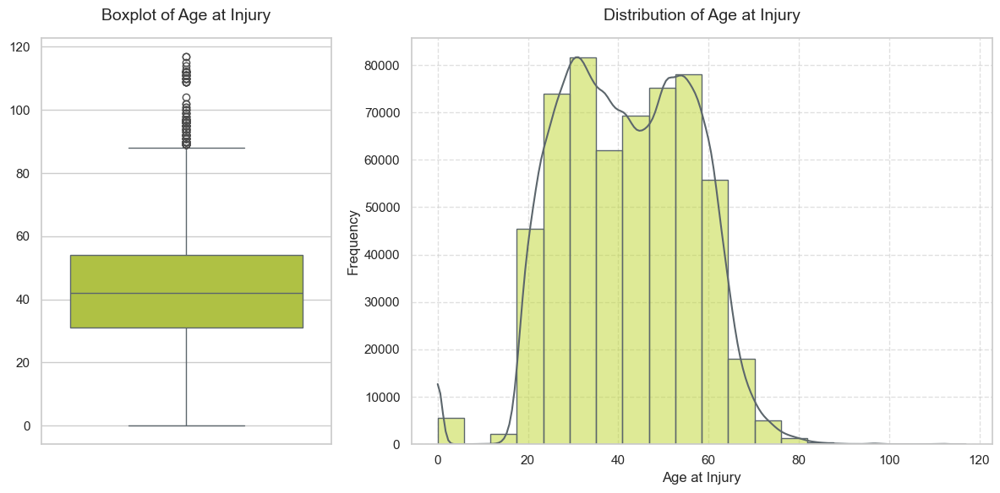

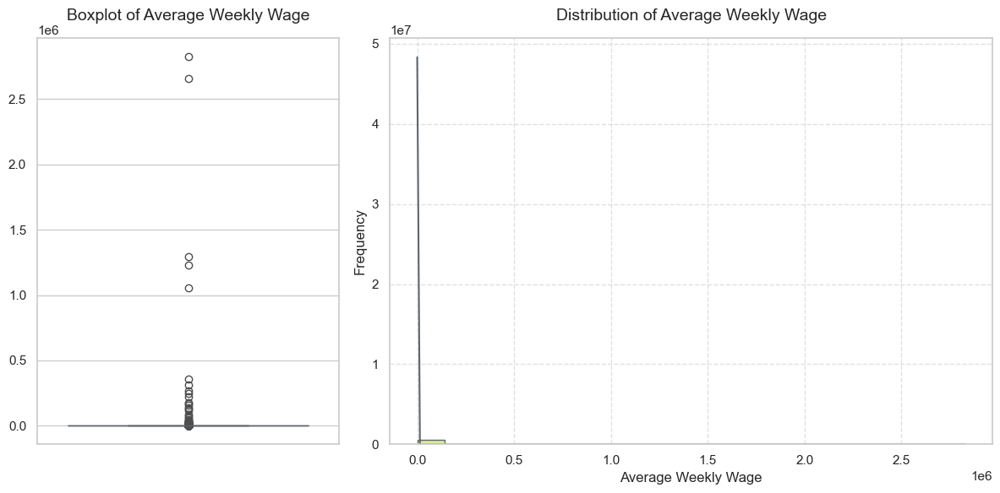

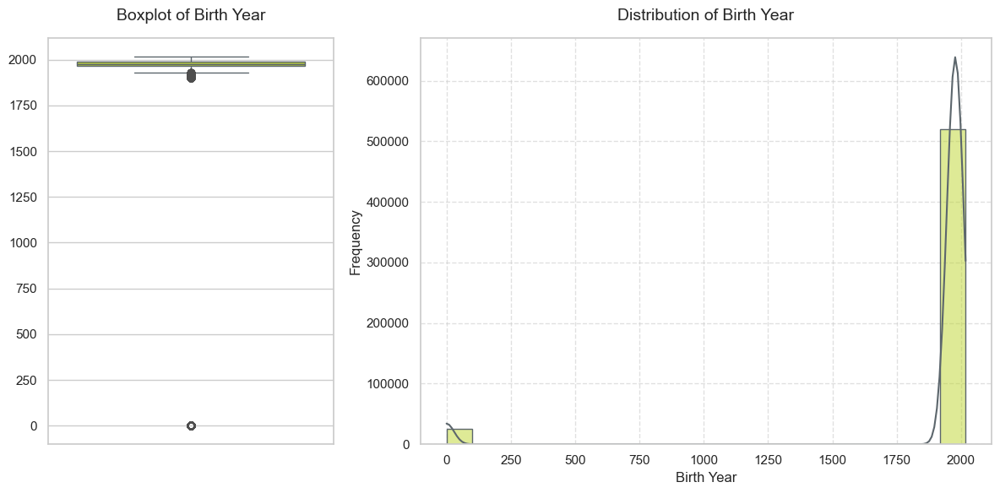

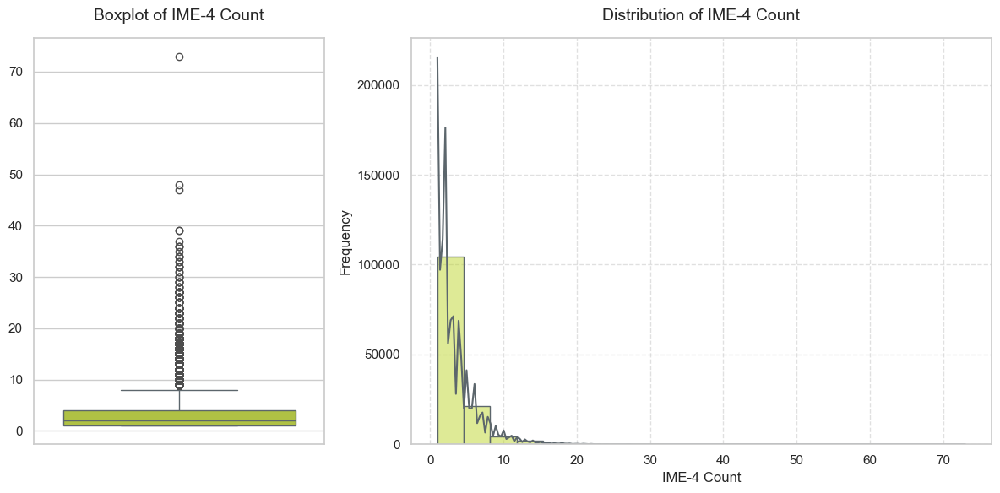

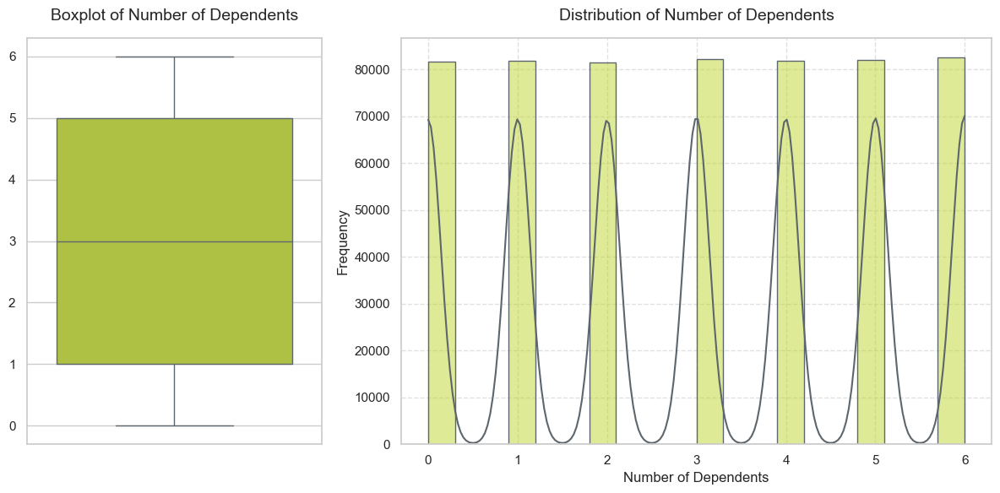

In [10]:
warnings.filterwarnings("ignore")

color_390 = (190/255, 214/255, 47/255)  # Pantone 390 C
color_431 = (92/255, 102/255, 108/255)  # Pantone 431 C

# Set seaborn styling
sns.set(style="whitegrid")

# Loop through each numeric feature and plot
for val in numeric_features:
    fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'width_ratios': [1, 2]})
    
    # Boxplot in the first column
    sns.boxplot(y=df[val], color=color_390, ax=axes[0],
                boxprops=dict(edgecolor=color_431), 
                whiskerprops=dict(color=color_431),
                capprops=dict(color=color_431),
                medianprops=dict(color=color_431))
    axes[0].set_title(f"Boxplot of {val}", fontsize=14, pad=15)
    axes[0].set_xlabel("")  # No x/y-axis label for the boxplot
    axes[0].set_ylabel("")

    # Histogram with KDE in the second column
    sns.histplot(df[val], bins=20, kde=True, color=color_390, edgecolor=color_431, ax=axes[1])
    axes[1].set_title(f"Distribution of {val}", fontsize=14, pad=15)
    axes[1].set_xlabel(val, fontsize=12)
    axes[1].set_ylabel("Frequency", fontsize=12)
    axes[1].grid(True, linestyle='--', alpha=0.6)

    # Customize KDE line color to Pantone 431 C
    kde_line = axes[1].lines[-1]
    kde_line.set_color(color_431)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

Boxplot for the `Birth Year` without the zeros, for easier readability.

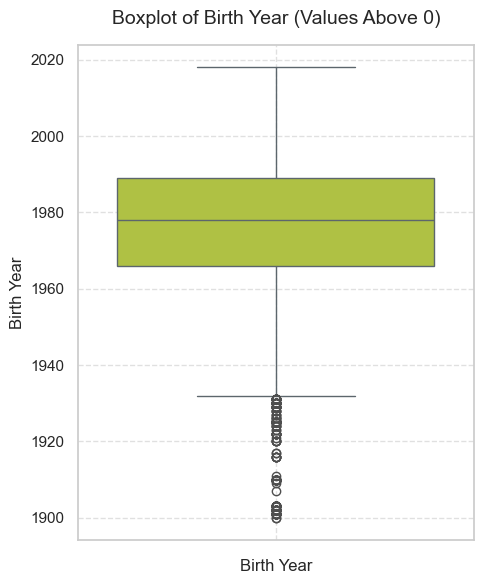

In [11]:
# Suppress warnings
warnings.filterwarnings("ignore")

# Filter the DataFrame to include only rows where 'Birth Year' is greater than 0
filtered_df = df[df['Birth Year'] > 0]

# Set Seaborn style for better aesthetics
sns.set(style="whitegrid")

# Create a boxplot
plt.figure(figsize=(5, 6))  # Set the figure size
sns.boxplot(y=filtered_df['Birth Year'], color=color_390,
                boxprops=dict(edgecolor=color_431), 
                whiskerprops=dict(color=color_431),
                capprops=dict(color=color_431),
                medianprops=dict(color=color_431))
# Customize the plot
plt.title("Boxplot of Birth Year (Values Above 0)", fontsize=14, pad=15)  # Add title
plt.xlabel("Birth Year", fontsize=12)  # Set x-axis label
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid lines for better readability
plt.tight_layout()  # Ensure everything fits nicely
plt.show()  # Display the plot

`Step 10` Performing the Chi-Square goodness of fit for the variable `Number of Dependents`

In [12]:
# Step 1: Calculate observed frequencies
observed_frequencies = df['Number of Dependents'].value_counts().sort_index()

# Step 2: Generate expected frequencies for a uniform distribution
total_count = observed_frequencies.sum()  # Total number of observations
num_categories = observed_frequencies.size  # Number of unique values in 'Number of Dependents'

# Expected frequencies assuming a uniform distribution
expected_frequencies = np.full(num_categories, total_count / num_categories)

# Step 3: Ensure the sum of expected frequencies equals the sum of observed frequencies
expected_frequencies = expected_frequencies * (observed_frequencies.sum() / expected_frequencies.sum())

# Step 4: Perform the Chi-Square Goodness of Fit test
chi2_stat, p_value = stats.chisquare(observed_frequencies, f_exp=expected_frequencies)

# Step 5: Print the result
print(f"Chi-Square Statistic: {chi2_stat}")
print(f"P-value: {p_value}")

# Conclusion
alpha = 0.05  # Significance level (5%)
if p_value < alpha:
    print("Reject the null hypothesis. The distribution of 'Number of Dependents' is not uniform.")
else:
    print("Fail to reject the null hypothesis. The distribution of 'Number of Dependents' is uniform.")

Chi-Square Statistic: 10.103901217018047
P-value: 0.12034415692434919
Fail to reject the null hypothesis. The distribution of 'Number of Dependents' is uniform.


#### 3.3.2. Categorical Features

`Step 11` Check descriptive statistics and the univariate visualizations for the categorical features *(for this analysis we disregarded the fact that dates are still presented in string format)*

In [13]:
df.describe(include='O').T

,count,unique,top,freq
Accident Date,570337,5539,2020-03-01,1245
Alternative Dispute Resolution,574026,3,N,571412
Assembly Date,593471,1096,2020-03-06,1422
Attorney/Representative,574026,2,N,392291
C-2 Date,559466,2475,2021-05-11,1847
C-3 Date,187245,1648,2021-04-21,350
Carrier Name,574026,2046,STATE INSURANCE FUND,111144
Carrier Type,574026,8,1A. PRIVATE,285368
Claim Injury Type,574026,8,2. NON-COMP,291078
County of Injury,574026,63,SUFFOLK,60430


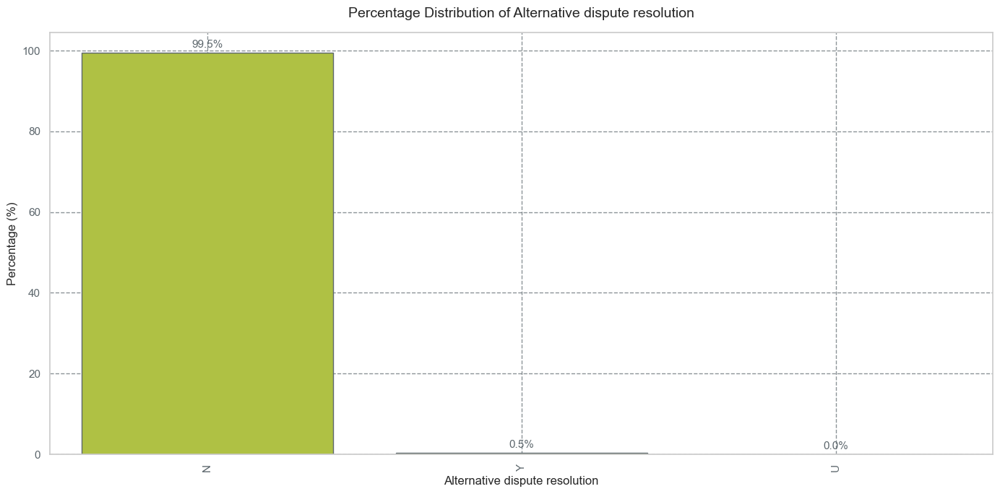

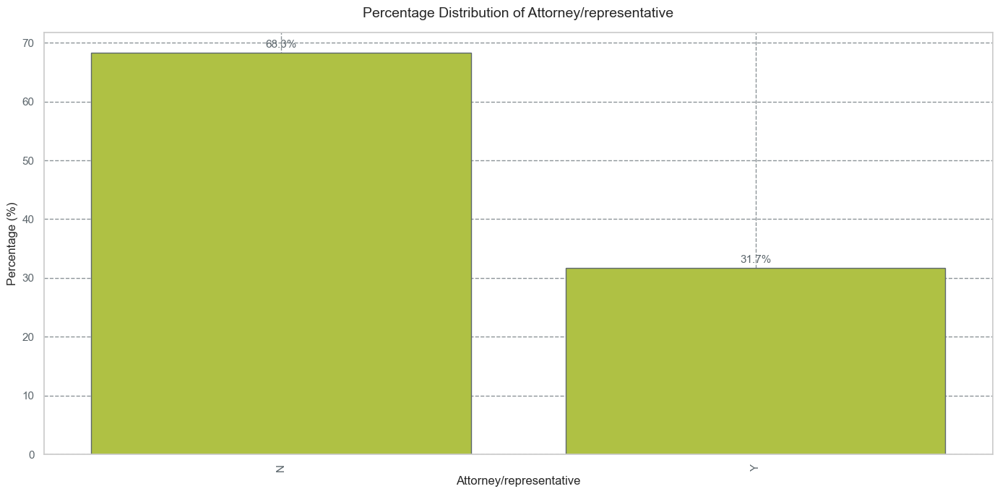

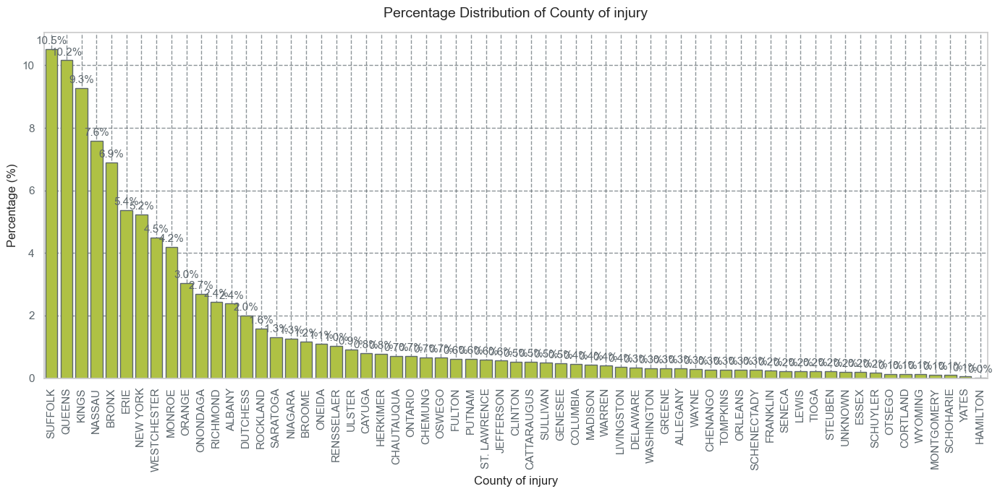

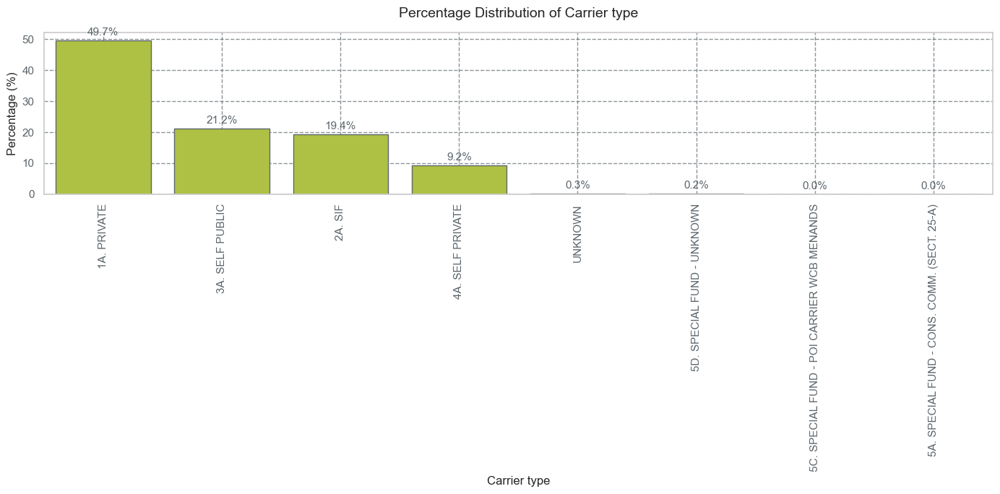

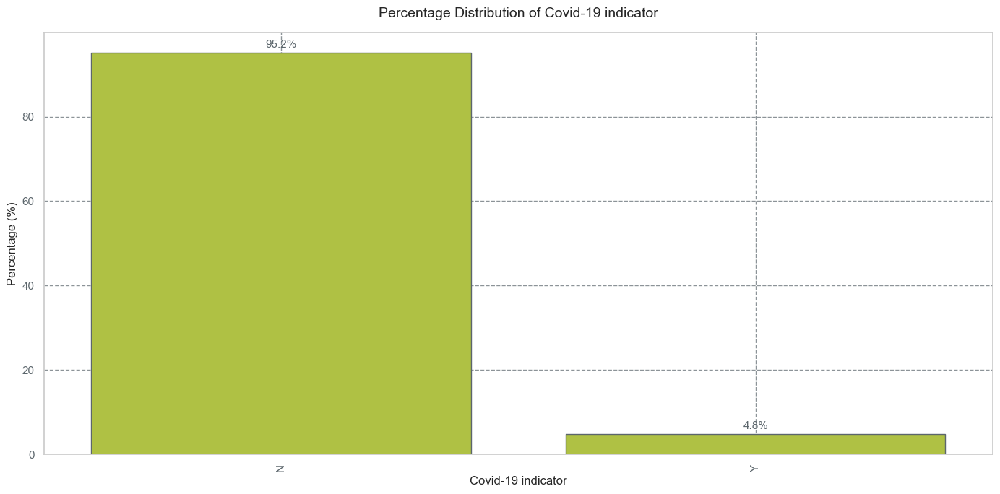

...

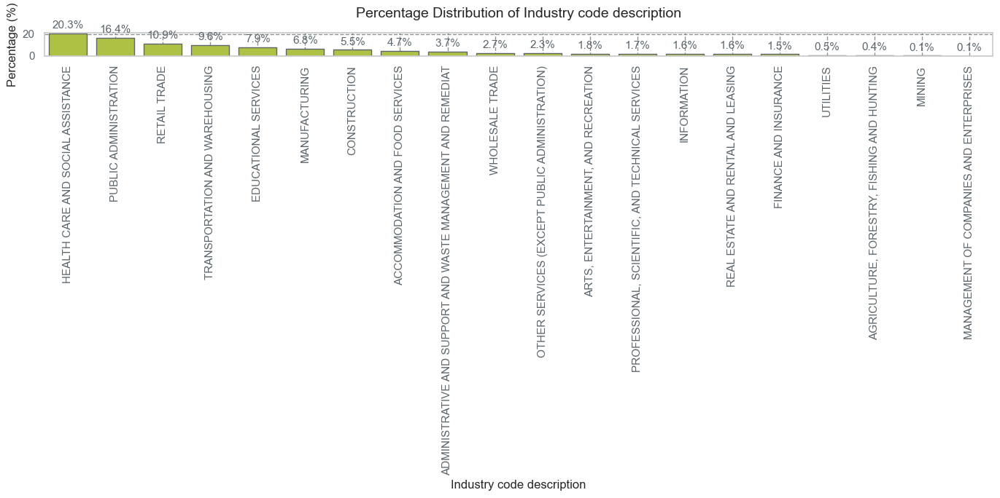

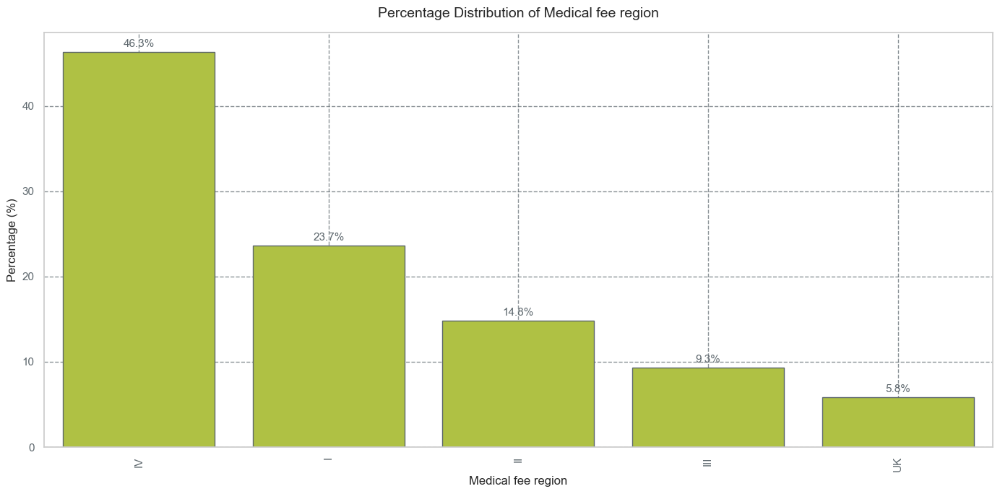

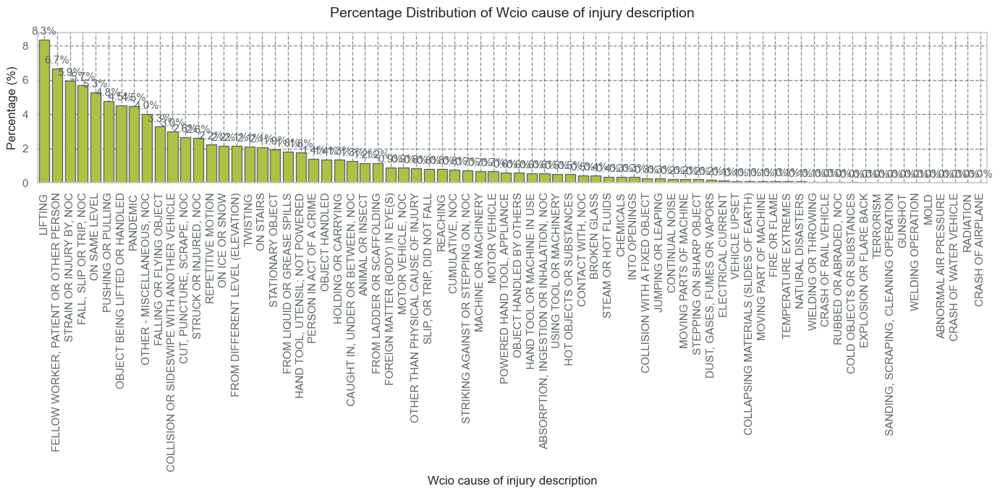

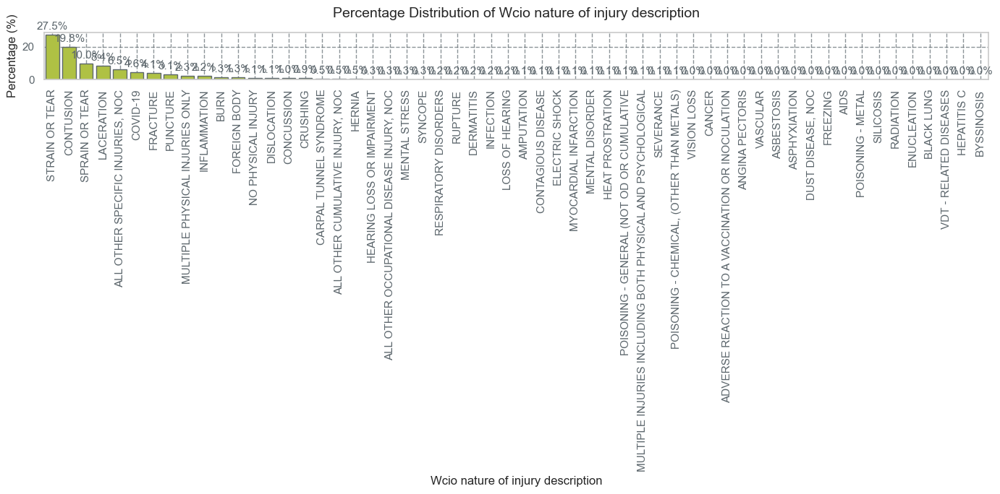

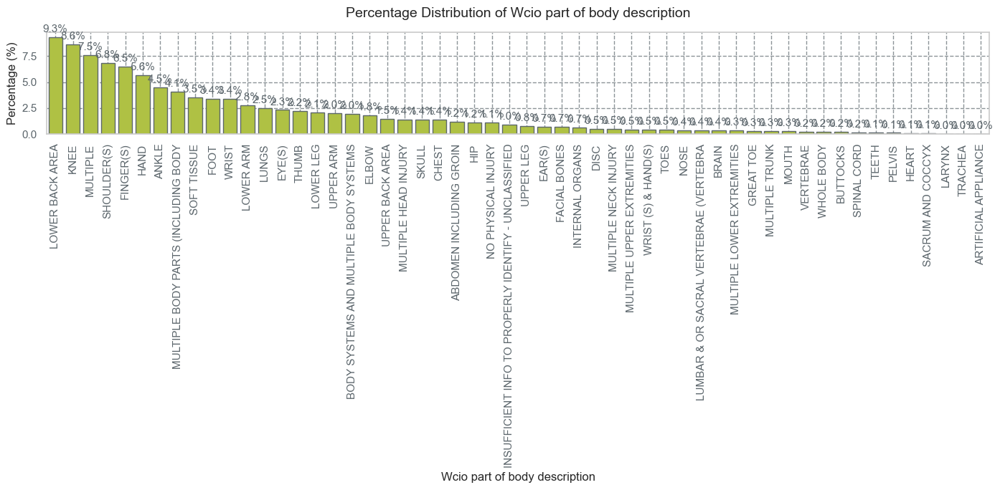

In [14]:
# Set the overall plot style for a cleaner look
sns.set(style="whitegrid")

# Create a list categorical_features_filtered to ignore the Zip Code and Carrier Name in list categorical_features 
# because the visualizations will not bring good insights once these features have a lot for categories
categorical_features_filtered = [
    "Alternative Dispute Resolution", "Attorney/Representative", "County of Injury", "Carrier Type", "COVID-19 Indicator", "District Name", "Gender", 
    "Industry Code Description", "Medical Fee Region", "WCIO Cause of Injury Description", 
    "WCIO Nature of Injury Description", "WCIO Part Of Body Description"
]

# Iterate through each categorical feature to create bar plots with percentage on the y-axis
for feature in categorical_features_filtered:
    plt.figure(figsize=(14, 7))  # Set figure size for each plot
    
    # Calculate the percentage for each category
    percentage = df[feature].value_counts(normalize=True) * 100
    
    ax = sns.barplot(x=percentage.index, y=percentage.values, color=color_390, edgecolor=color_431)
    
    # Annotate each bar with the percentage
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.1f}%',  # Format to 1 decimal place
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='baseline', fontsize=11, color=color_431,  # Annotation color
                    xytext=(0, 5), textcoords='offset points')

    plt.title(f"Percentage Distribution of {feature.capitalize()}", fontsize=14, pad=15)
    plt.xlabel(feature.capitalize(), fontsize=12)
    plt.ylabel("Percentage (%)", fontsize=12)
    
    # Rotate x-axis labels by 45 degrees
    plt.xticks(rotation=90, color=color_431)
    plt.yticks(color=color_431)

    plt.grid(True, linestyle='--', alpha=0.7, color=color_431)
    
    plt.tight_layout()  # Ensure no overlap
    plt.show()  # Display the plot

Doing visualizations for the top 10 categories for the categorical features with a lot of categories.

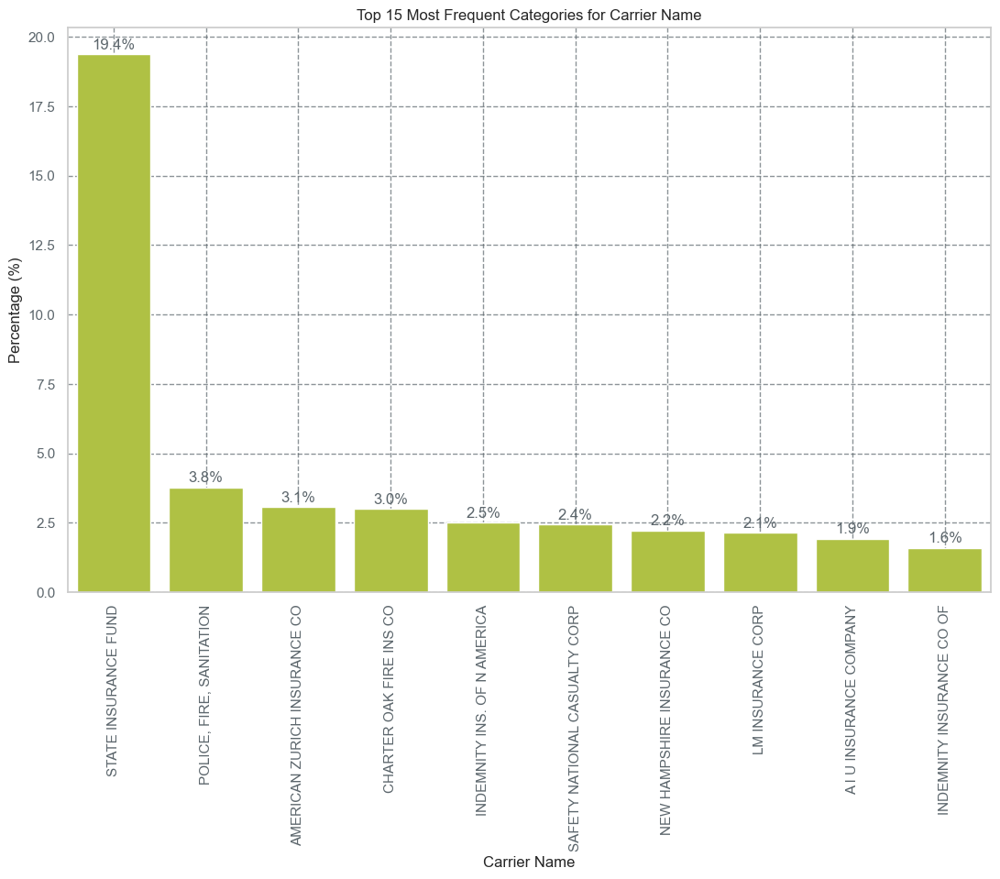

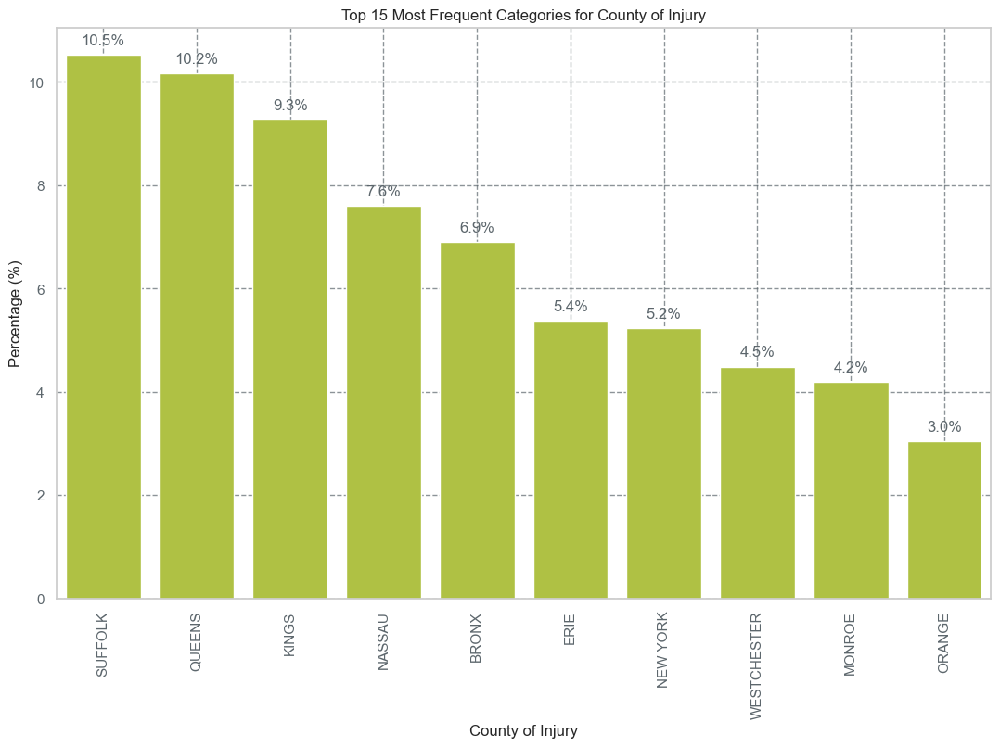

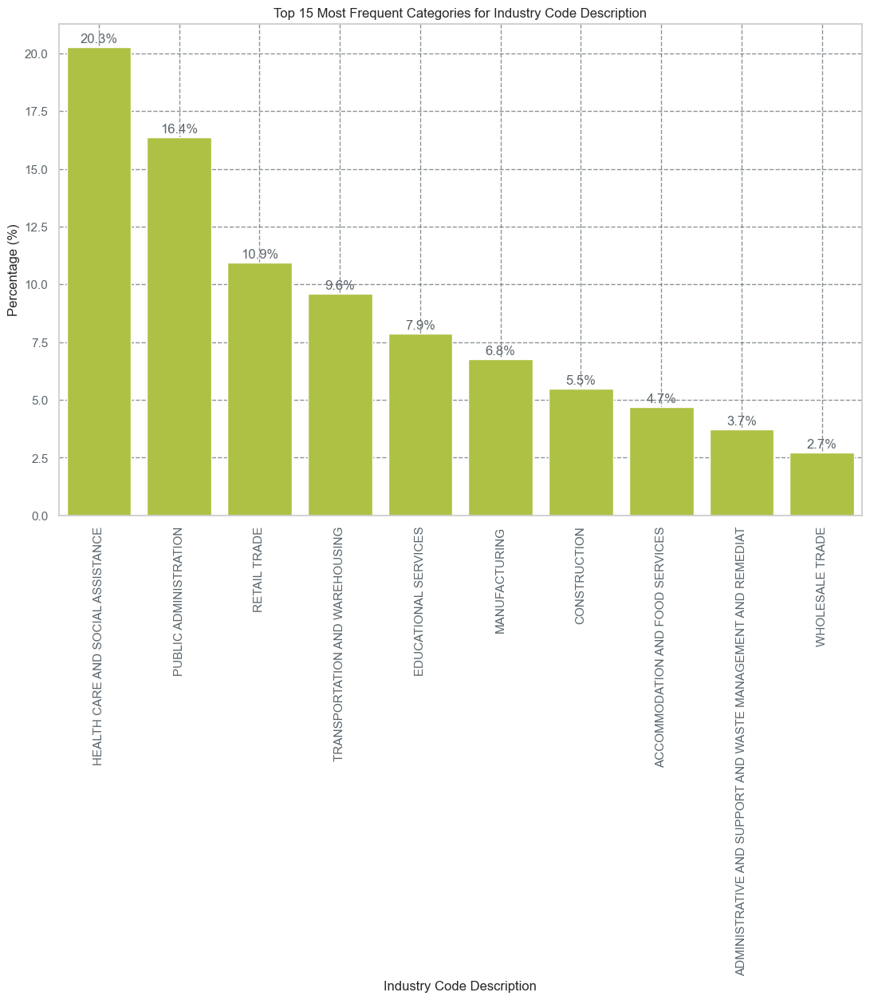

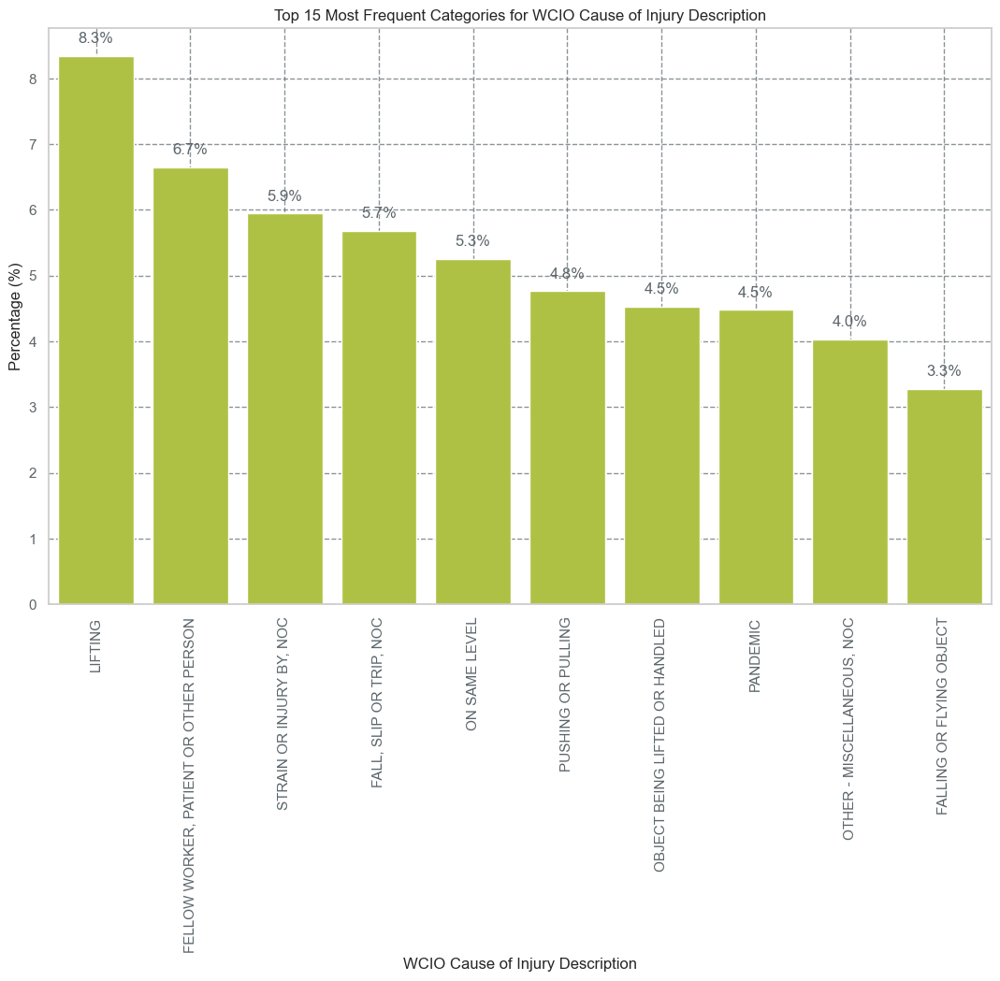

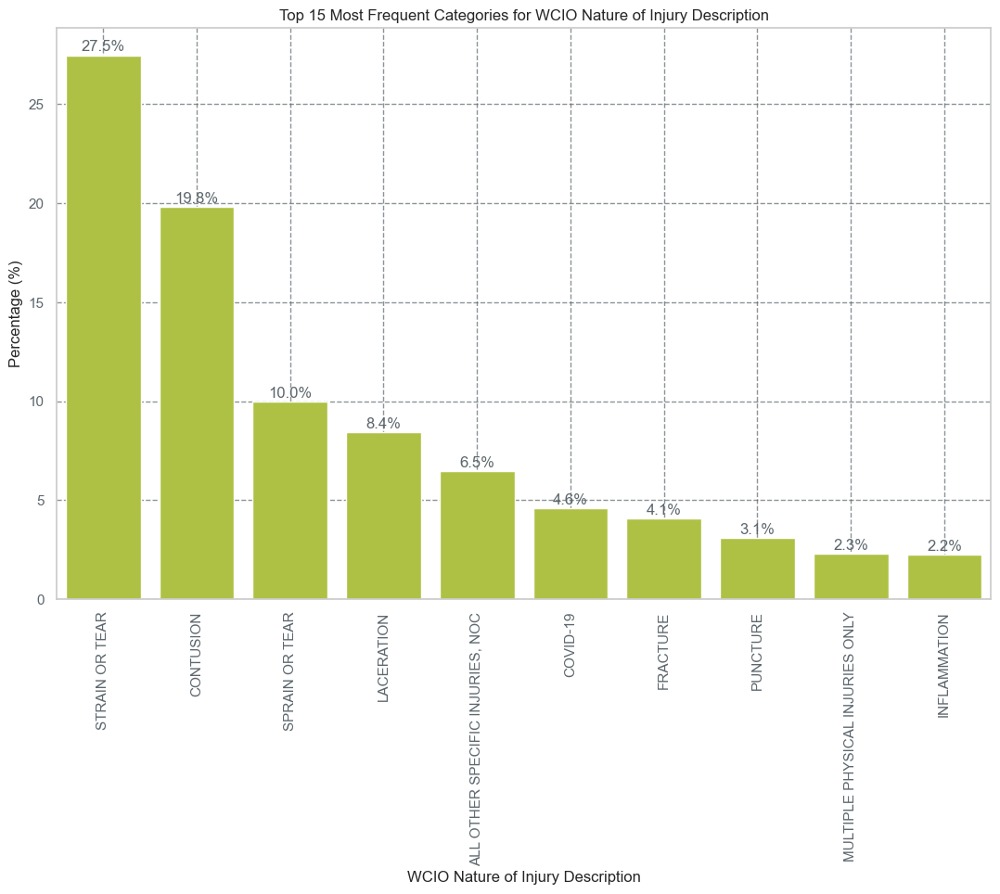

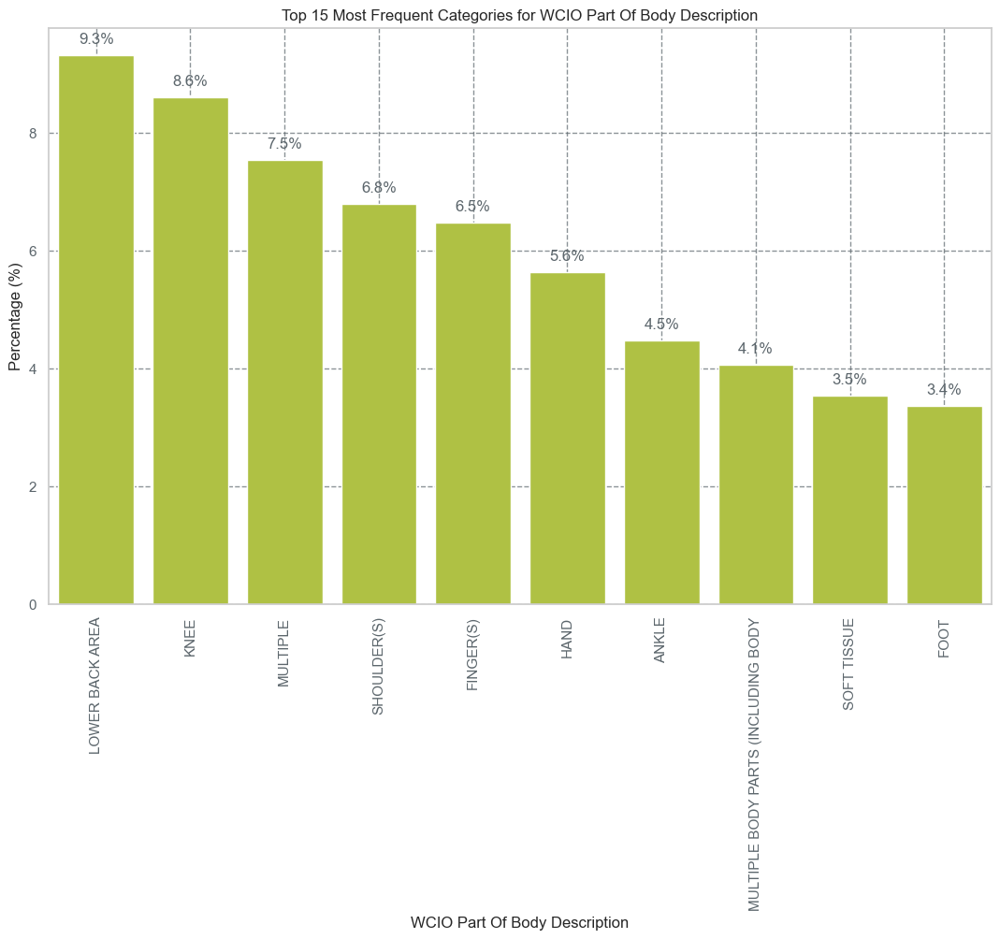

In [15]:
cat_more_categories=["Carrier Name", "County of Injury", "Industry Code Description", "WCIO Cause of Injury Description", "WCIO Nature of Injury Description", "WCIO Part Of Body Description"]

for cat in cat_more_categories:
    # Get the 10 most frequent categories
    top_categories = df[cat].value_counts(normalize=True).head(10)  # Normalize to get percentage
    top_categories_percent = top_categories * 100  # Convert to percentage

    # Sort the values and the index (categories) in descending order
    top_categories_percent = top_categories_percent.sort_values(ascending=False)
    plt.figure(figsize=(13, 8))
    ax = sns.barplot(
        x=top_categories_percent.index, 
        y=top_categories_percent.values, 
        color=color_390,  # Pantone 390 C
        order=top_categories_percent.index
    )

    # Annotate each bar with the percentage
    for bar, percentage in zip(ax.patches, top_categories_percent.values):
        ax.text(
            bar.get_x() + bar.get_width() / 2,  # X position at the center of the bar
            bar.get_height() + 0.2,  # Y position slightly above the bar
            f'{percentage:.1f}%',  # Format as percentage with 1 decimal place
            ha='center',  # Center align the text horizontally
            fontsize=12,
            color=color_431  # Pantone 431 C for contrast
        )

    plt.title(f'Top 15 Most Frequent Categories for {cat}')
    plt.xlabel(cat)
    plt.ylabel('Percentage (%)')
    plt.xticks(rotation=90, color=color_431)
    plt.yticks(color=color_431)   
    plt.grid(True, linestyle='--', alpha=0.7, color=color_431)
    plt.show()

Doing the visualization for `Zip Code`, grouping the codes that start with the same 2 numbers, identifying broader regions.

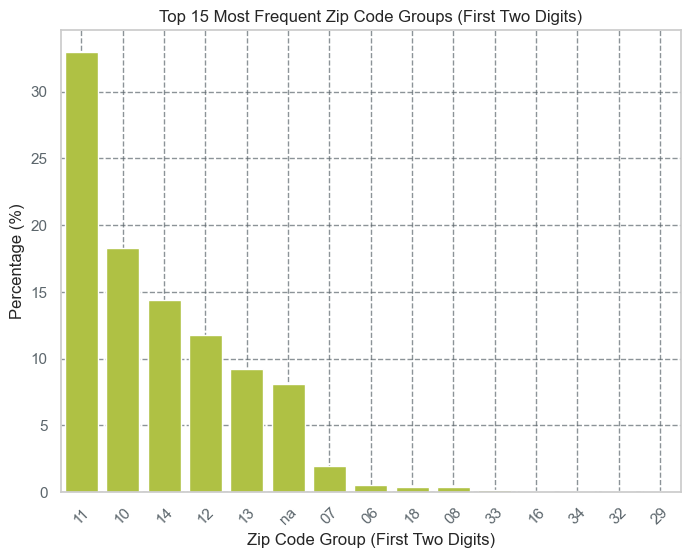

In [16]:
# Extract the first two digits of the zip code
df['Zip Group'] = df['Zip Code'].astype(str).str[:2]

# Get the top 15 most frequent groups, normalized to percentages
zip_group_counts = df['Zip Group'].value_counts(normalize=True).head(15) * 100

# Create the bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x=zip_group_counts.index, y=zip_group_counts.values, color=color_390)

# Add title and labels
plt.title('Top 15 Most Frequent Zip Code Groups (First Two Digits)')
plt.xlabel('Zip Code Group (First Two Digits)')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=45, color=color_431)
plt.yticks(color=color_431)   
plt.grid(True, linestyle='--', alpha=0.7, color=color_431)

# Display the plot
plt.show()

df = df.drop(columns=['Zip Group'])


Doing the visualization for `Zip Code`, for the top 15 Zip Codes

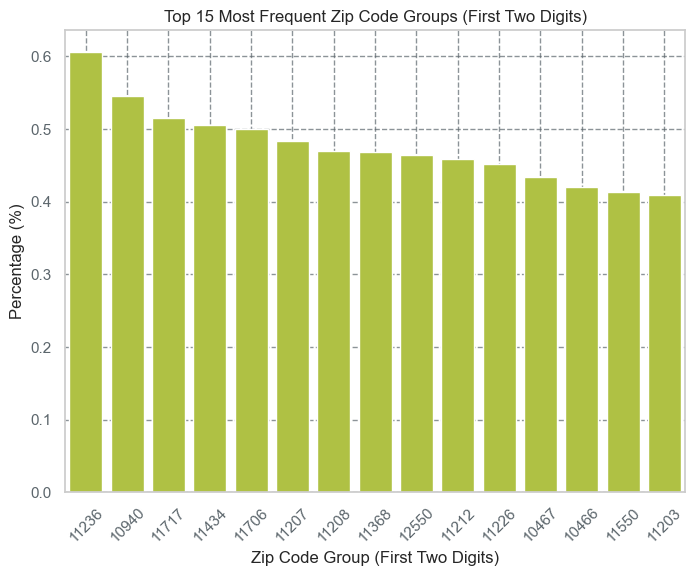

In [17]:
# Get the top 15 most frequent groups, normalized to percentages
zip_group_counts = df['Zip Code'].value_counts(normalize=True).head(15) * 100

# Create the bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x=zip_group_counts.index, y=zip_group_counts.values, color=color_390)

# Add title and labels
plt.title('Top 15 Most Frequent Zip Code Groups (First Two Digits)')
plt.xlabel('Zip Code Group (First Two Digits)')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=45, color=color_431)
plt.yticks(color=color_431)   
plt.grid(True, linestyle='--', alpha=0.7, color=color_431)

# Display the plot
plt.show()

`Step 11.1` Checking the principal Nature of Injury in the day the highest amount of injuries was registered 

In [18]:
# Create a dataset that contain only the accidents that occured in 2020-03-01
filtered_injury_descriptions = df[df['Accident Date'] == '2020-03-01']['WCIO Nature of Injury Description']

# Check the percentage of each type of injury 
(filtered_injury_descriptions.value_counts() / len(filtered_injury_descriptions)) * 100

WCIO Nature of Injury Description
COVID-19                                                       73.172691
STRAIN OR TEAR                                                  7.228916
CONTUSION                                                       5.943775
LACERATION                                                      2.008032
SPRAIN OR TEAR                                                  1.927711
ALL OTHER SPECIFIC INJURIES, NOC                                1.365462
FRACTURE                                                        1.124498
FOREIGN BODY                                                    0.642570
BURN                                                            0.562249
INFLAMMATION                                                    0.562249
HEARING LOSS OR IMPAIRMENT                                      0.481928
MULTIPLE PHYSICAL INJURIES ONLY                                 0.481928
PUNCTURE                                                        0.401606
ALL OTHER OCCUPAT

### Conclusions
#### Numeric features
- The minimum value in the variable `Age at Injury` is **0** which is an incoherence in our data. This variable is the most approximated to a symetric distribution, but have 2 spikes in it. 
- 75% percent of the people that suffered an injury have **54 years or less** (adults), and 25% have **31 years of less**, which means most people in the data set are in their thirty's to fifty's.
- The maximum value in variable `Age at Injury` is **117**, which indicates the presence of outliers in the variable. This value is also a bit strange, since a people so old shouldn't be capable of working. (*Fun fact: If that person really exists it is 5 years away to equal the oldest person to ever live in the world - Jeanne Calment of France who died age 122.*)
- 50% of the workers that suffered an injury `Average Weekly Wage` is **0**. This might indicate that at least 50% of our dataset contains volunteers. This is the main reason why this variable have a right-skewed distribution.
- The minimum value in `Birth Year` is **0** which represents clearly an incoherence in the data that should be handled. This variable has a left-skewed distribution mostly because of the zeros.
- The maximum value in `Birth Year` is **2018**, which cannot be possible since that would imply 4 year old child to be working and suffered a work related injury. Another possibility is that this is a worker's child. It is important to check if it is possible to claim an injury for the kids of the workers.
- Their is a huge dispersion between the value in the 75th percentile and the maximum value of column `IME-4 Count` which implies the presence of outliers in that variable. This variable has a right-skewed distribution.
- Variable `Number of Dependents` resembles an uniform distribution, since all the data points have more or less the same frequency. After doing the Godness of fit test we discovered that the distribution of this variable is indeed uniform.
- With expection of varaible `Number of Dependents` all other variables present outliers.
- For variable `Birth Year` even if we don't consider values that are 0 this varaible still possesses outliers.

#### Categorical features
- The day where most work related incidents occurred was **'2020-03-01'**. Interestingly **73%** of the Nature of the Accidents that occured during this day were **COVID-19** related (We were in the begining of the COVID-19 pandemic).
- The grand majority of the accident injuries that were reported do not have an adjudication processes external to the Board associated with it. In fact, **99.5%** of the injured workers don't have an adjucated processed external to the board. Due to the high class imbalance it is likely that this variable does not have a powerful discriminant power between the classes of the target feature.
- The day in which more work accidents were assembled was **'2020-03-06'**. 
- The majority of the workers that suffered an accident do not have an attorney representing them.
- Almost **50%** of the workers that suffered an injury have a private insurance provider responsible for providing them the compensation coverage. We have a big class imbalance in the data, made evident because the most common class represents **49%** of the observations while the least common class represents only **0.01%** of the data. The top 3 classes (1.A Private, 3A. Self Public, 2A. SIF) represent **90.3%** of the injured workers in the data.
- The most prodominant gender in our dataset is male with **58.4%** of the injured workers being male.
- `WCB Decision` is a univariate varaible (only has the value *Not Work Related*).
- The top 3 Counties in which workers were more injured are **Suffolk, Queens and Kings**.
- **95.2%** of the injuries were not classified as possibly Covid related. For that inbalance it is most likely that this variable as very few discriminant power when compared to the other variables.
- **47.2%** of the injured workers live in the New York City district.
- **Health Care and Social Assistance** was the Industry where workers suffered the most injuries **20.3%**, followed by **Public Administration** with **16.4%**.
- **46.3%** of the injured workers will recieve treatment in region **IV**, while **23.7%** will recieve treatment in region I and **14.8%** in region II.
- **8.3%** of the workers that suffered an accident suffered it due to **Lifting: Includes objects or people.**. The second highest cause of accidents was a **FELLOW WORKER, PATIENT OR OTHER PERSON** representing **6.7%** of the cases.
- The 3 most common nature of injuries were **STRAIN OR TEAR** representing **27.5%** of the cases, **CONTUSION** representing **19.8%** of cases and **STRAIN OR TEAR** representing **10%** of cases.
- The 2 part of body that suffered more injuries where: **LOWER BACK AREA** **(9.3%)** and **KNEE** **(8.6%)**.*
- The **top 5** Zip Codes start with 1. The most common first two digits are 11 representing more than **30%** of the observations.

For the code/description features, there are a lot of categories that have a very small percentage of observations in the data set, and there are clearly dominant categories. This will be interesting to further explore in the multivariate analysis.


## 3.4. Incoherences

`Step 12` Checking for incoherences in variable `Accident Date`. <br> 

`Step 12.1` Checking the number of rows where the `Accident Date` occurs after the `Assembly Date`.

In [19]:
len(df[pd.to_datetime(df['Accident Date']) > pd.to_datetime(df['Assembly Date'])])

1407

`Step 12.2` Checking the number of rows where the `Accident Date` occurs after receiving the `C-2 Date`.

In [20]:
len(df[pd.to_datetime(df['Accident Date']) > pd.to_datetime(df['C-2 Date'])])

982

`Step 12.3` Checking the number of rows where the `Accident Date` occurs after receiving the `C-3 Date`.

In [21]:
len(df[pd.to_datetime(df['Accident Date']) > pd.to_datetime(df['C-3 Date'])])

1289

`Step 12.4` Checking the number of rows where the `Accident Date` occurs after `First Hearing Date`.

In [22]:
len(df[pd.to_datetime(df['Accident Date']) > pd.to_datetime(df['First Hearing Date'])])

74

`Step 12.4` Checking the number of where the `Accident Date` occurs after all the other date features.

In [23]:
len(df[(pd.to_datetime(df['Accident Date']) > pd.to_datetime(df['First Hearing Date'])) & 
       (pd.to_datetime(df['Accident Date']) > pd.to_datetime(df['C-3 Date'])) & 
       (pd.to_datetime(df['Accident Date']) > pd.to_datetime(df['C-2 Date'])) & 
       (pd.to_datetime(df['Accident Date']) > pd.to_datetime(df['Assembly Date']))])

66

`Step 13` Check for incoherences in variable `Age at Injury`. <br>
`Step 13.1.` Checking multiple thresholds for this variable. Based on the assumptions we decide to make, different thresholds might be applied to address inconsistencies in this variable.

In [24]:
len(df[df['Age at Injury']<18])

7585

In [25]:
len(df[df['Age at Injury']<16])

5684

In [26]:
len(df[df['Age at Injury']==0])

5464

`Step 13.2` Verify if the value in the variable `Age at Injury` matches the difference between `Accident Date` and `Birth Year`, allowing a margin of 1 year to account for discrepancies related to months.

In [27]:
#df[df['Birth Year']==df['Accident Date']-df['Age at Injury']]
df[~((df['Birth Year']==pd.to_datetime(df['Accident Date'], errors='coerce').dt.year-df['Age at Injury']) 
   | (df['Birth Year']==pd.to_datetime(df['Accident Date'], errors='coerce').dt.year-df['Age at Injury']-1))
   & ((df['Birth Year'].notna()) & (df['Age at Injury'].notna()) & (df['Accident Date'].notna()))].shape[0]

25140

`Step 14` Checking the values in the variable `Alternative Dispute Resolution` looking for incoherences.

In [28]:
df['Alternative Dispute Resolution'].value_counts()

Alternative Dispute Resolution
N    571412
Y      2609
U         5
Name: count, dtype: int64

`Step 15` Checking incoherences in variable `Assembly Date`. <br>
`Step 15.1` Checking if the value of `Assembly Date` is higher than the value in column `First Hearing Date`.

In [29]:
len(df[pd.to_datetime(df['Assembly Date']) > pd.to_datetime(df['First Hearing Date'])])

0

`Step 16` Checking the values in the variable `Attorney/Representative` looking for incoherences.

In [30]:
df['Attorney/Representative'].value_counts()

Attorney/Representative
N    392291
Y    181735
Name: count, dtype: int64

`Step 17` Checking for incoherences in `C-2 Date`. <br>
`Step 17.1` Checking if the `C-2 Date` was received after the `First Hearing Date`

In [31]:
len(df[pd.to_datetime(df['C-2 Date']) > pd.to_datetime(df['First Hearing Date'])])

3927

`Step 17.2` Checking if the `C-2 Date` was received after the `Assembly Date`

In [32]:
len(df[pd.to_datetime(df['C-2 Date']) > pd.to_datetime(df['Assembly Date'])])

68845

`Step 18` Checking for incoherences in `C-3 Date`. <br>
`Step 18.1` Checking if the `C-3 Date` was received after the `First Hearing Date`

In [33]:
len(df[pd.to_datetime(df['C-3 Date']) > pd.to_datetime(df['First Hearing Date'])])

3603

`Step 19` Cheking the values in the variable `Carrier Type` looking for incoherences.

In [34]:
df['Carrier Type'].value_counts()

Carrier Type
1A. PRIVATE                                    285368
3A. SELF PUBLIC                                121920
2A. SIF                                        111144
4A. SELF PRIVATE                                52788
UNKNOWN                                          1774
5D. SPECIAL FUND - UNKNOWN                       1023
5C. SPECIAL FUND - POI CARRIER WCB MENANDS          5
5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)         4
Name: count, dtype: int64

`Step 20` Cheking the values in `Claim Identifier` looking for incoherences.

In [35]:
len(df['Claim Identifier'].unique())

593470

In [36]:
df.shape

(593471, 33)

In [37]:
duplicate_claim_ids = df[df['Claim Identifier'].duplicated()]['Claim Identifier'].unique()
df[df['Claim Identifier'] == duplicate_claim_ids[0]]

,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,...,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Agreement Reached,WCB Decision,Number of Dependents
257901,NaN,NaN,NaN,2021-05-21,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
526445,NaN,NaN,NaN,2022-09-05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


`Step 21` Checking the values in the variable `County of Injury` looking for incoherences.

In [38]:
# Check the unique values in the column County of Injury
print(df['County of Injury'].unique())
# Add a paragraph for readability 
print("\n")
# Print the number of rows whose value is UNKNOWN
print(len(df[df['County of Injury'] == 'UNKNOWN']))

['ST. LAWRENCE' 'WYOMING' 'ORANGE' nan 'DUTCHESS' 'SUFFOLK' 'ONONDAGA'
 'RICHMOND' 'MONROE' 'KINGS' 'NEW YORK' 'QUEENS' 'WESTCHESTER' 'GREENE'
 'NASSAU' 'ALBANY' 'ERIE' 'BRONX' 'CAYUGA' 'NIAGARA' 'LIVINGSTON'
 'WASHINGTON' 'MADISON' 'WARREN' 'SENECA' 'GENESEE' 'SARATOGA'
 'CHAUTAUQUA' 'COLUMBIA' 'RENSSELAER' 'CATTARAUGUS' 'ROCKLAND' 'SCHUYLER'
 'BROOME' 'ULSTER' 'CLINTON' 'ONEIDA' 'UNKNOWN' 'MONTGOMERY' 'ONTARIO'
 'SCHENECTADY' 'CHEMUNG' 'YATES' 'HERKIMER' 'ALLEGANY' 'TIOGA' 'FULTON'
 'DELAWARE' 'TOMPKINS' 'PUTNAM' 'OSWEGO' 'LEWIS' 'ESSEX' 'OTSEGO'
 'CORTLAND' 'ORLEANS' 'SULLIVAN' 'CHENANGO' 'FRANKLIN' 'WAYNE' 'JEFFERSON'
 'STEUBEN' 'SCHOHARIE' 'HAMILTON']


1197


`Step 22` Checking variable `COVID-19 Indicator` for incoherences. <br>
`Step 22.1.` Checking if a `WCIO Nature of Injury Description` but was not pointed as COVID-19 *(`COVID-19 Indicator` != 'Y')*. 

In [39]:
len(df[(df['COVID-19 Indicator'] != 'Y') & (df['WCIO Nature of Injury Description'] == 'COVID-19')])

168

`Step 23` Checking the values in the variable `Gender` looking for incoherences. 

In [40]:
df["Gender"].value_counts()

Gender
M    335218
F    234051
U      4711
X        46
Name: count, dtype: int64

`Step 24` Checking variables `Industry Code` and `Industry Code Description` looking for incoherences. <br>
`Step 24.1` Grouping variable `Industry Code` and `Industry Code Description` to check if the descriptions match corretly the codes.

In [41]:
df.groupby(['Industry Code', 'Industry Code Description']).size()

Industry Code  Industry Code Description                                   
11.0           AGRICULTURE, FORESTRY, FISHING AND HUNTING                        2404
21.0           MINING                                                             695
22.0           UTILITIES                                                         2980
23.0           CONSTRUCTION                                                     30903
31.0           MANUFACTURING                                                    10114
32.0           MANUFACTURING                                                    10804
33.0           MANUFACTURING                                                    17232
42.0           WHOLESALE TRADE                                                  15236
44.0           RETAIL TRADE                                                     43685
45.0           RETAIL TRADE                                                     17953
48.0           TRANSPORTATION AND WAREHOUSING                   

In [42]:
duplicates = df.groupby('Industry Code Description')['Industry Code'].nunique()

descriptions_with_multiple_codes = duplicates[duplicates > 1]

print(descriptions_with_multiple_codes)

Industry Code Description
MANUFACTURING                     3
RETAIL TRADE                      2
TRANSPORTATION AND WAREHOUSING    2
Name: Industry Code, dtype: int64


`Step 25` Checking the values in the variable `Medical Fee Region` looking for incoherences. 

In [43]:
df["Medical Fee Region"].value_counts()

Medical Fee Region
IV     265981
I      135885
II      85033
III     53654
UK      33473
Name: count, dtype: int64

`Step 26` Checking variables `WCIO Cause of Injury Code` and `WCIO Cause of Injury Description` looking for incoherences. <br>
`Step 26.1` Grouping variable `WCIO Cause of Injury Code` and `WCIO Cause of Injury Description` to check if the descriptions match corretly the codes.

In [44]:
# Set Pandas display option to show all rows
pd.set_option('display.max_rows', None) 

# Print the aggregation of Code and Description
df.groupby(['WCIO Cause of Injury Code', 'WCIO Cause of Injury Description']).size()

WCIO Cause of Injury Code  WCIO Cause of Injury Description           
1.0                        CHEMICALS                                       1863
2.0                        HOT OBJECTS OR SUBSTANCES                       2883
3.0                        TEMPERATURE EXTREMES                             467
4.0                        FIRE OR FLAME                                    481
5.0                        STEAM OR HOT FLUIDS                             2032
6.0                        DUST, GASES, FUMES OR VAPORS                    1011
7.0                        WELDING OPERATION                                 81
8.0                        RADIATION                                         34
9.0                        CONTACT WITH, NOC                               2523
10.0                       MACHINE OR MACHINERY                            3913
11.0                       COLD OBJECTS OR SUBSTANCES                       199
12.0                       OBJECT HANDLED        

In [45]:
duplicates = df.groupby('WCIO Cause of Injury Description')['WCIO Cause of Injury Code'].nunique()

descriptions_with_multiple_codes = duplicates[duplicates > 1]

print(descriptions_with_multiple_codes)

WCIO Cause of Injury Description
OBJECT BEING LIFTED OR HANDLED    3
REPETITIVE MOTION                 2
Name: WCIO Cause of Injury Code, dtype: int64


`Step 27` Checking variables `WCIO Nature of Injury Code` and `WCIO Nature of Injury Description` looking for incoherences. <br>
`Step 27.1` Grouping variable `WCIO Nature of Injury Code` and `WCIO Nature of Injury Description` to check if the descriptions match corretly the codes.

In [46]:
# Print the aggregation of Code and Description
df.groupby(['WCIO Nature of Injury Code', 'WCIO Nature of Injury Description']).size()

WCIO Nature of Injury Code  WCIO Nature of Injury Description                          
1.0                         NO PHYSICAL INJURY                                               5961
2.0                         AMPUTATION                                                        736
3.0                         ANGINA PECTORIS                                                   181
4.0                         BURN                                                             7525
7.0                         CONCUSSION                                                       5484
10.0                        CONTUSION                                                      110717
13.0                        CRUSHING                                                         5218
16.0                        DISLOCATION                                                      5867
19.0                        ELECTRIC SHOCK                                                    619
22.0                        EN

In [47]:
duplicates = df.groupby('WCIO Nature of Injury Description')['WCIO Nature of Injury Code'].nunique()

descriptions_with_multiple_codes = duplicates[duplicates > 1]

print(descriptions_with_multiple_codes)

Series([], Name: WCIO Nature of Injury Code, dtype: int64)


`Step 28` Checking variables `WCIO Part Of Body Code` and `WCIO Part Of Body Description` looking for incoherences. <br>
`Step 28.1` Grouping variable `WCIO Part Of Body Code` and `WCIO Part Of Body Description` to check if the descriptions match corretly the codes.

In [48]:
# Print the aggregation of Code and Description
df.groupby(['WCIO Part Of Body Code', 'WCIO Part Of Body Description']).size()

WCIO Part Of Body Code  WCIO Part Of Body Description                        
-9.0                    MULTIPLE                                                 42011
 10.0                   MULTIPLE HEAD INJURY                                      7939
 11.0                   SKULL                                                     7904
 12.0                   BRAIN                                                     1989
 13.0                   EAR(S)                                                    3912
 14.0                   EYE(S)                                                   12975
 15.0                   NOSE                                                      2091
 16.0                   TEETH                                                      803
 17.0                   MOUTH                                                     1602
 18.0                   SOFT TISSUE                                              13765
 19.0                   FACIAL BONES                

In [49]:
duplicates = df.groupby('WCIO Part Of Body Description')['WCIO Part Of Body Code'].nunique()

descriptions_with_multiple_codes = duplicates[duplicates > 1]

print(descriptions_with_multiple_codes)

WCIO Part Of Body Description
DISC           2
SOFT TISSUE    2
SPINAL CORD    2
Name: WCIO Part Of Body Code, dtype: int64


`Step 29` Checking incoherences in variable `Zip Code` <br>
`Step 29.1` Checking the number of rows whose `Zip Code` is not a 5 digit one

In [50]:
# Reset the Pandas display option to the default value
pd.reset_option('display.max_rows')

# Checking if the ZIP Code has a number of digits different than 5
df[df['Zip Code'].notna() & (df['Zip Code'].astype(str).str.len() != 5)]['Zip Code']

41789         T2V
111214        SLV
182452        L9W
228112        P7G
262144    10567.0
           ...   
420949        K9J
429765        M5R
455762        L1G
478123        J5K
553450        N8H
Name: Zip Code, Length: 15037, dtype: object

`Step 29.2` Chceking the values in `Zip Code` that are float and can be converted into an integer. (This way cheching if thre are Zip Codes that have a valid value but are represented as floats)

In [51]:
def can_be_int(val):
    try:
        int(float(val))
        return True     
    except ValueError:
        return False 

zip_codes_with_last_digit_zero  = df[df['Zip Code'].notna() & 
                                      (df['Zip Code'].astype(str).str.len() == 7) & 
                                      (df['Zip Code'].astype(str).str.endswith('0'))]['Zip Code']

# Check which values cannot be converted into integers
zip_codes_with_last_digit_zero [zip_codes_with_last_digit_zero .apply(can_be_int)]

262144    10567.0
262145    11213.0
262146    11421.0
262147    11378.0
262148    10035.0
           ...   
278520    11355.0
278523    14901.0
278524    11418.0
278525    11701.0
278527    11520.0
Name: Zip Code, Length: 14528, dtype: object

In [52]:
zip_codes_with_last_digit_zero  = df[df['Zip Code'].notna() & 
                                      (df['Zip Code'].astype(str).str.len() ==6) &
                                      (df['Zip Code'].astype(str).str.endswith('0'))]['Zip Code']

zip_codes_with_last_digit_zero[zip_codes_with_last_digit_zero.apply(can_be_int)]

262163    6820.0
262171    7882.0
262202    7822.0
262246    7104.0
262260    7083.0
           ...  
278465    7001.0
278511    6604.0
278521    7874.0
278522    7102.0
278526    7202.0
Name: Zip Code, Length: 495, dtype: object

`Step 29.3` Checking the amount of values in `Zip Code` that are strings instead of a sequence of numbers. 

In [53]:
def cannot_be_int(val):
    try:
        int(float(val))  # Try converting to float first, then int
        return False     # If successful, return False (it can be converted)
    except ValueError:
        return True      # If ValueError, return True (it cannot be converted)

# Filter for non-NaN values that are not 5 digits long
non_5_digit_zip_codes = df[df['Zip Code'].notna() & (df['Zip Code'].astype(str).str.len() != 5)]['Zip Code']

# Check which values cannot be converted into integers
len(non_5_digit_zip_codes[non_5_digit_zip_codes.apply(cannot_be_int)])

13

`Step 30` Checking the values in the variable `Agreement Reached` looking for incoherences.

In [54]:
df['Agreement Reached'].value_counts()

Agreement Reached
0.0    547239
1.0     26787
Name: count, dtype: int64

`Step 31` Checking if the data have duplicates.

In [55]:
df.duplicated().sum()

0

#### Conclusions
`Accident Date` <br>

- There are **1407 rows** where the `Accident Date` occurs after the `Assembly Date`.
- There are **982 rows** where the `Accident Date` occurs after the `C-2 Date`.
- There are **1289 rows** where the `Accident Date` occurs after the `C-3 Date`.
- There are **74 rows** where the `Accident Date` occurs after the `First Hearing Date`.

`Age at Injury` <br>

- There are **7585 workers** who suffered injuries before the age of 18, of those, 5464 have the age stored as 0.
- There are **5684 workers** who suffered injuries before the age of 16, of those, 5684 have the age stored as 0.
- Given this, we need to do further research to check what is the **minimum legal age** to work and be covered by the WCB benefits and if workers' childreen can benefit from WCB compensations.
- There are **25140 workers** with mismatches between the Age at Injury and the difference between `Birth Year` and `Accident Date`, exluding the missing values.

`Alternative Dispute Resolution` <br>

- There are **5 rows** whose value is U (unknown). 

`C-2 Date` <br>

- There are **3927 injury cases** where the C-2 form was received after the First Hearing Date.
- There are **68845 injury cases** where the C-2 form was received after the Assembly Date. (This form should be delivered until 10 days after the injury occured, so this might be an incoherence, depending on the assumptions we decide to make.)
- There are **982 rows** where the C-2 was received prior to the incident.

`C-3 Date` <br>
 
- There are **3603 injury cases** where the C-3 form was received after the First Hearing Date. (This might not be a incoherence, since C-3 can be receive until 2 years after the injury occured.)
- There are **1289 rows** where the C-3 was received prior to the incident.

`Carrier Type` <br>
 
- We have **1774 workers** whose `Carrier Type` is Unknown. There are 3 categories named *Special Found* with differen specifications, one of them with 1023 counts, the others with 5 and 4 counts. An ideia might be grouping these 3, or grouping the *Special Found* with the designation *UNKNOWN* with the *Unknow* category.

`Claim Identifier`<br>

- There are 2 duplicates in this variable, that should not occur once this is an unique identifier for each claim. However, all the values in those rows are missing values except for assembly date, so these rows will likely be droped.

`County of Injury` <br>

- There are **1197 rows** labelled as UNKNOWN in the variable `County of Injury`.

`COVID-19 Indicator` <br>

- There are __168 rows__ that weren't indicated as COVID-19 but whose WCIO Nature of Injury Description is COVID-19.

`Gender` <br>

- There are **4711 workers** whose gender is unknown (U).
- There are **46 workers** whose gender is non-binary (X).

`Medical Fee Region` <br>

- There are **33473 people** whose `Medical Fee Region` is unknown.

`Industry Code` and `Industry Code Description`

- There are **3 codes** for the description 'MANUFACTORING'
- There are **2 codes** for the description 'REATAIL TRADE'
- There are **2 codes** for the description 'TRANSPORTATION AND WAREHOUSING'

`WCIO Cause of Injury Code` and `WCIO Cause of Injury Description`

- There are **3 codes** for the description 'OBJECT BEING LIFTED OR HANDLED'
- There are **2 codes** for the description 'REPETITIVE MOTION'

`WCIO Part of Body Code` and `WCI0 Part Of Body Descriptio` <br>

- `WCIO Part of Body Code` contains a negative value *(-9.0)* in **42011 rows** that corresponds to the description **Multiple**. (In Data Pre-processing I should assign those rows the value 10)
- There are **2 codes** for the description 'DISC'
- There are **2 codes** for the description 'SOFT TISSUE'
- There are **2 codes** for the descriptiom 'SPINAL CORD'

`Zip Code` <br>

- There are **15037 observations** where `Zip Code` is not a 5-digit one.
- From those rows **14528** of them have 7 digits and can be converted into a valid `Zip Code` (XXXXX.0).
- From those rows **495** of them have 6 digits and can be converted into a valid `Zip Code` (XXXX.0).
- There are **13 observation** that are purely strings.
- There is a `Zip Code` that has only **4 values**.

`Agreement Reached` <br>

- The metadata states that this is a binary variable: it is labeled "Yes" if there is an agreement without the involvement of the WCB, and it is marked as "unknown" at the beginning of a claim. However, in practice, the values are represented as 0 or 1. We assume that 1 indicates "Yes" and 0 signifies "unknown".

## 3.5. Multivariate Analysis

### 3.5.1. Pairwise Relationship of Numerical Features

`Step 32` Create a list called date_columns that stores the name of all columns regarding dates.

In [56]:
date_columns = ["Accident Date", "Assembly Date", "C-2 Date", "C-3 Date", "First Hearing Date"]

`Step 33` Convert the variable type of the columns in *date_columns* to *datetime* instead of using strings.

In [57]:
# Loop through each column and convert to datetime
for col in date_columns:
    df[col] = pd.to_datetime(df[col], errors='coerce')  # Convert and handle errors (invalid dates)

`Step 34` Add the columns associated with date in the list *numeric_features*.

In [58]:
numeric_features = numeric_features+date_columns
numeric_features

['Age at Injury',
 'Average Weekly Wage',
 'Birth Year',
 'IME-4 Count',
 'Number of Dependents',
 'Accident Date',
 'Assembly Date',
 'C-2 Date',
 'C-3 Date',
 'First Hearing Date']

`Step 35` Compute the correlation matrix of the numeric features.

In [59]:
cor_spearman = df[numeric_features].corr(method = 'spearman')
cor_spearman

,Age at Injury,Average Weekly Wage,Birth Year,IME-4 Count,Number of Dependents,Accident Date,Assembly Date,C-2 Date,C-3 Date,First Hearing Date
Age at Injury,1.000000,0.132901,-0.870883,0.084839,0.000397,-0.002886,-0.015505,-0.009596,0.093356,0.113164
Average Weekly Wage,0.132901,1.000000,-0.096111,-0.027448,-0.000742,-0.006023,-0.035552,0.013858,0.426157,0.515314
Birth Year,-0.870883,-0.096111,1.000000,-0.079677,-0.000923,0.113791,0.083988,0.093313,-0.094486,-0.100589
IME-4 Count,0.084839,-0.027448,-0.079677,1.000000,0.002420,-0.060663,-0.077962,-0.099716,0.020177,0.145236
Number of Dependents,0.000397,-0.000742,-0.000923,0.002420,1.000000,0.001341,0.001606,0.001452,-0.002003,0.000276
Accident Date,-0.002886,-0.006023,0.113791,-0.060663,0.001341,1.000000,0.891761,0.925665,0.072691,0.035928
Assembly Date,-0.015505,-0.035552,0.083988,-0.077962,0.001606,0.891761,1.000000,0.885805,0.063032,0.013285
C-2 Date,-0.009596,0.013858,0.093313,-0.099716,0.001452,0.925665,0.885805,1.000000,0.097886,0.082597
C-3 Date,0.093356,0.426157,-0.094486,0.020177,-0.002003,0.072691,0.063032,0.097886,1.000000,0.508067
First Hearing Date,0.113164,0.515314,-0.100589,0.145236,0.000276,0.035928,0.013285,0.082597,0.508067,1.000000


`Step 35.1` Define a function to display the heatmap of the correlation matrix.

In [60]:
# Create a customized cmap to further use in the visualizations
custom_cmap = LinearSegmentedColormap.from_list(
    'PantoneCmap', 
    ['#BFD62F', '#5C666C']  # Pantone 390 C and 431 C
)

In [61]:
def cor_heatmap(cor):
    plt.figure(figsize=(12, 8))
    sns.heatmap(data=cor, annot=True, cmap=custom_cmap, fmt='.2f',annot_kws={"size": 10})
    plt.show()

`Step 35.2` Display the heatmap of the correlation matrix. 

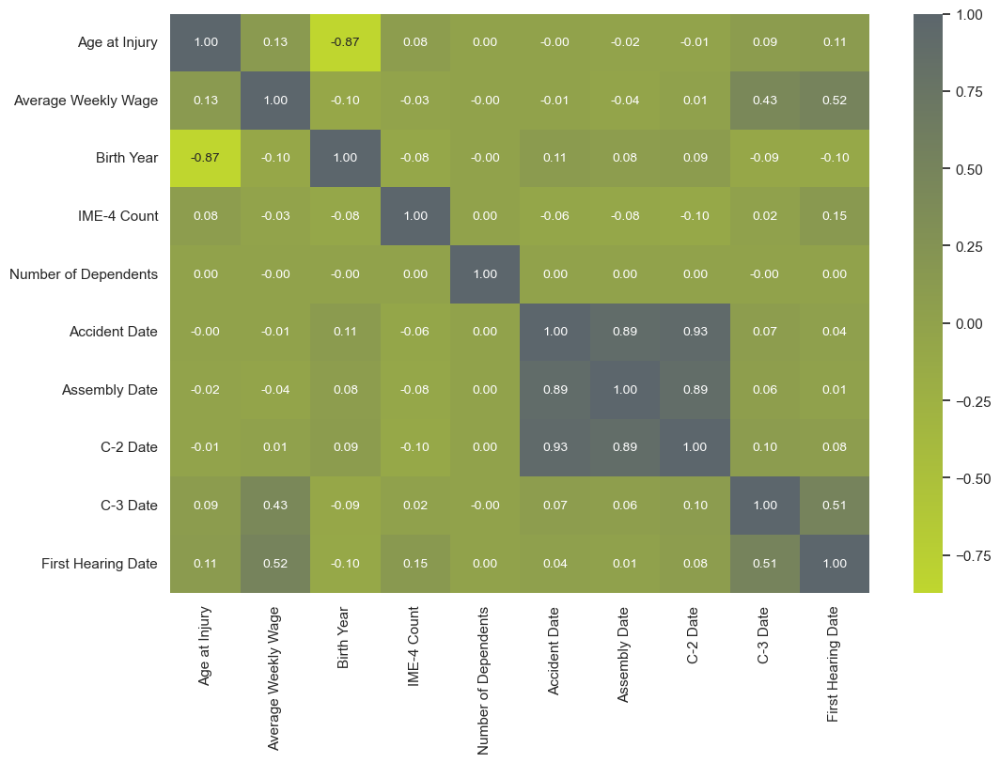

In [62]:
cor_heatmap(cor_spearman)

`Step 35.3` Ploting the Correlation matrix only displaying the values of correlation above 0.8.

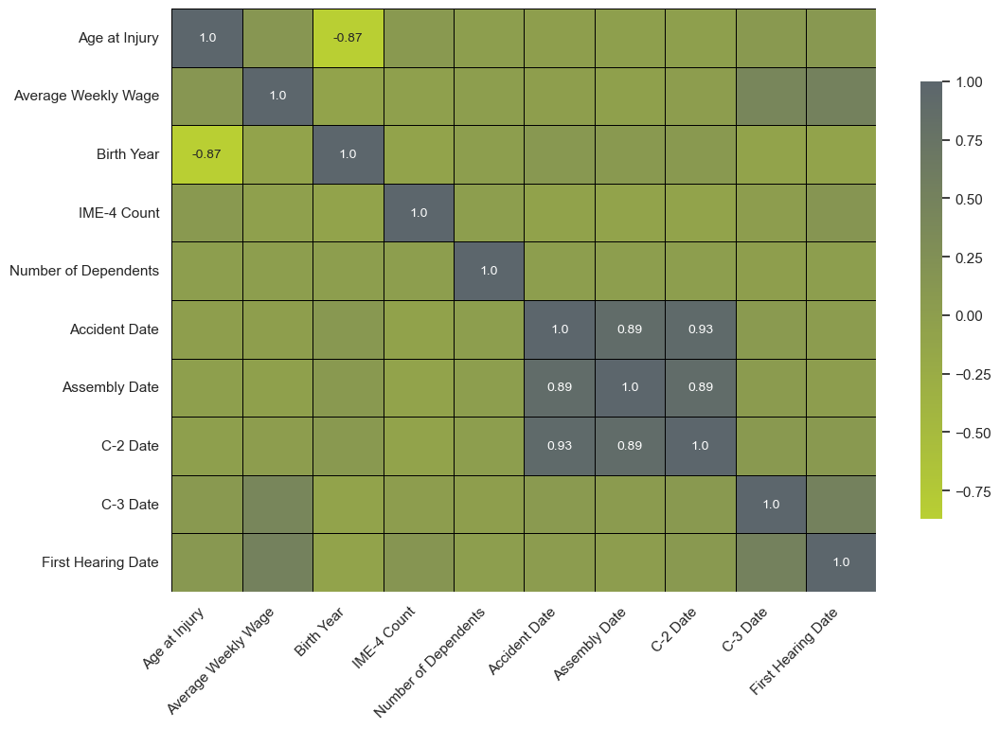

In [63]:
# Define a function cor_heatmap1 that only displays the values of correlation >= 0.8
def cor_heatmap1(cor, threshold=0.8):
    # Create a mask that displays only correlations above the threshold
    annot = np.where((cor >= threshold) | (cor <= -threshold), cor.round(2), "")  # Round numeric values
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(data=cor, annot=annot, cmap=custom_cmap, center=0, linewidths=0.5, linecolor='black',
                cbar_kws={'shrink': 0.75}, annot_kws={"size": 10}, fmt='')  # Empty format for mixed strings and floats
    plt.xticks(rotation=45, ha='right')  # Rotating x-axis labels for clarity
    plt.yticks(rotation=0)  # Ensuring y-axis labels are horizontal
    plt.show()

# Ploting the heatmap
cor_heatmap1(cor_spearman)

`Step 36` Compute the pairwise scatterplots of all numerical features in the dataset.

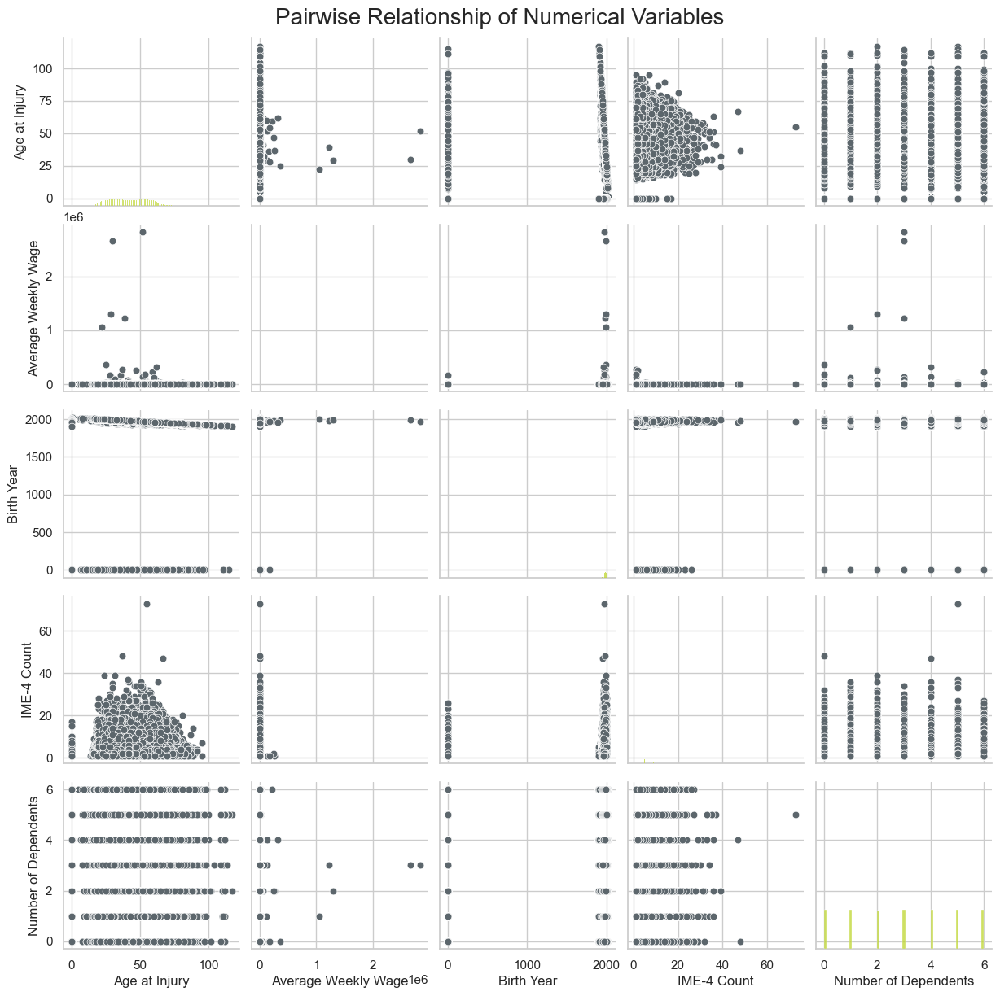

In [64]:
# Set a custom palette for pairplot
sns.set_palette([color_390, color_431])

# Customize Pairplot
sns.pairplot(df[numeric_features], diag_kind="hist", plot_kws={'s': 40, 'color': color_431})

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

# Create eda directory if not present
output_dir = os.path.join('..', 'figures', 'eda')
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    
plt.savefig(os.path.join(output_dir, 'pairwise_numeric_scatterplots.png'), dpi=200) # save the figure
plt.show()

### 3.5.2. Comparing Categorical Features

`Step 37` Plot the categorical features against `Attorney Representative`.

In [65]:
# Defining sublists with the categorical features to create the visualizations
cat_feat_few_classes = ['Alternative Dispute Resolution', 'Attorney/Representative', 'Carrier Type', 'COVID-19 Indicator', 'District Name', 'Gender', 'Medical Fee Region']
cat_feat_codes = ['Industry Code', "WCIO Cause of Injury Code", "WCIO Nature of Injury Code", "WCIO Part Of Body Code"]
cat_feat_des = ['Industry Code Description', "WCIO Cause of Injury Description", "WCIO Nature of Injury Description", "WCIO Part Of Body Description"]

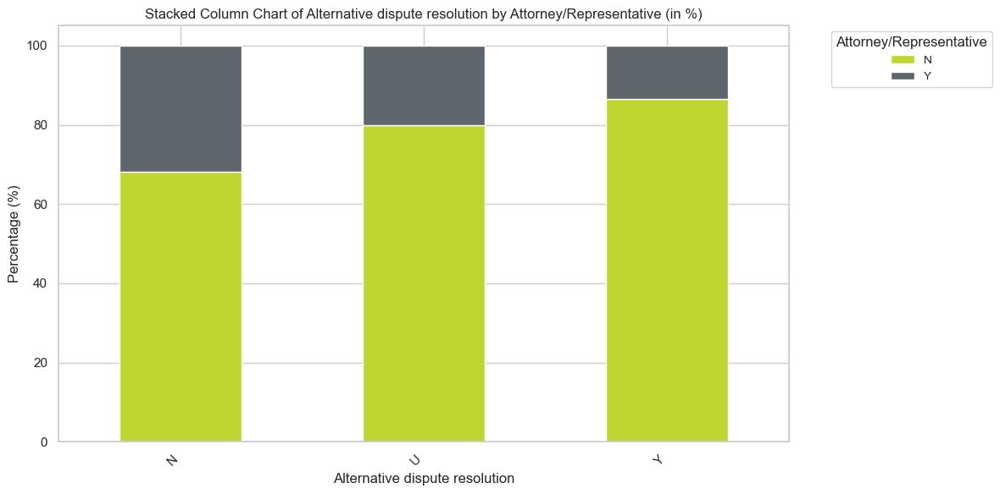

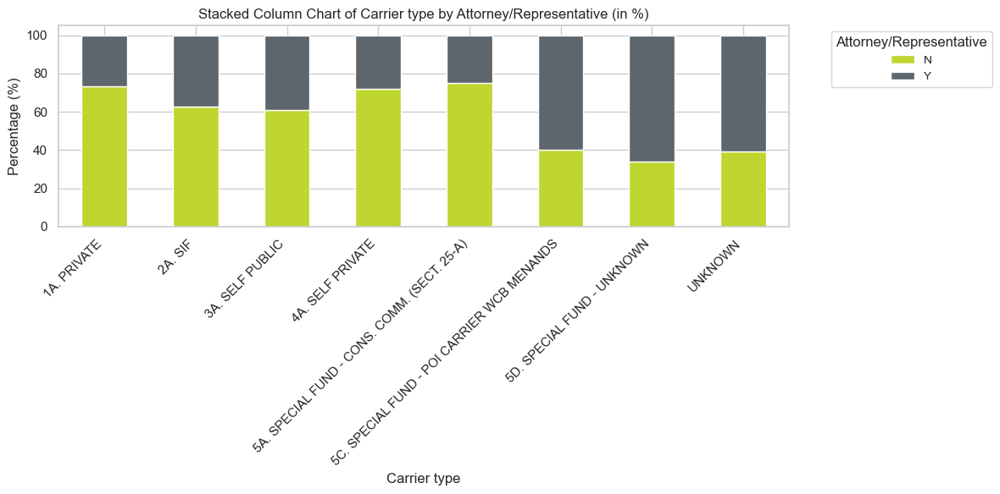

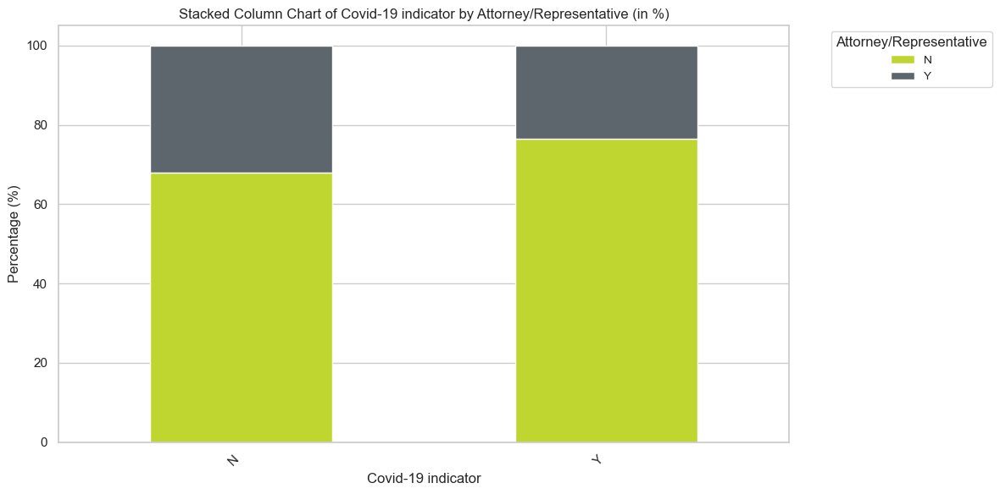

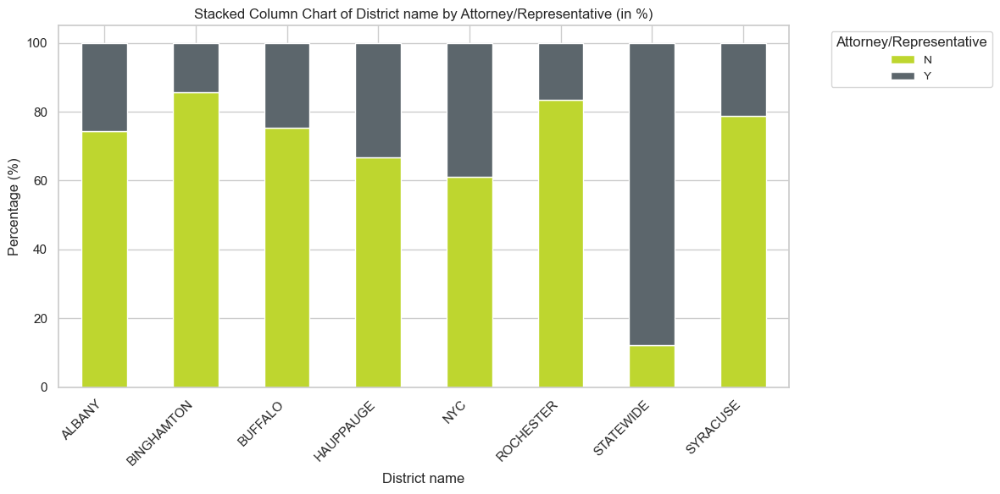

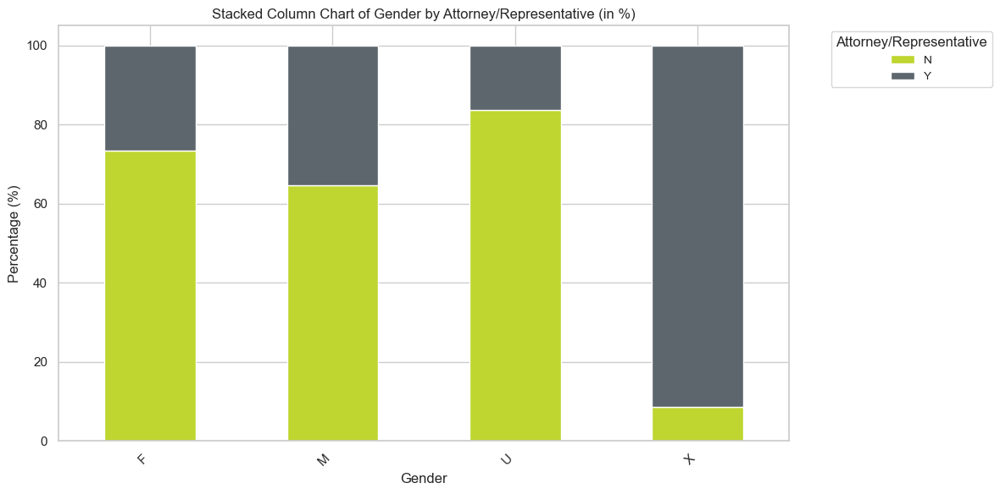

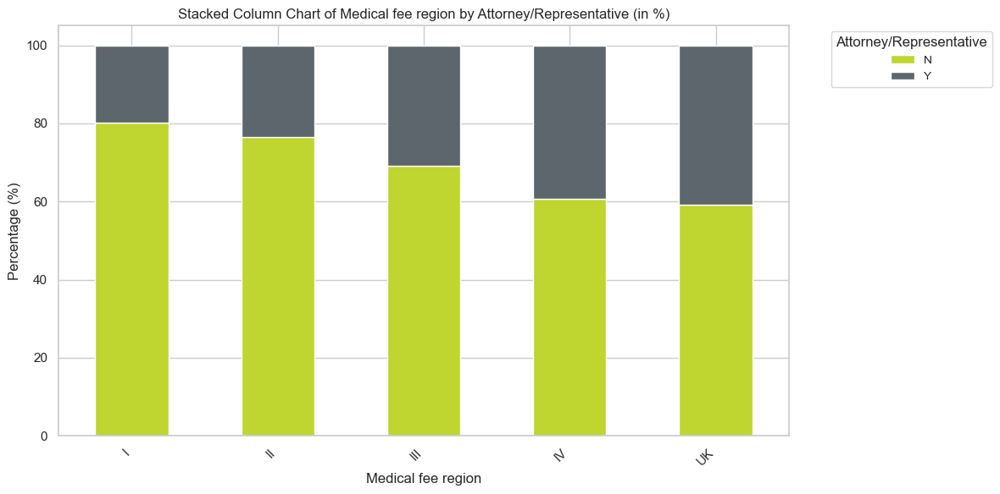

In [66]:
# Loop through the categorical features with fewer classes to create readable stacked Columns charts
for feature in cat_feat_few_classes:
    if feature != "Attorney/Representative":
        ct = pd.crosstab(df[feature], df['Attorney/Representative'])
        
        # Normalize the counts to percentages
        ct_percentage = ct.div(ct.sum(axis=1), axis=0) * 100
        
        # Plotting the stacked column chart
        ct_percentage.plot(kind='bar', stacked=True, figsize=(12, 6), color=[color_390, color_431])

        # Adding labels and title
        plt.xlabel(f'{feature.capitalize()}')
        plt.ylabel('Percentage (%)')
        plt.title(f'Stacked Column Chart of {feature.capitalize()} by Attorney/Representative (in %)')
        plt.xticks(rotation=45, ha='right')
        plt.legend(title='Attorney/Representative', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title_fontsize='medium')
        plt.tight_layout()  # Adjust layout
        plt.show()

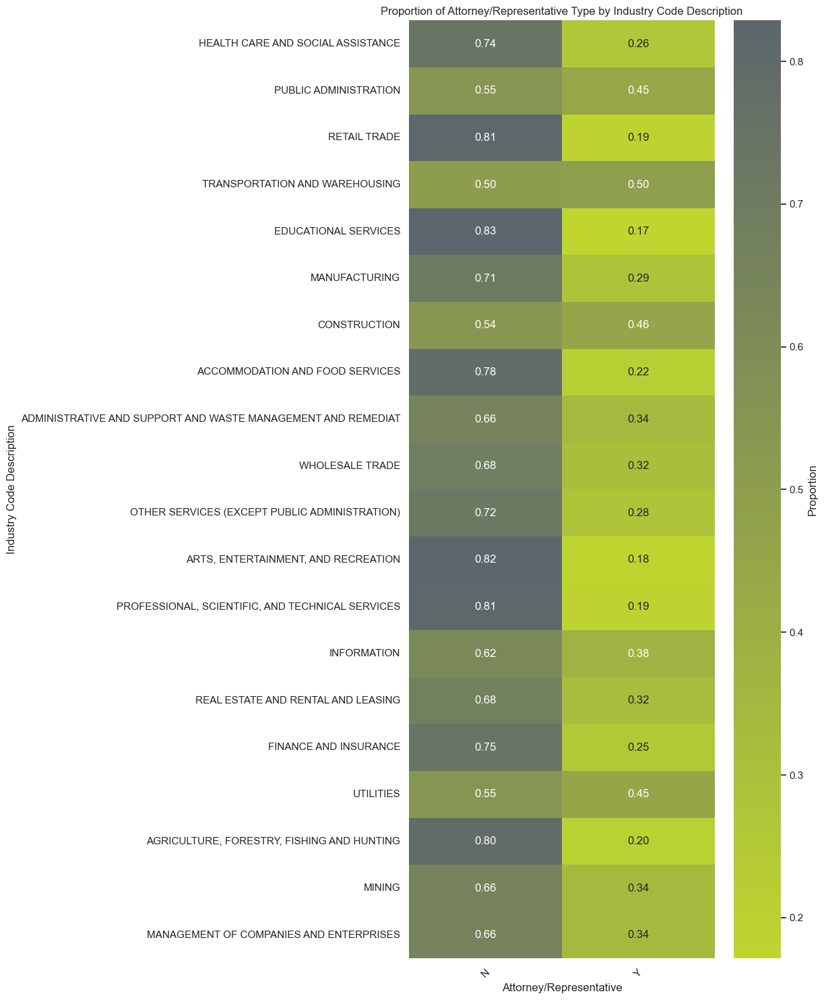

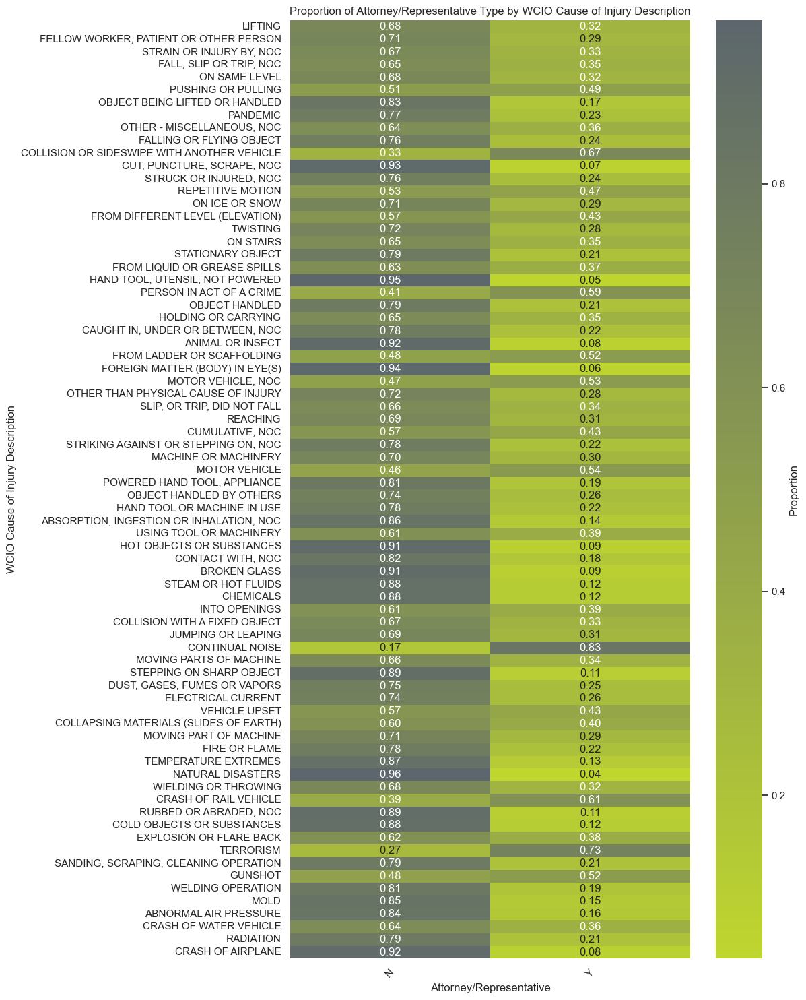

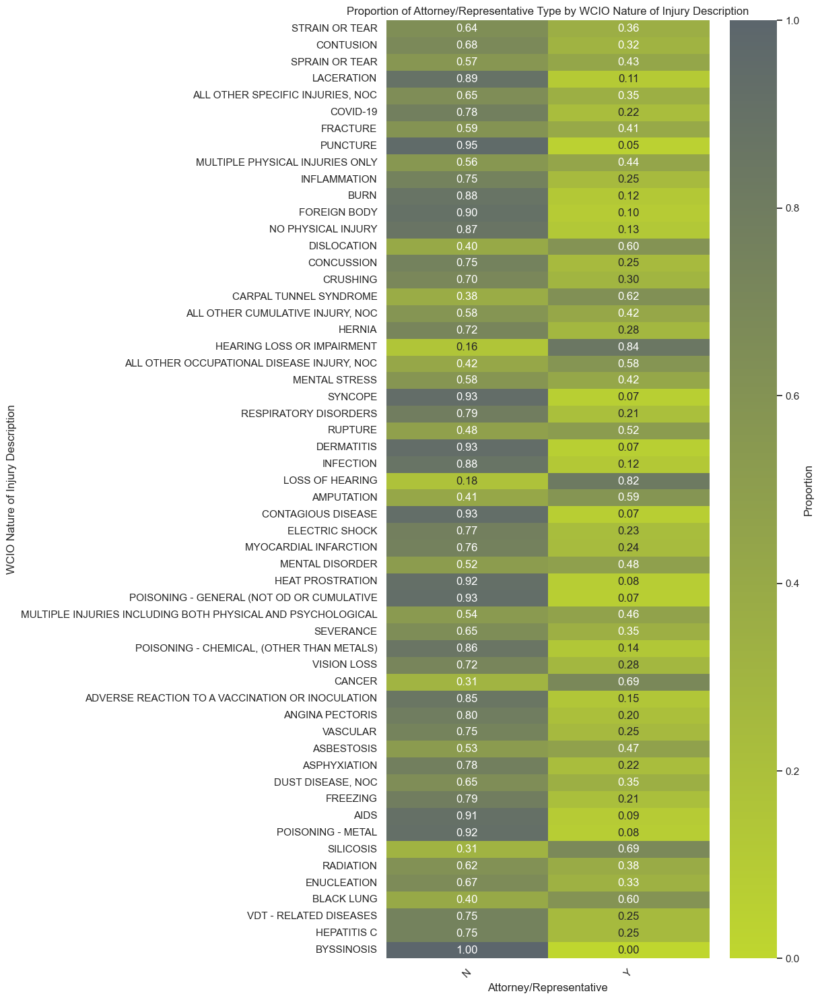

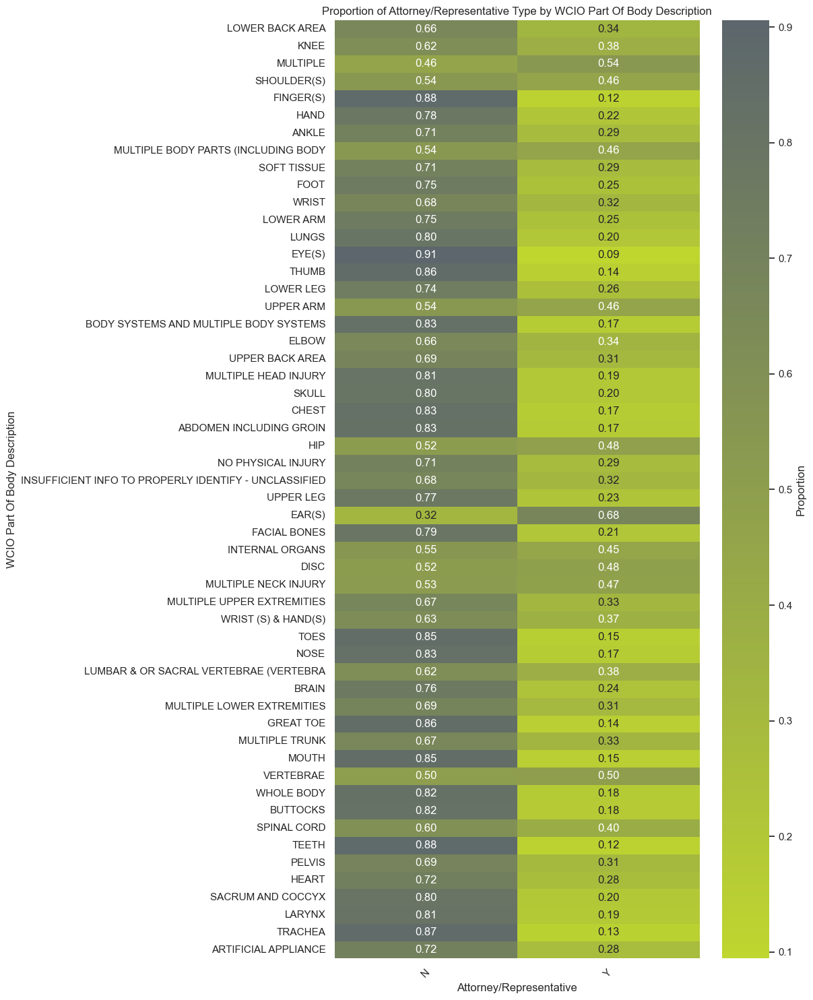

In [67]:
# Plot a proportion tab for the descriptions to better readability
for feature in cat_feat_des:
    # Calculate proportions
    prop_table = df.groupby([feature, 'Attorney/Representative']).size().unstack(fill_value=0)
    prop_table = prop_table.apply(lambda x: x / x.sum(), axis=1)  # Normalize rows to get proportions

    # Sort feature categories by descending frequency (total counts)
    category_order = df[feature].value_counts(ascending=False).index
    prop_table = prop_table.reindex(category_order) 
    # Plot as a heatmap
    plt.figure(figsize=(12, 15))
    sns.heatmap(prop_table, cmap=custom_cmap, annot=True, fmt=".2f", cbar_kws={'label': 'Proportion'})
    plt.title(f'Proportion of Attorney/Representative Type by {feature}')
    plt.xlabel('Attorney/Representative')
    plt.ylabel(feature)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

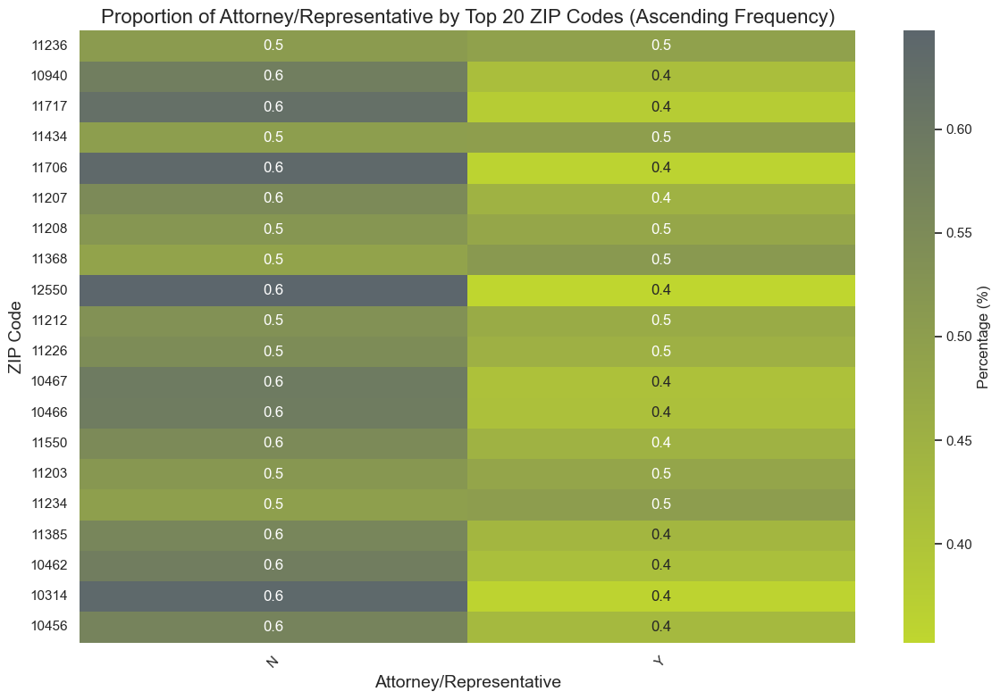

In [68]:
top_20_zip_codes = df['Zip Code'].value_counts().head(20).sort_values(ascending=False)

# Filter the DataFrame to include only rows with the top 20 ZIP codes
df_filtered = df[df['Zip Code'].isin(top_20_zip_codes.index)]

# Creat a crosstab
crosstab = pd.crosstab(df_filtered['Zip Code'], df_filtered['Attorney/Representative'])

# Normalize to get proportions
crosstab_percentage = crosstab.div(crosstab.sum(axis=1), axis=0)

# Reindex the crosstab by the ZIP codes' frequency order
crosstab_percentage = crosstab_percentage.reindex(top_20_zip_codes.index)

# Plot as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    crosstab_percentage, 
    annot=True, 
    fmt=".1f", 
    cmap=custom_cmap, 
    cbar_kws={'label': 'Percentage (%)'}
)

plt.title('Proportion of Attorney/Representative by Top 20 ZIP Codes (Ascending Frequency)', fontsize=16)
plt.xlabel('Attorney/Representative', fontsize=14)
plt.ylabel('ZIP Code', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

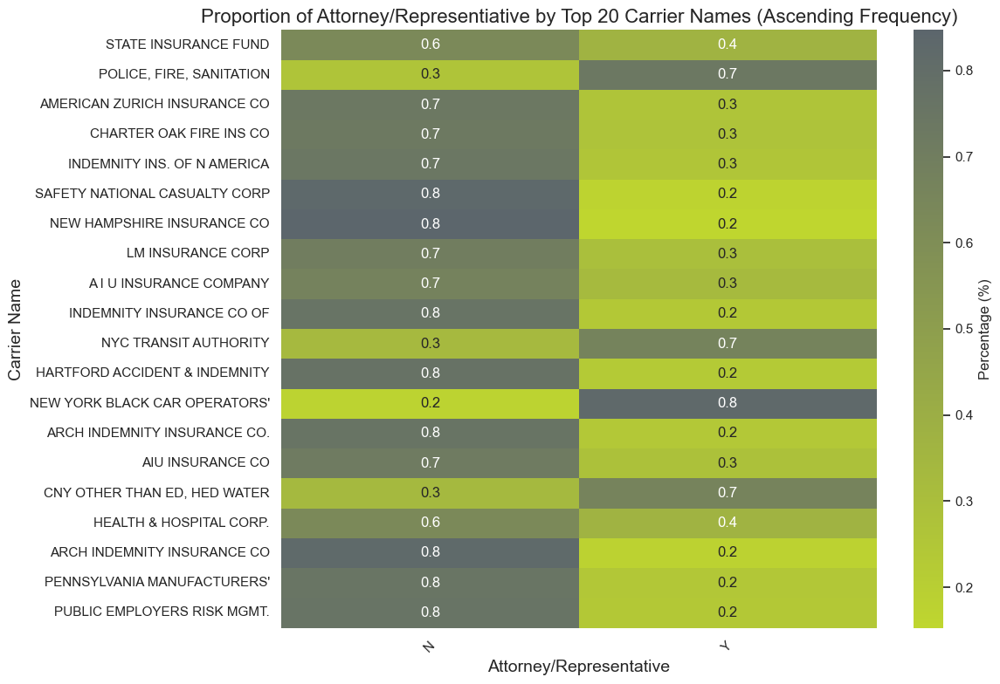

In [69]:
top_20_carrier_names = df['Carrier Name'].value_counts().head(20).sort_values(ascending=False)

# Filter the DataFrame to include only rows with the top 20 Carrier Names
df_filtered = df[df['Carrier Name'].isin(top_20_carrier_names.index)]

# Create a crosstab
crosstab = pd.crosstab(df_filtered['Carrier Name'], df_filtered['Attorney/Representative'])

# Normalize to get proportions
crosstab_percentage = crosstab.div(crosstab.sum(axis=1), axis=0)

# Reindex the crosstab by the Carrier Names' frequency order
crosstab_percentage = crosstab_percentage.reindex(top_20_carrier_names.index)

# Plot as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    crosstab_percentage, 
    annot=True, 
    fmt=".1f", 
    cmap=custom_cmap, 
    cbar_kws={'label': 'Percentage (%)'}
)

plt.title('Proportion of Attorney/Representiative by Top 20 Carrier Names (Ascending Frequency)', fontsize=16)
plt.xlabel('Attorney/Representative', fontsize=14)
plt.ylabel('Carrier Name', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

`Step 38` Plot the categorical features (excluding Zip Code) against `Carrier Type`.

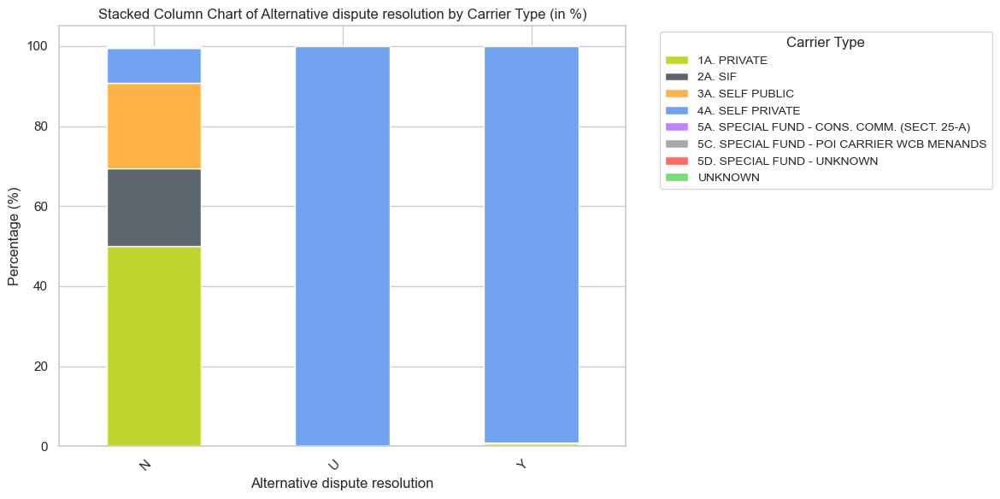

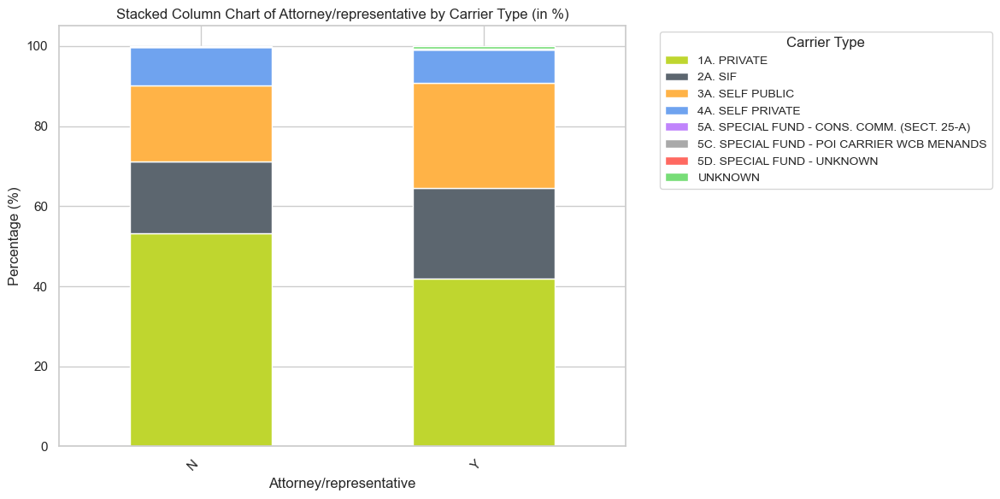

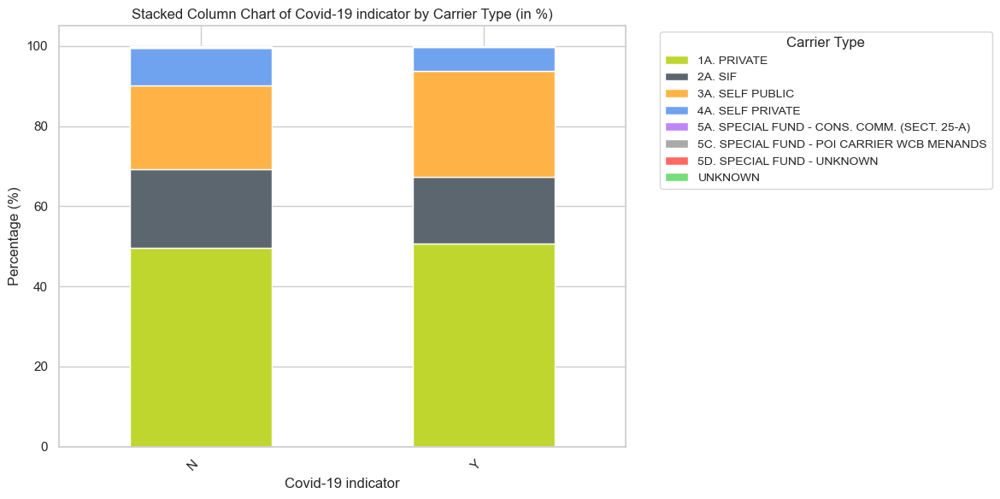

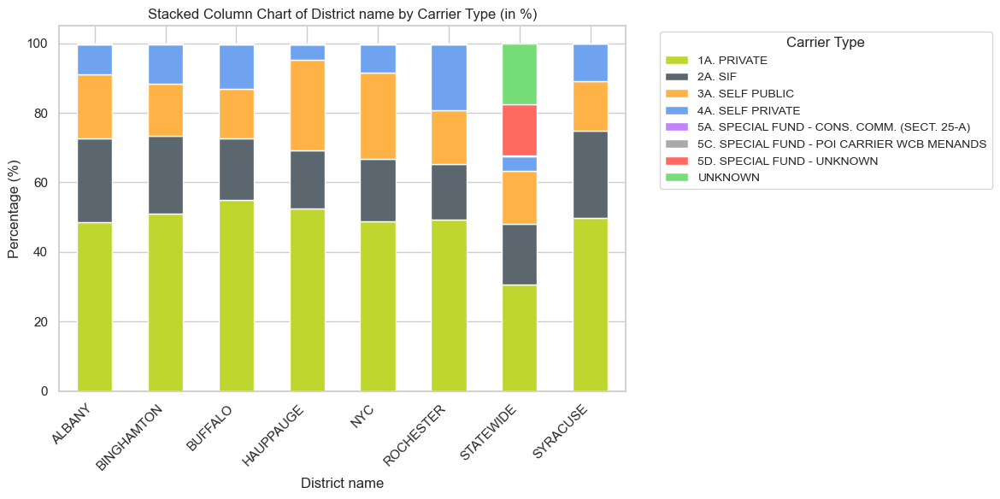

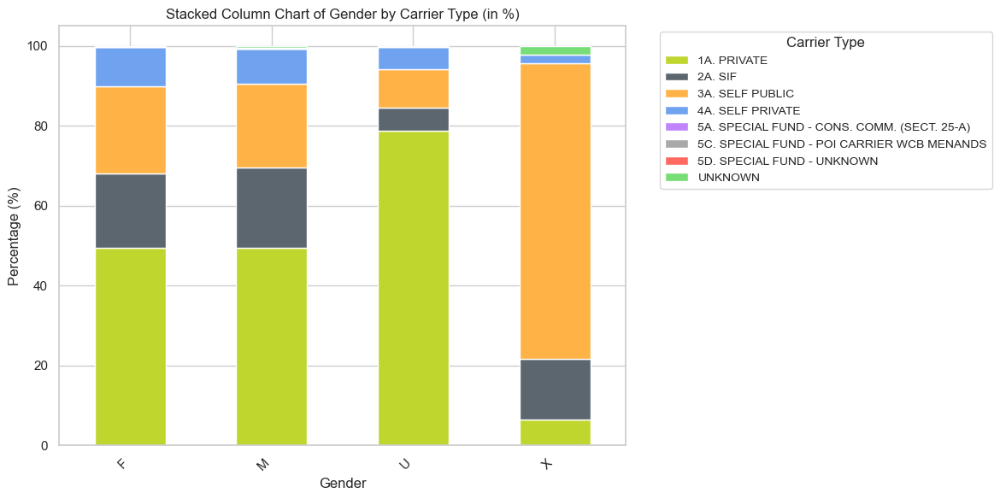

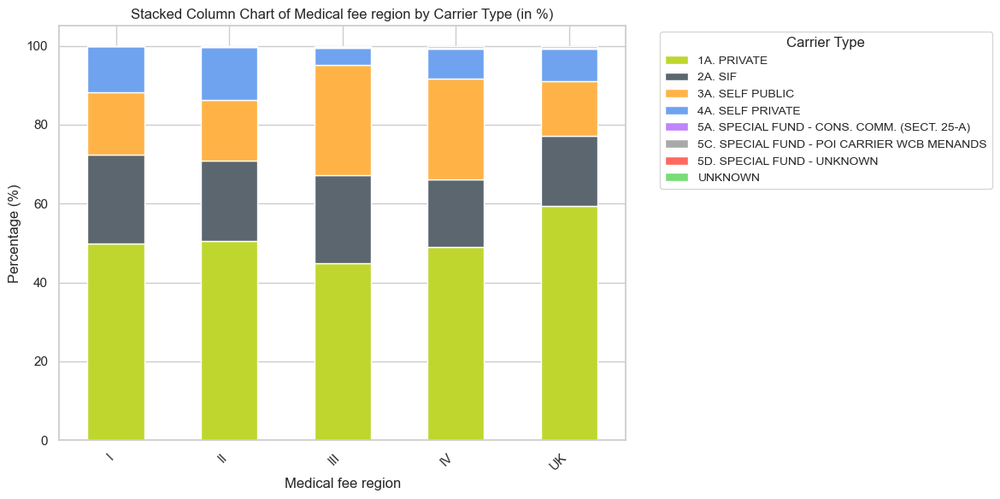

In [70]:
custom_palette = [
    '#BFD62F',  # Green (Pantone 390 C)
    '#5C666F',
    '#FFB347',  
    '#6FA3EF',  
    '#C084FC',  
    '#A9A9A9',  
    '#FF6961',  
    '#77DD77',  
    '#696969'   
]

# Set the palette globally
sns.set_palette(custom_palette)

# Loop through the categorical features
for feature in cat_feat_few_classes:
    if feature != "Carrier Type":
        # Create a crosstab
        ct = pd.crosstab(df[feature], df['Carrier Type'])
        
        # Normalize the counts to percentages
        ct_percentage = ct.div(ct.sum(axis=1), axis=0) * 100

        # Plotting the stacked column chart with the custom palette applied globally
        ct_percentage.plot(
            kind='bar', 
            stacked=True, 
            figsize=(12, 6)
        )

        # Adding labels and title
        plt.xlabel(f'{feature.capitalize()}')
        plt.ylabel('Percentage (%)')
        plt.title(f'Stacked Column Chart of {feature.capitalize()} by Carrier Type (in %)')
        plt.xticks(rotation=45, ha='right')
        plt.legend(
            title='Carrier Type', 
            bbox_to_anchor=(1.05, 1), 
            loc='upper left', 
            fontsize='small', 
            title_fontsize='medium'
        )
        plt.tight_layout()  # Adjust layout
        plt.show()

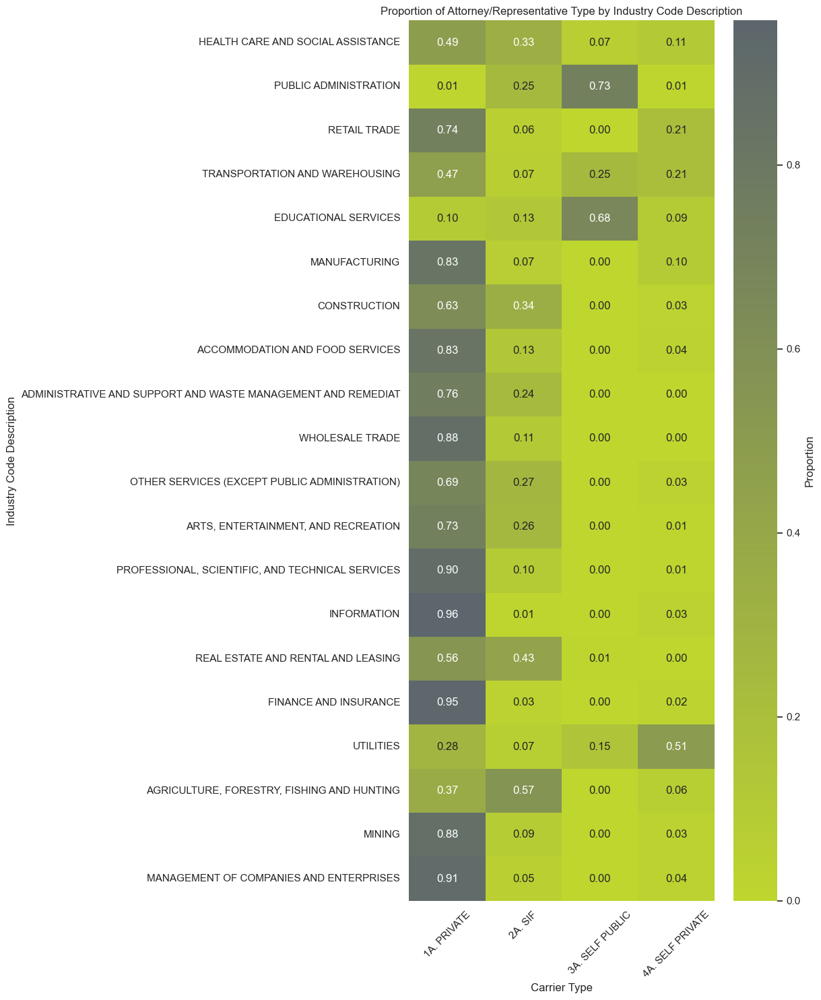

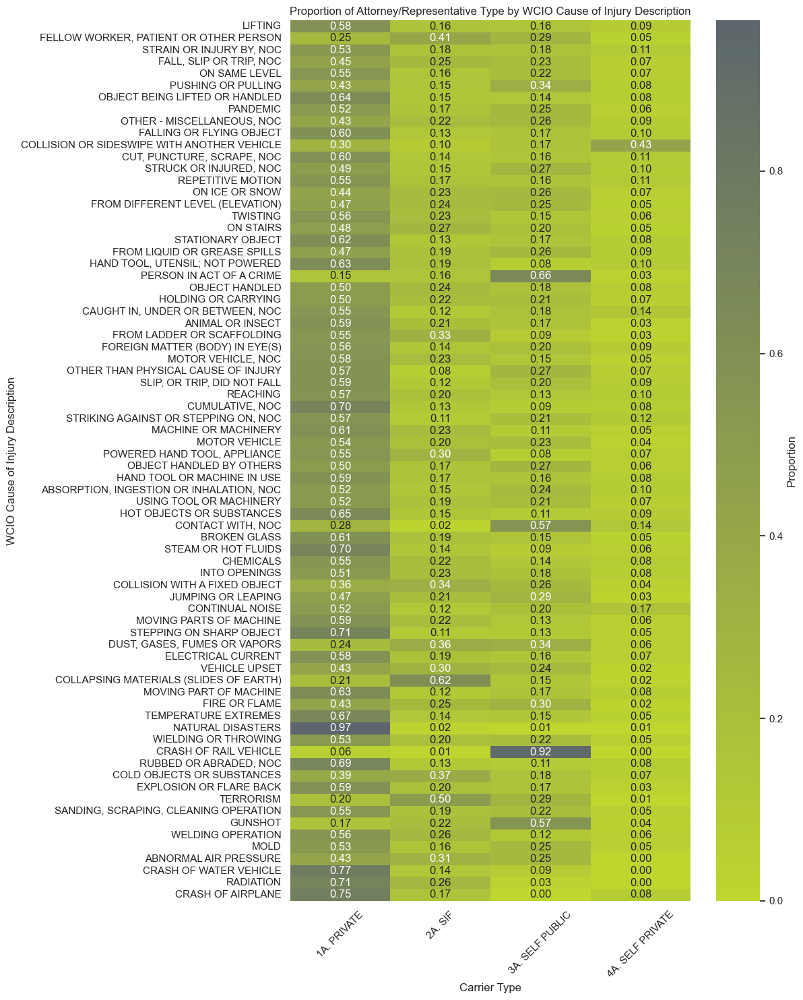

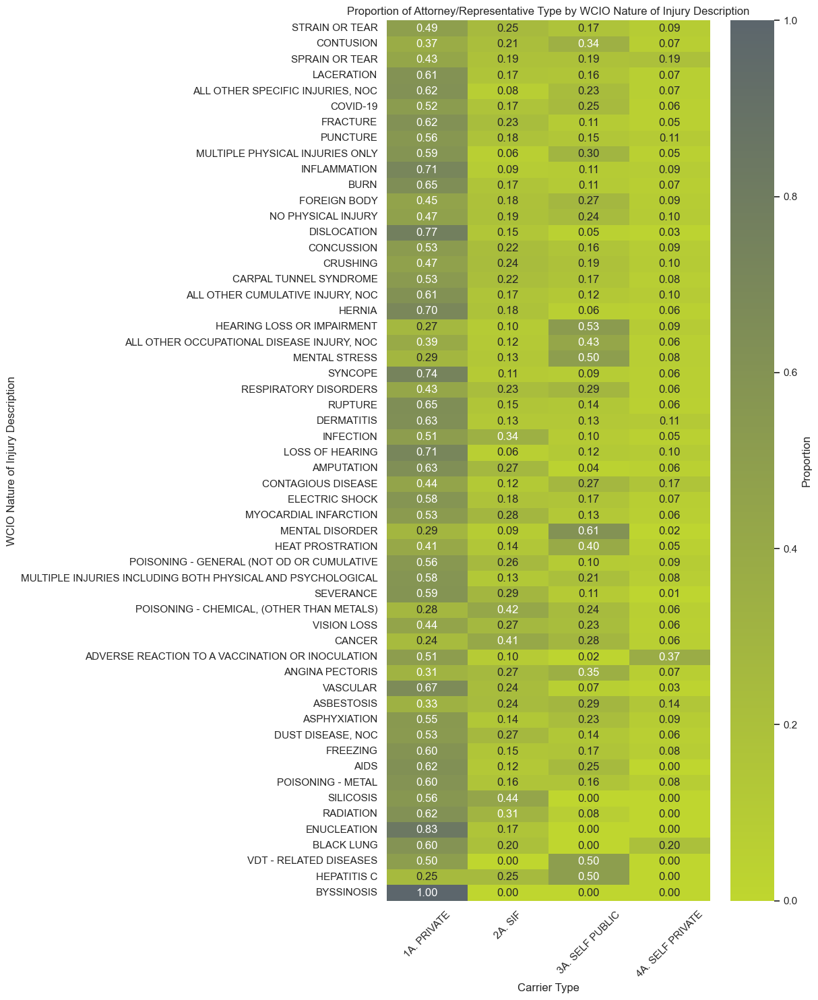

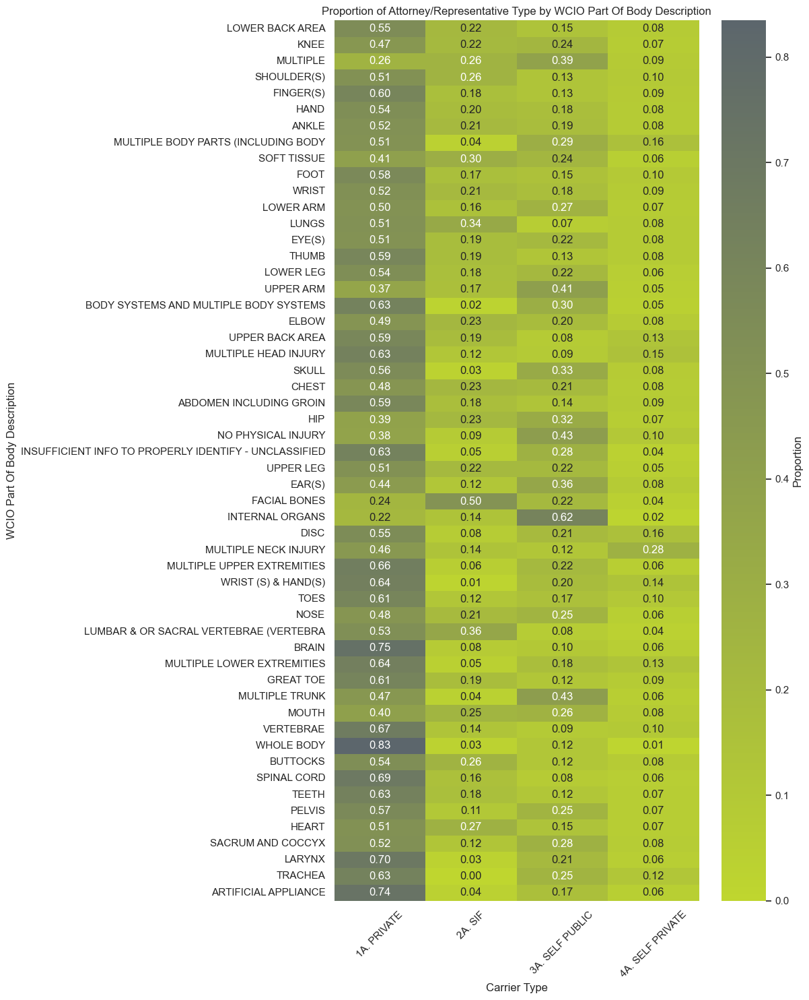

In [71]:
top_n = 4

# Identify the most common Carrier Types, because usign all the carrier types in this visualization would amke it not readable
top_carrier_types = df['Carrier Type'].value_counts().nlargest(top_n).index

# Loop over each feature in cat_feat_des
for feature in cat_feat_des:
    # Calculate proportions
    prop_table = df[df['Carrier Type'].isin(top_carrier_types)].groupby([feature, 'Carrier Type']).size().unstack(fill_value=0)
    prop_table = prop_table.apply(lambda x: x / x.sum(), axis=1)  # Normalize rows to get proportions

    # Sort feature categories by descending frequency (total counts)
    category_order = df[feature].value_counts(ascending=False).index
    prop_table = prop_table.reindex(category_order) 
    # Plot as a heatmap
    plt.figure(figsize=(12, 15))
    sns.heatmap(prop_table, cmap=custom_cmap, annot=True, fmt=".2f", cbar_kws={'label': 'Proportion'})
    plt.title(f'Proportion of Attorney/Representative Type by {feature}')
    plt.xlabel('Carrier Type')
    plt.ylabel(feature)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

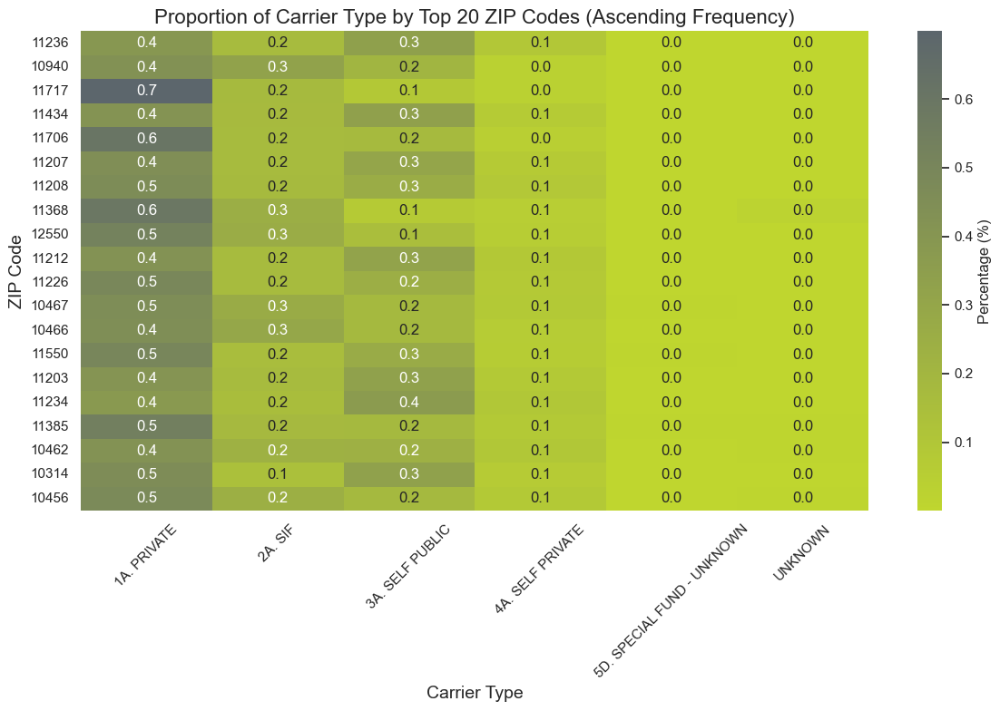

In [72]:
top_20_zip_codes = df['Zip Code'].value_counts().head(20).sort_values(ascending=False)

# Filter the DataFrame to include only rows with the top 20 ZIP codes
df_filtered = df[df['Zip Code'].isin(top_20_zip_codes.index)]

# Create a crosstab
crosstab = pd.crosstab(df_filtered['Zip Code'], df_filtered['Carrier Type'])

# Normalize to get proportions
crosstab_percentage = crosstab.div(crosstab.sum(axis=1), axis=0)

# Reindex the crosstab by the ZIP codes' frequency order
crosstab_percentage = crosstab_percentage.reindex(top_20_zip_codes.index)

# Plot as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    crosstab_percentage, 
    annot=True, 
    fmt=".1f", 
    cmap=custom_cmap, 
    cbar_kws={'label': 'Percentage (%)'}
)

plt.title('Proportion of Carrier Type by Top 20 ZIP Codes (Ascending Frequency)', fontsize=16)
plt.xlabel('Carrier Type', fontsize=14)
plt.ylabel('ZIP Code', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

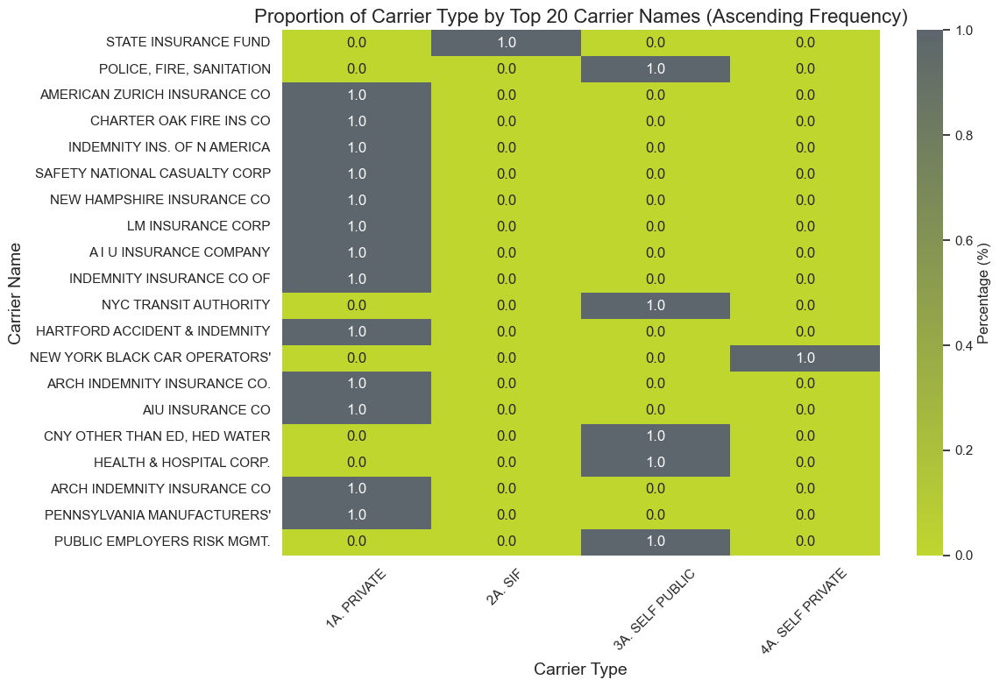

In [73]:
top_20_carrier_names = df['Carrier Name'].value_counts().head(20).sort_values(ascending=False)

# Filter the DataFrame to include only rows with the top 20 Carrier Names
df_filtered = df[df['Carrier Name'].isin(top_20_carrier_names.index)]

# Create a crosstab
crosstab = pd.crosstab(df_filtered['Carrier Name'], df_filtered['Carrier Type'])

# Normalize to get proportions
crosstab_percentage = crosstab.div(crosstab.sum(axis=1), axis=0)

# Reindex the crosstab by the Carrier Names' frequency order
crosstab_percentage = crosstab_percentage.reindex(top_20_carrier_names.index)

# Plot as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    crosstab_percentage, 
    annot=True, 
    fmt=".1f", 
    cmap=custom_cmap, 
    cbar_kws={'label': 'Percentage (%)'}
)

plt.title('Proportion of Carrier Type by Top 20 Carrier Names (Ascending Frequency)', fontsize=16)
plt.xlabel('Carrier Type', fontsize=14)
plt.ylabel('Carrier Name', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

`Step 39` Plot the categorical features against `COVID-19 Indicator`.

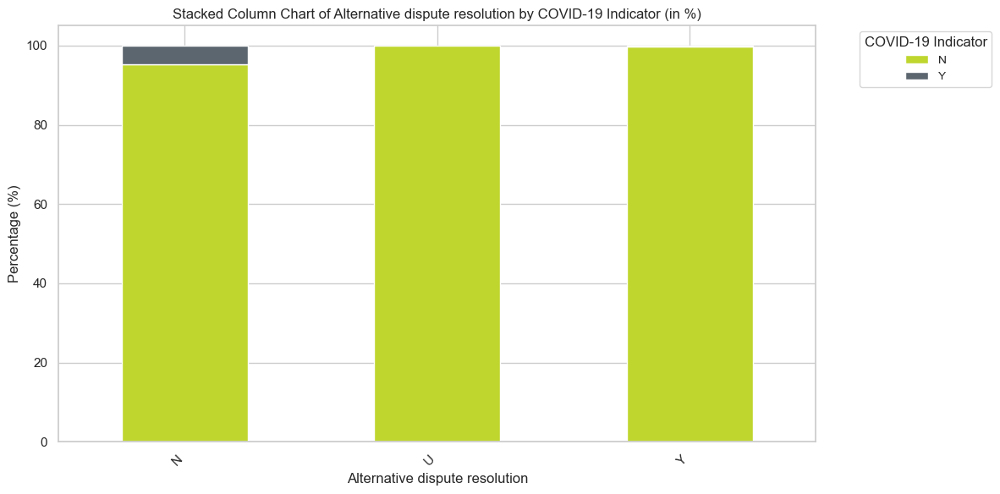

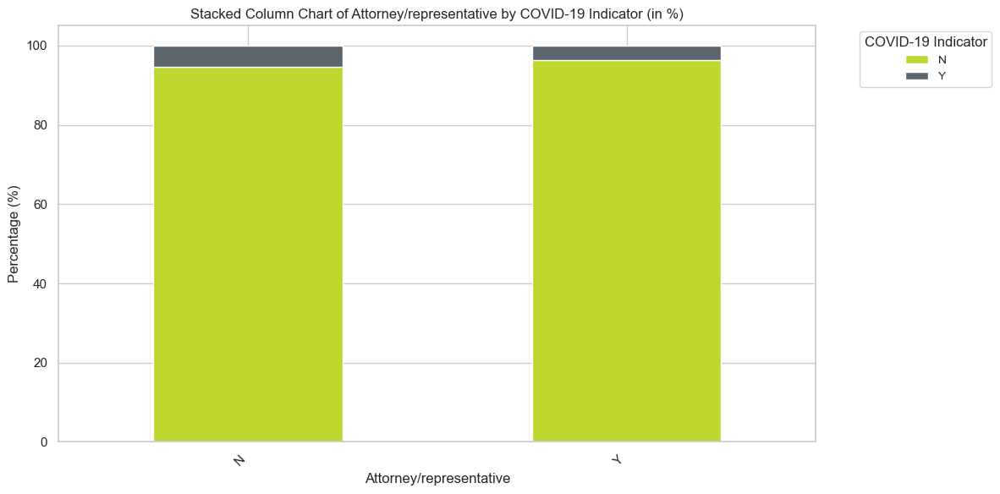

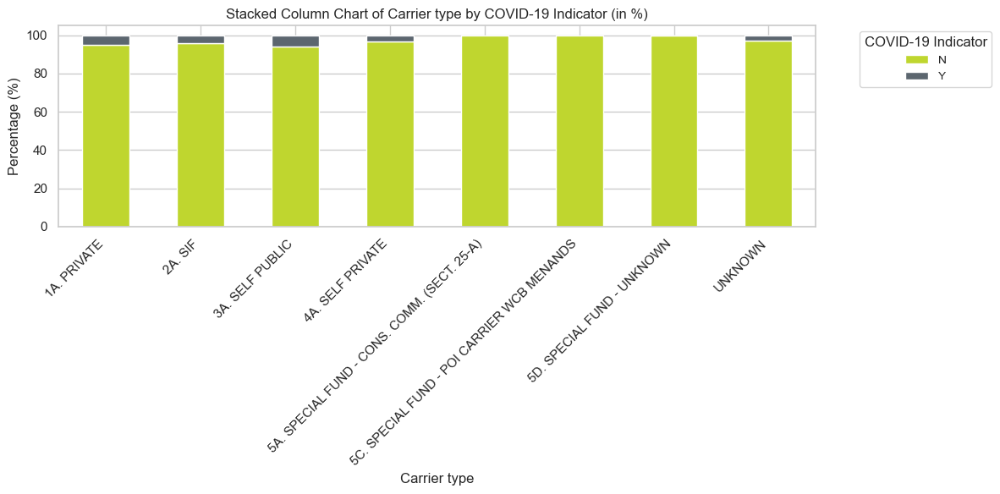

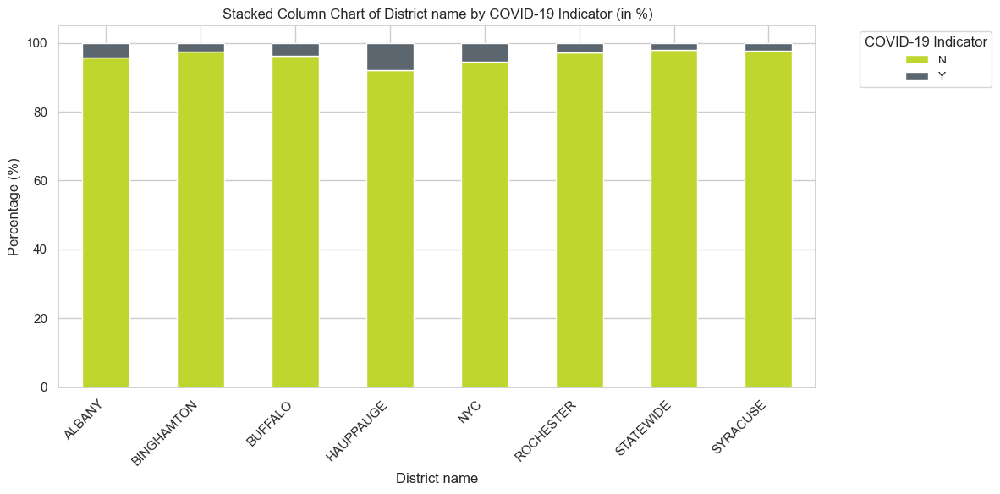

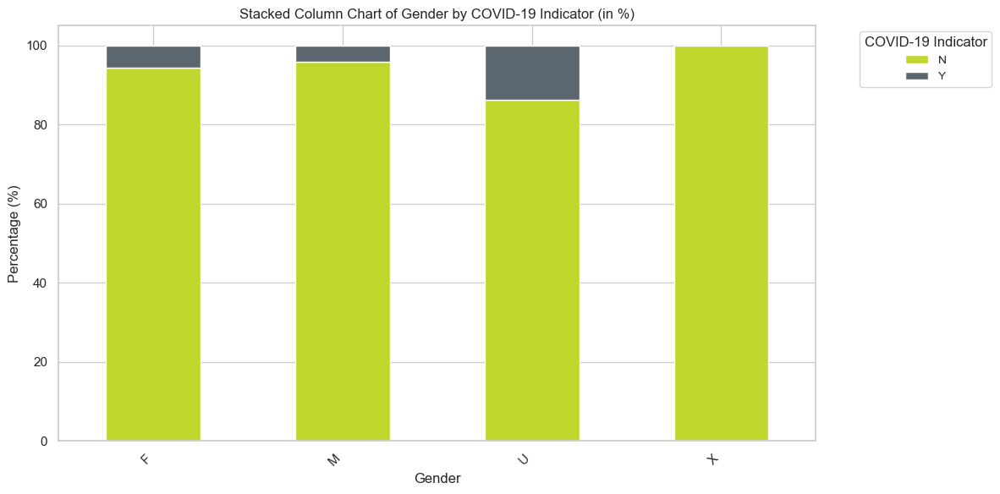

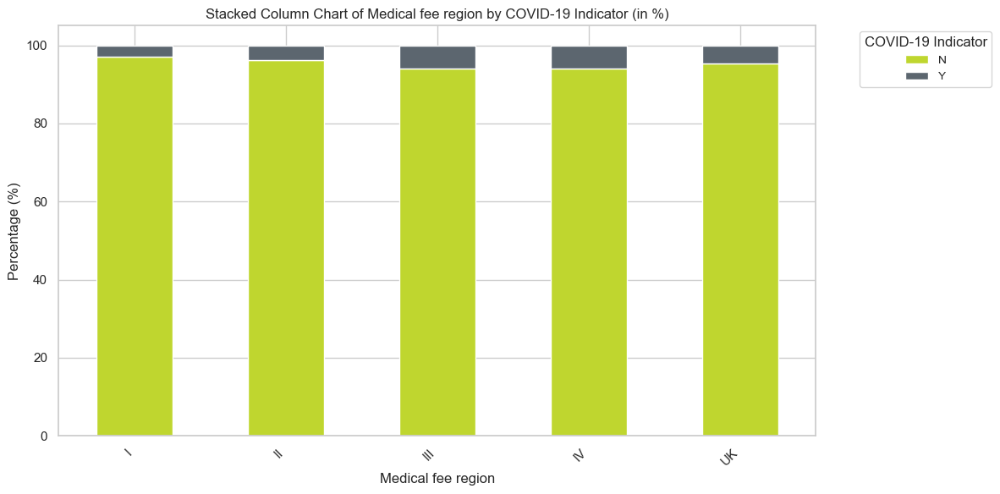

In [74]:
for feature in cat_feat_few_classes:
    if feature != "COVID-19 Indicator":
        # Create a crosstab
        ct = pd.crosstab(df[feature], df['COVID-19 Indicator'])
        
        # Normalize the counts to percentages
        ct_percentage = ct.div(ct.sum(axis=1), axis=0) * 100
        
        # Plotting the stacked column chart
        ct_percentage.plot(kind='bar', stacked=True, figsize=(12, 6))

        # Adding labels and title
        plt.xlabel(f'{feature.capitalize()}')
        plt.ylabel('Percentage (%)')
        plt.title(f'Stacked Column Chart of {feature.capitalize()} by COVID-19 Indicator (in %)')
        plt.xticks(rotation=45, ha='right')
        plt.legend(title='COVID-19 Indicator', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title_fontsize='medium')
        plt.tight_layout()  # Adjust layout
        plt.show()

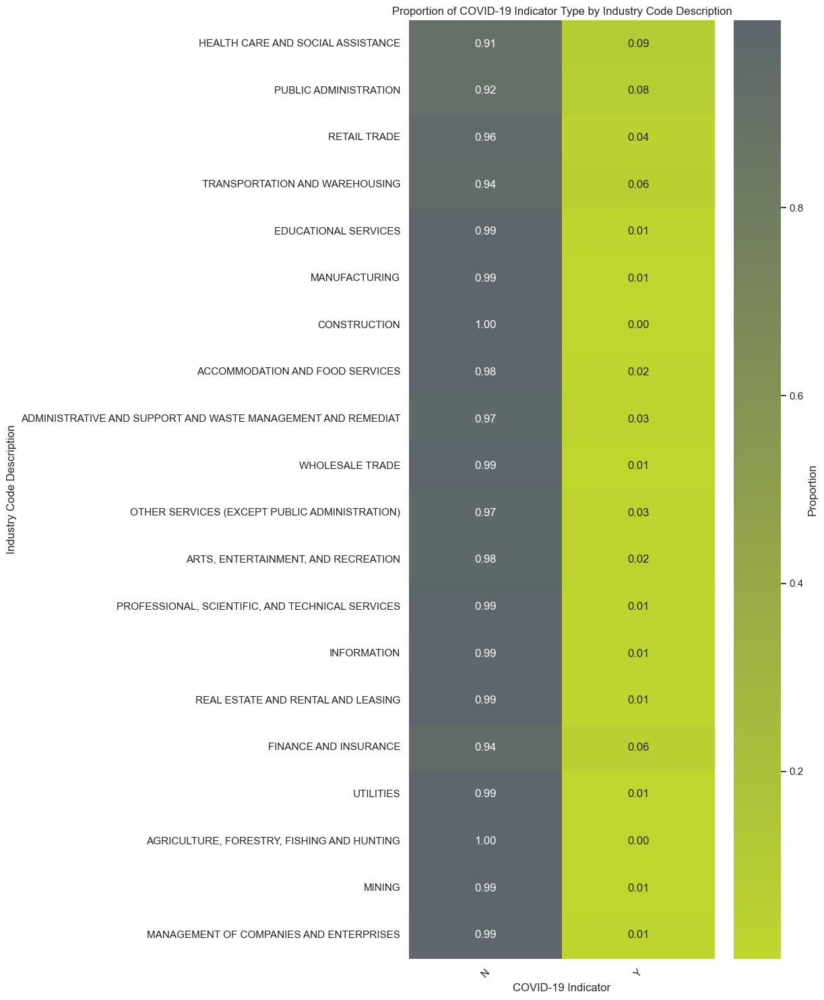

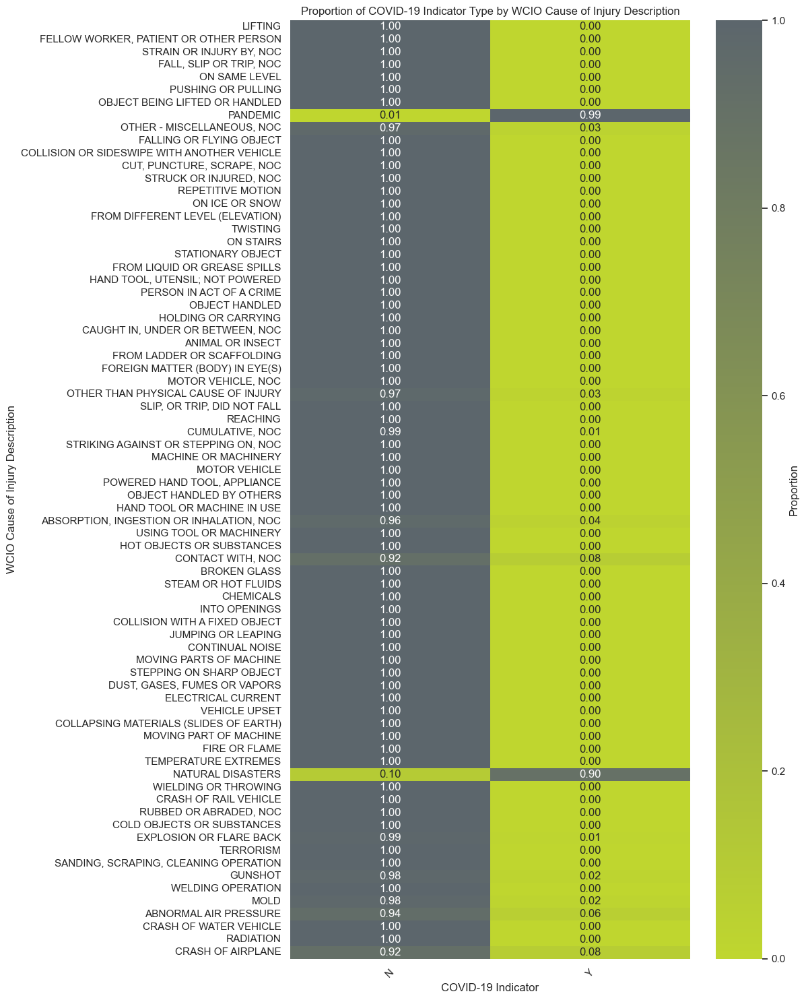

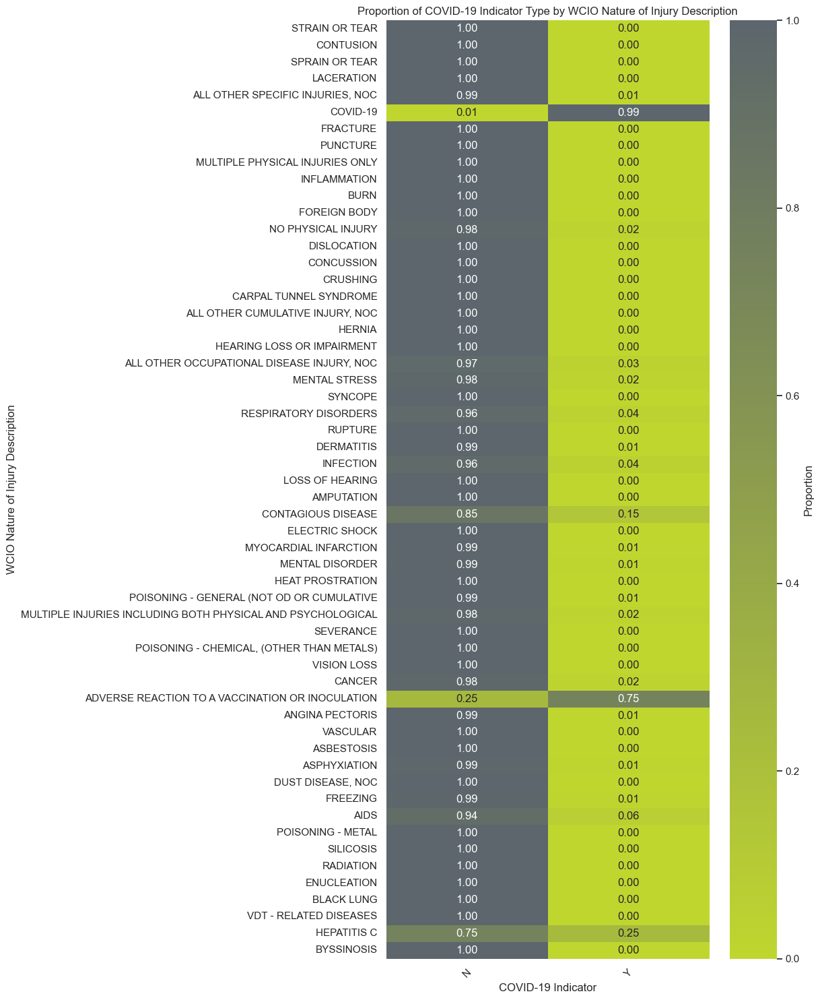

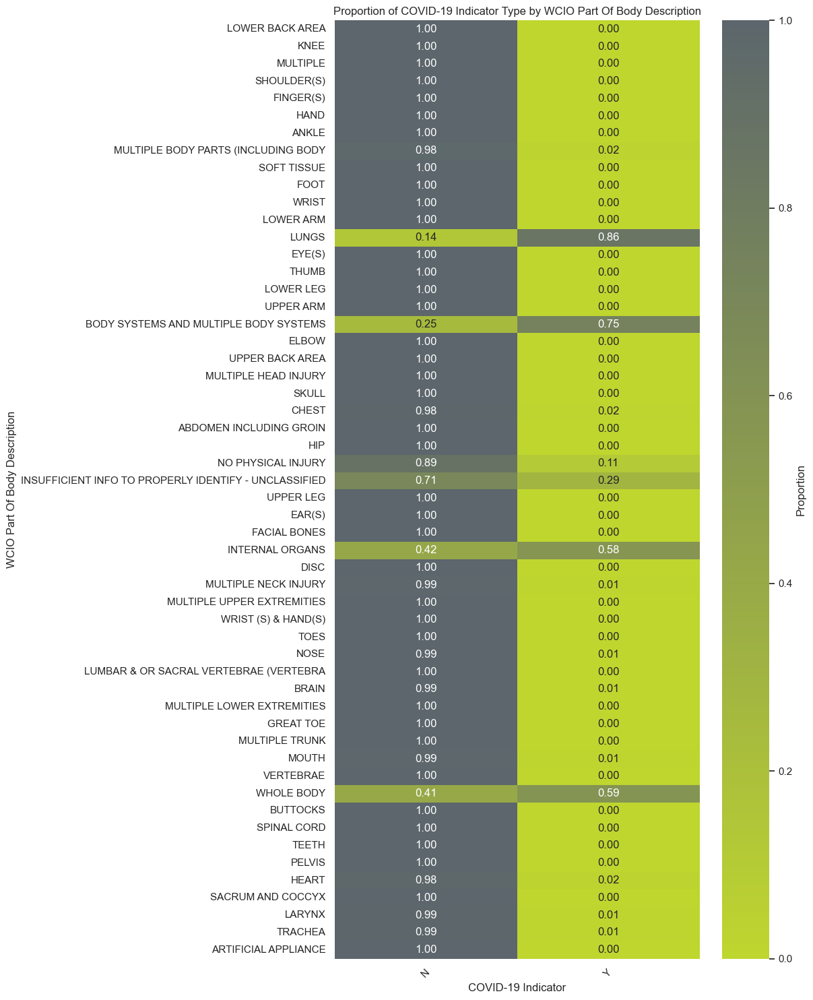

In [75]:
for feature in cat_feat_des:
    # Calculate proportions for each category
    prop_table = df.groupby([feature, 'COVID-19 Indicator']).size().unstack(fill_value=0)
    prop_table = prop_table.apply(lambda x: x / x.sum(), axis=1)  # Normalize rows to get proportions

        # Sort feature categories by descending frequency (total counts)
    category_order = df[feature].value_counts(ascending=False).index
    prop_table = prop_table.reindex(category_order) 
    
    # Plot as a heatmap
    plt.figure(figsize=(12, 15))
    sns.heatmap(prop_table, cmap=custom_cmap, annot=True, fmt=".2f", cbar_kws={'label': 'Proportion'})
    plt.title(f'Proportion of COVID-19 Indicator Type by {feature}')
    plt.xlabel('COVID-19 Indicator')
    plt.ylabel(feature)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

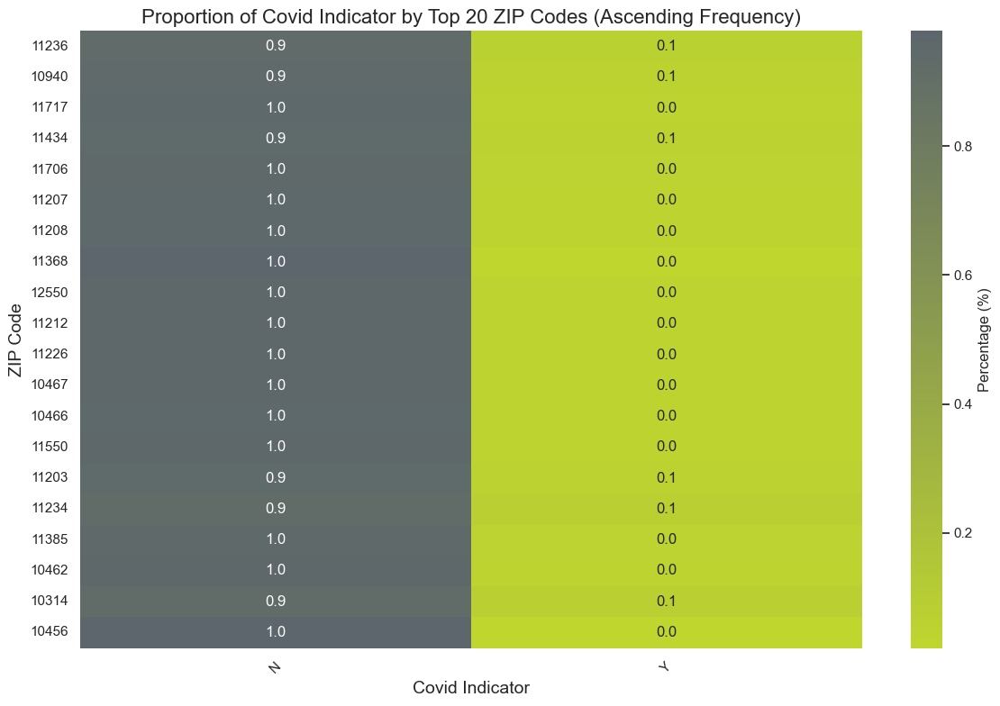

In [76]:
top_20_zip_codes = df['Zip Code'].value_counts().head(20).sort_values(ascending=False)

# Filter the DataFrame to include only rows with the top 20 ZIP codes
df_filtered = df[df['Zip Code'].isin(top_20_zip_codes.index)]

# Create a crosstab
crosstab = pd.crosstab(df_filtered['Zip Code'], df_filtered['COVID-19 Indicator'])

# Normalize to get proportions
crosstab_percentage = crosstab.div(crosstab.sum(axis=1), axis=0)

# Reindex the crosstab by the ZIP codes' frequency order
crosstab_percentage = crosstab_percentage.reindex(top_20_zip_codes.index)

# Plot as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    crosstab_percentage, 
    annot=True, 
    fmt=".1f", 
    cmap=custom_cmap, 
    cbar_kws={'label': 'Percentage (%)'}
)

plt.title('Proportion of Covid Indicator by Top 20 ZIP Codes (Ascending Frequency)', fontsize=16)
plt.xlabel('Covid Indicator', fontsize=14)
plt.ylabel('ZIP Code', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

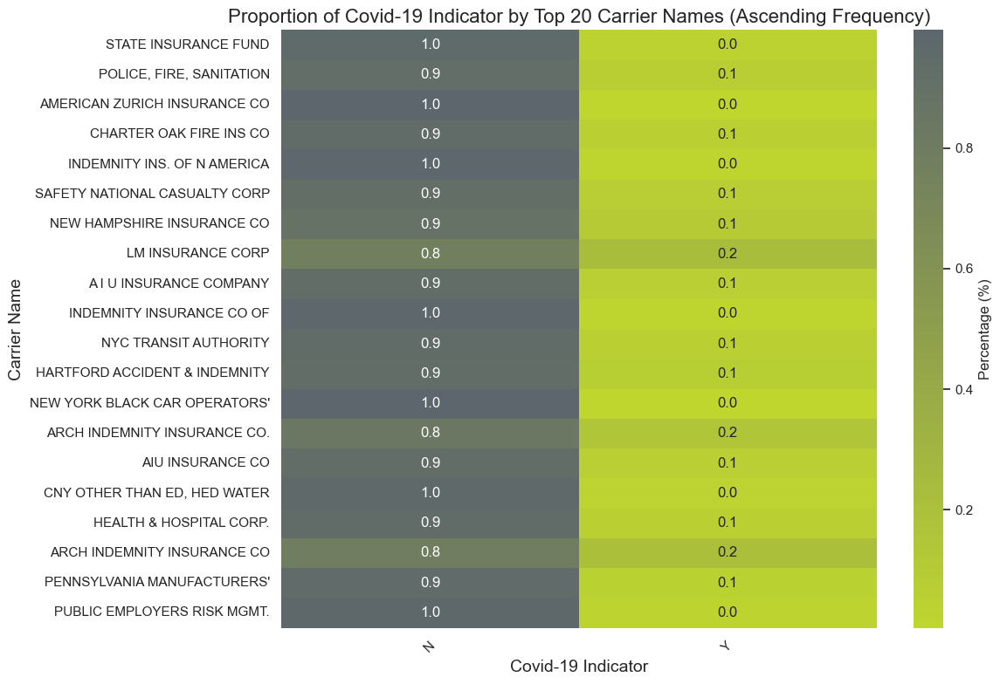

In [77]:
top_20_carrier_names = df['Carrier Name'].value_counts().head(20).sort_values(ascending=False)

# Filter the DataFrame to include only rows with the top 20 Carrier Names
df_filtered = df[df['Carrier Name'].isin(top_20_carrier_names.index)]

# Create a crosstab
crosstab = pd.crosstab(df_filtered['Carrier Name'], df_filtered['COVID-19 Indicator'])

# Normalize to get proportions
crosstab_percentage = crosstab.div(crosstab.sum(axis=1), axis=0)

# Reindex the crosstab by the Carrier Names' frequency order
crosstab_percentage = crosstab_percentage.reindex(top_20_carrier_names.index)

# Plot as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    crosstab_percentage, 
    annot=True, 
    fmt=".1f", 
    cmap=custom_cmap, 
    cbar_kws={'label': 'Percentage (%)'}
)

plt.title('Proportion of Covid-19 Indicator by Top 20 Carrier Names (Ascending Frequency)', fontsize=16)
plt.xlabel('Covid-19 Indicator', fontsize=14)
plt.ylabel('Carrier Name', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

`Step 40` Plot the categorical features against `Gender`.

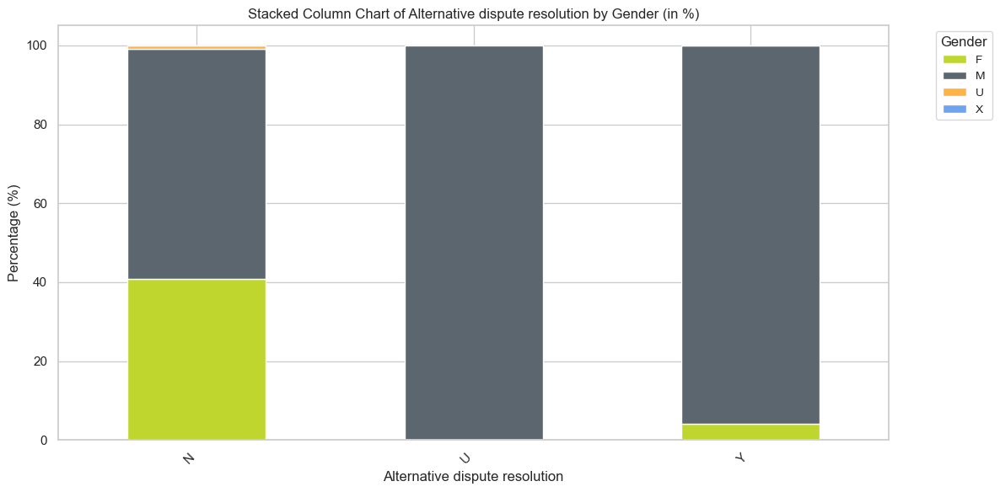

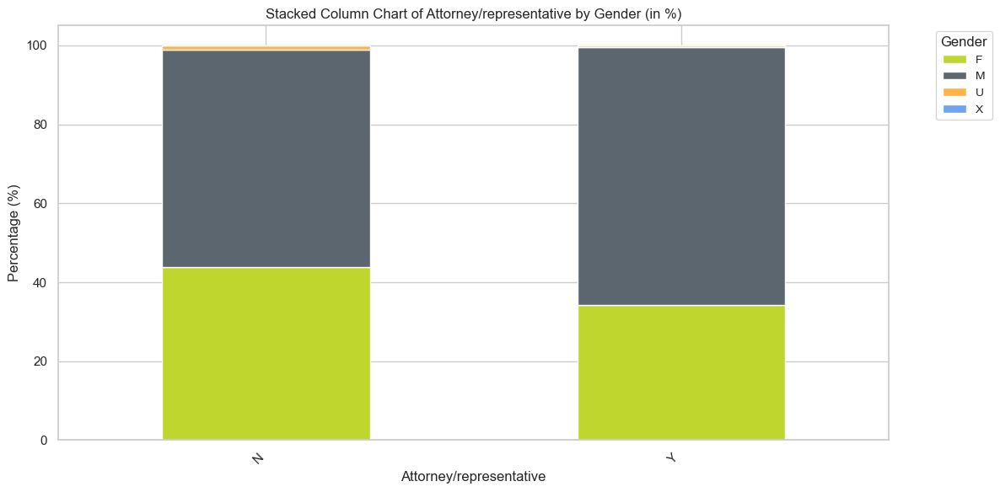

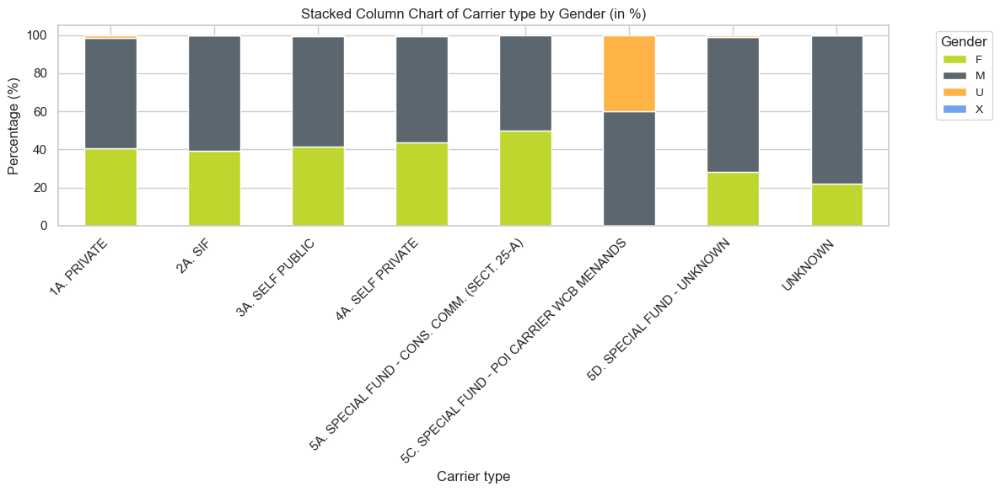

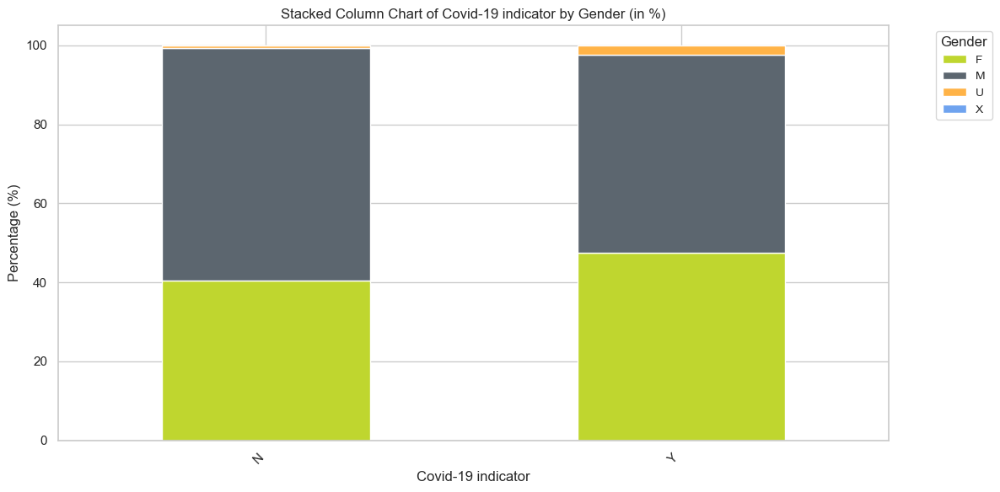

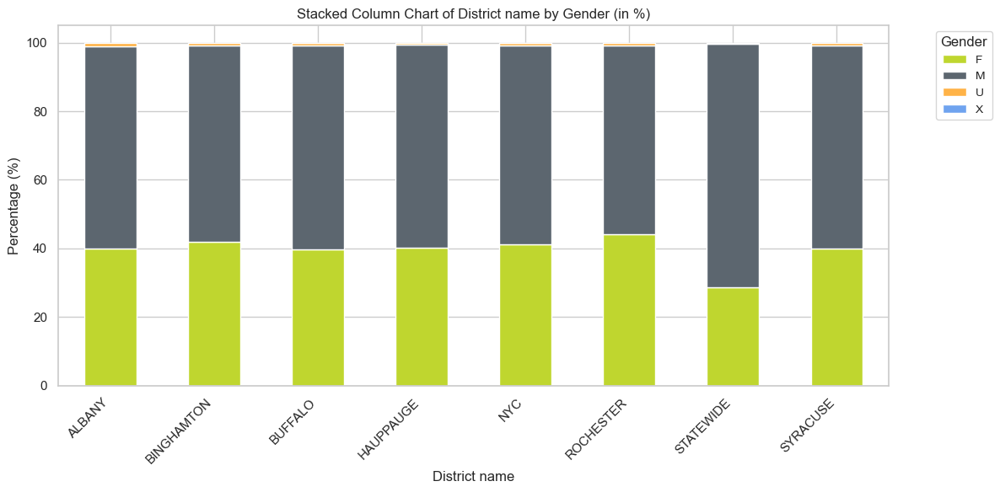

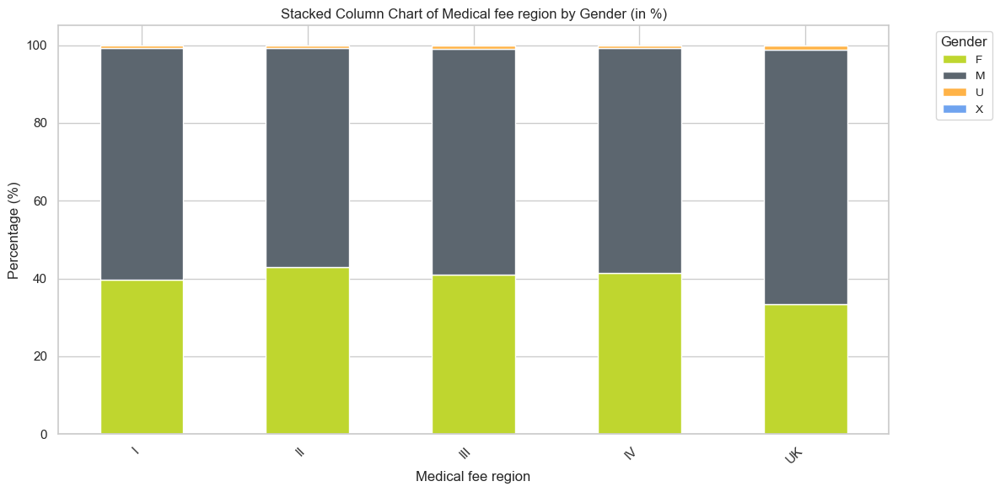

In [78]:
for feature in cat_feat_few_classes:
    if feature != "Gender":
        # Create a crosstab
        ct = pd.crosstab(df[feature], df['Gender'])
        
        # Normalize the counts to percentages
        ct_percentage = ct.div(ct.sum(axis=1), axis=0) * 100
        
        # Plotting the stacked column chart
        ct_percentage.plot(kind='bar', stacked=True, figsize=(12, 6))

        # Adding labels and title
        plt.xlabel(f'{feature.capitalize()}')  # is_chain on the x-axis
        plt.ylabel('Percentage (%)')
        plt.title(f'Stacked Column Chart of {feature.capitalize()} by Gender (in %)')
        plt.xticks(rotation=45, ha='right')
        plt.legend(title='Gender', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title_fontsize='medium')
        plt.tight_layout()  # Adjust layout
        plt.show()

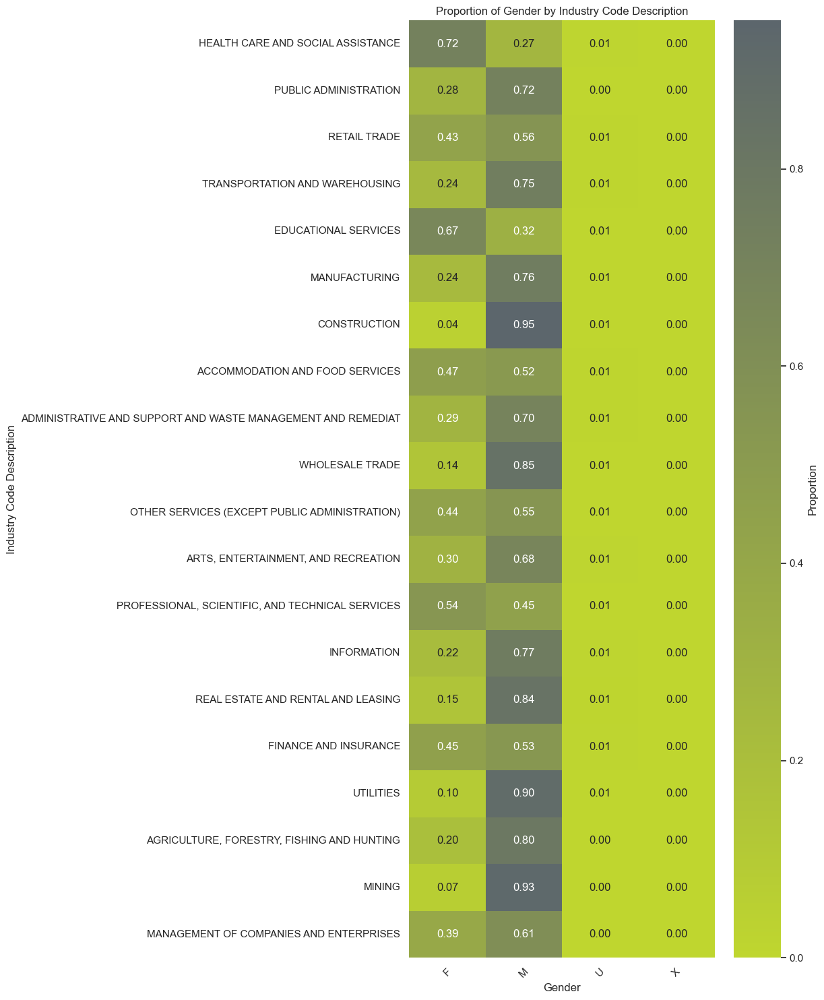

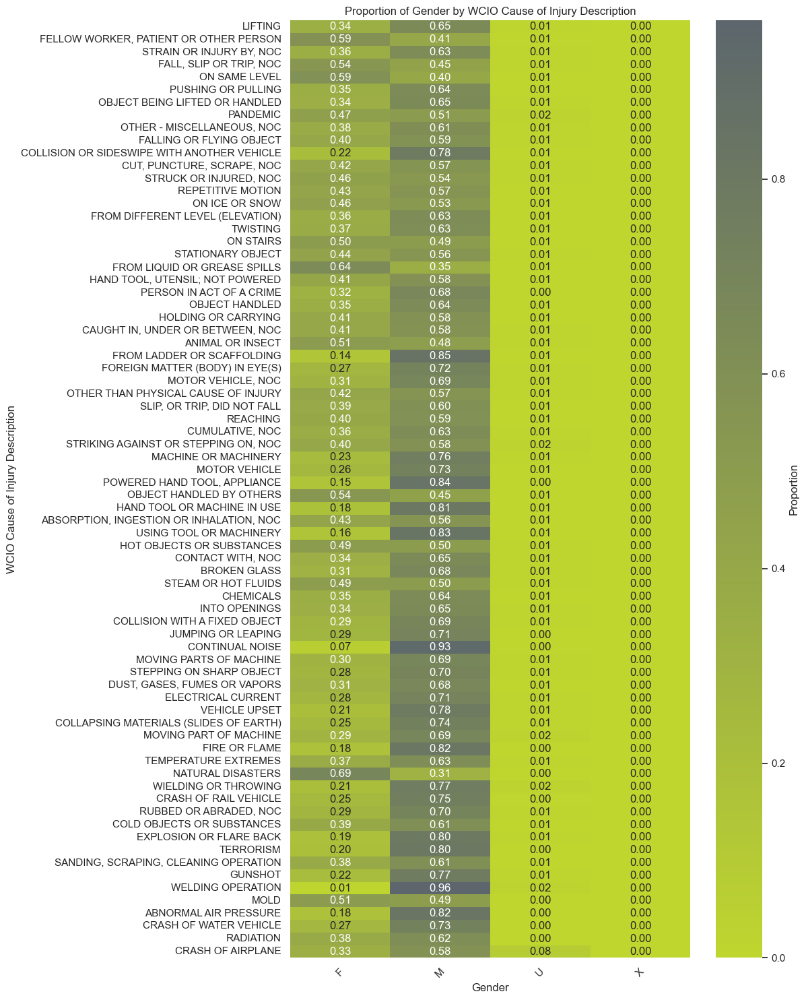

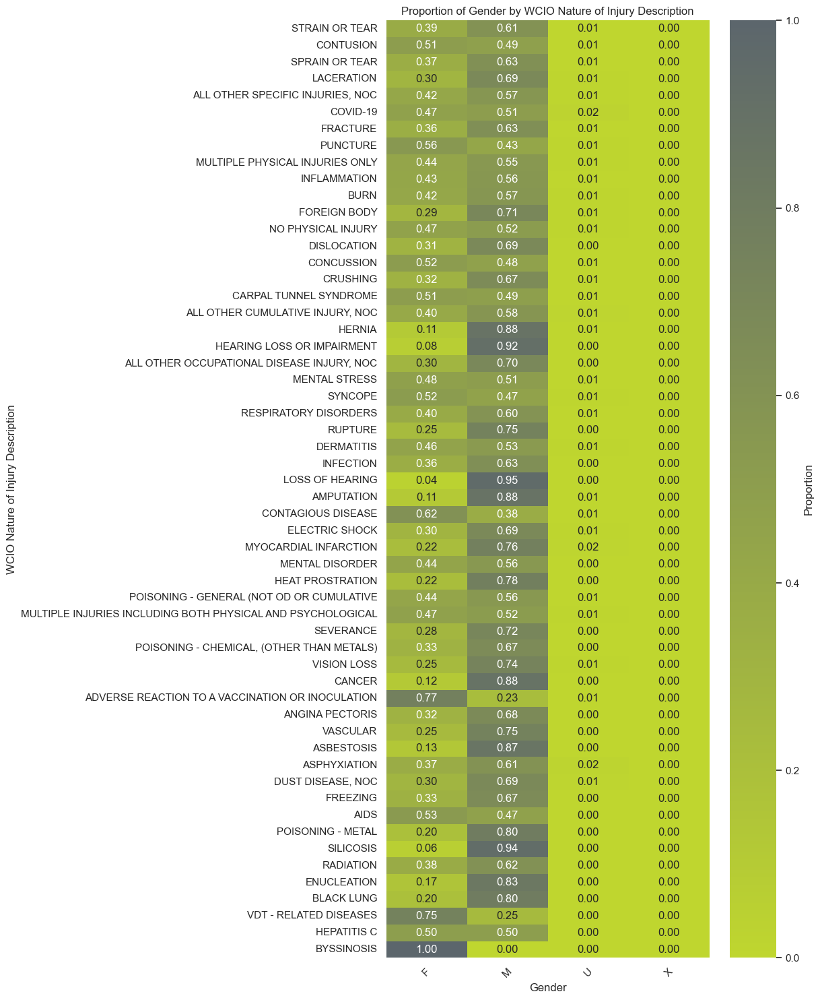

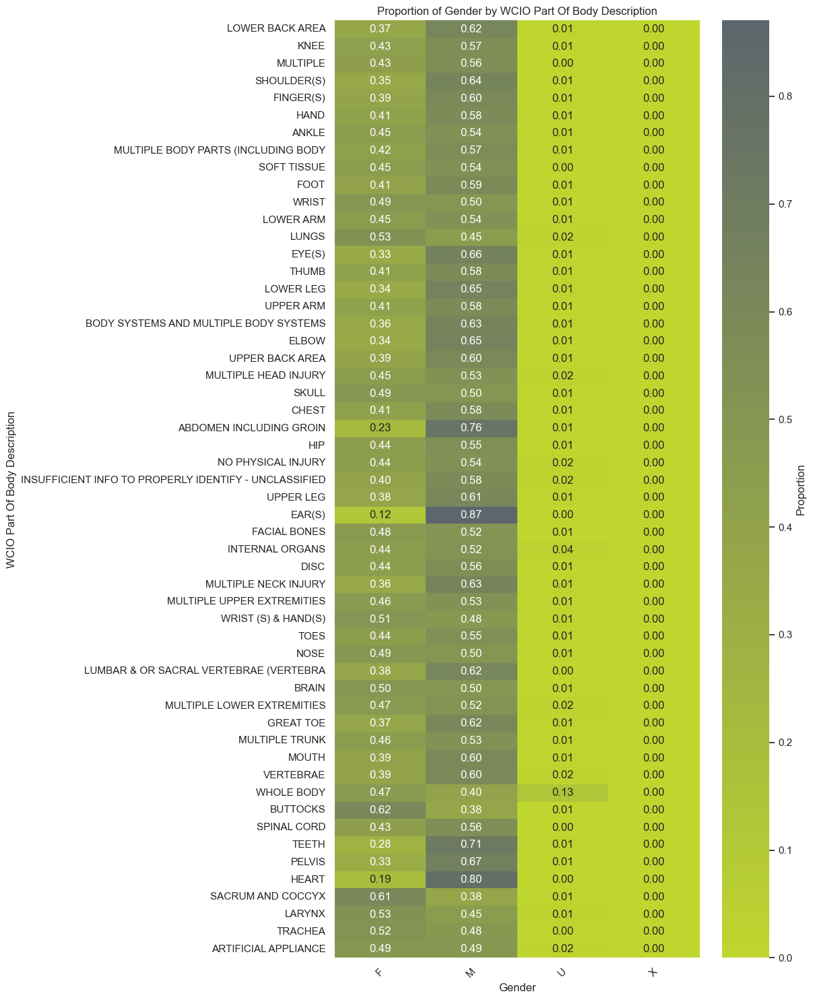

In [79]:
for feature in cat_feat_des:
    # Calculate proportions
    prop_table = df.groupby([feature, 'Gender']).size().unstack(fill_value=0)
    prop_table = prop_table.apply(lambda x: x / x.sum(), axis=1)  # Normalize rows to get proportions


    # Sort feature categories by descending frequency (total counts)
    category_order = df[feature].value_counts(ascending=False).index
    prop_table = prop_table.reindex(category_order) 
    # Plot as a heatmap
    plt.figure(figsize=(12, 15))
    sns.heatmap(prop_table, cmap=custom_cmap, annot=True, fmt=".2f", cbar_kws={'label': 'Proportion'})
    plt.title(f'Proportion of Gender by {feature}')
    plt.xlabel('Gender')
    plt.ylabel(feature)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

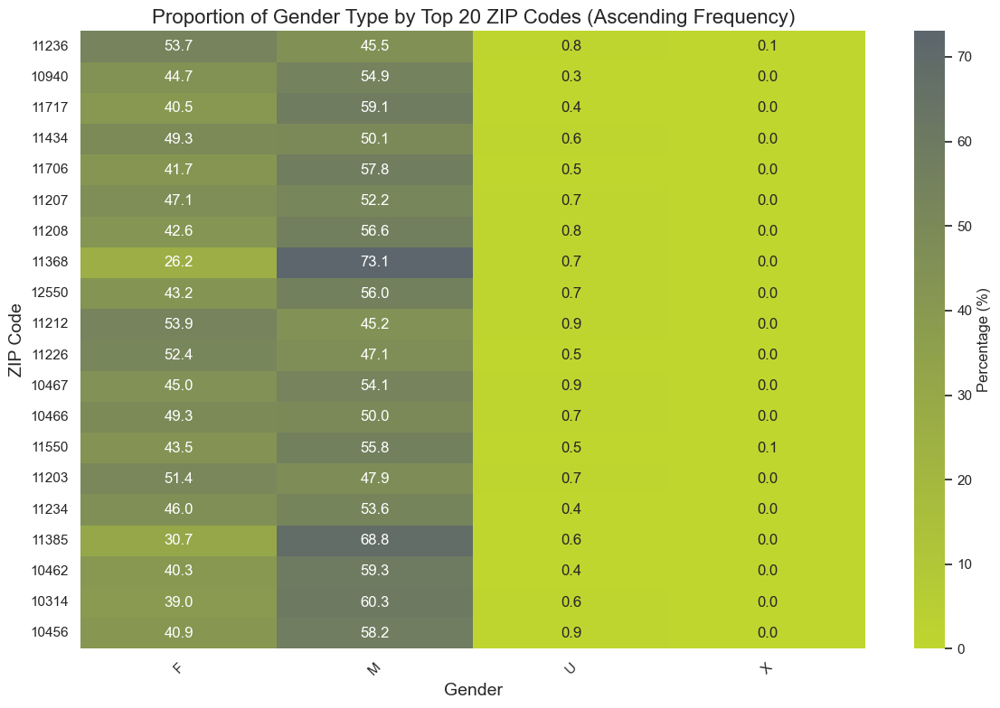

In [80]:
top_20_zip_codes = df['Zip Code'].value_counts().head(20).sort_values(ascending=False)

# Filter the DataFrame to include only rows with the top 20 ZIP codes
df_filtered = df[df['Zip Code'].isin(top_20_zip_codes.index)]

# Create a crosstab between 'Zip Code' and the target variable 'Claim Injury Type'
crosstab = pd.crosstab(df_filtered['Zip Code'], df_filtered['Gender'])

# Normalize to get proportions
crosstab_percentage = crosstab.div(crosstab.sum(axis=1), axis=0) * 100

# Reindex the crosstab by the ZIP codes' frequency order
crosstab_percentage = crosstab_percentage.reindex(top_20_zip_codes.index)

# Plot as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    crosstab_percentage, 
    annot=True, 
    fmt=".1f", 
    cmap=custom_cmap, 
    cbar_kws={'label': 'Percentage (%)'}
)

plt.title('Proportion of Gender Type by Top 20 ZIP Codes (Ascending Frequency)', fontsize=16)
plt.xlabel('Gender', fontsize=14)
plt.ylabel('ZIP Code', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

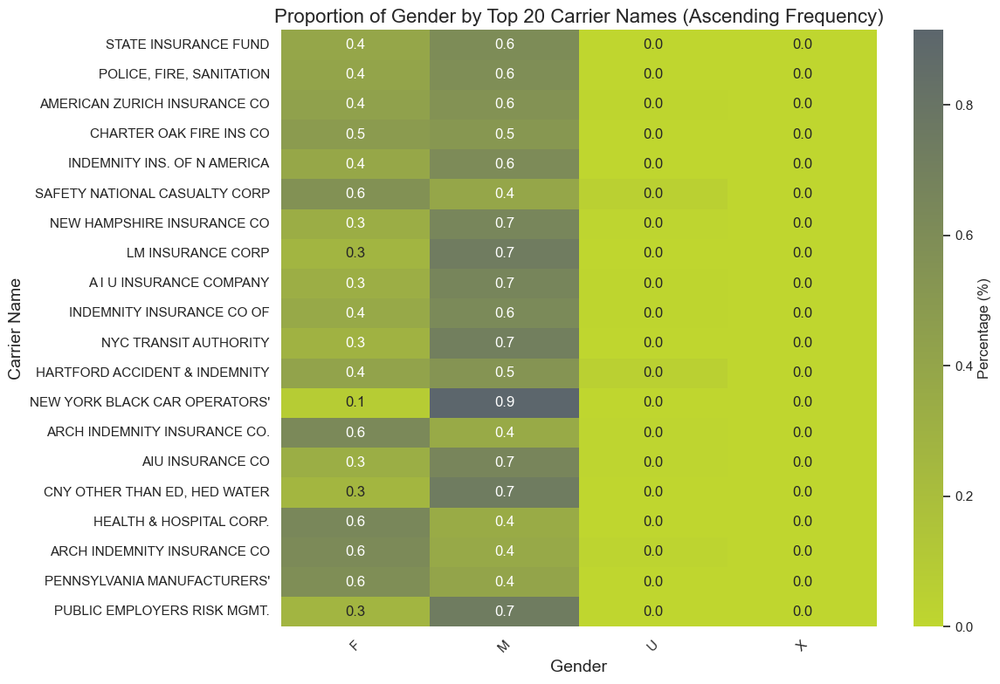

In [81]:
top_20_carrier_names = df['Carrier Name'].value_counts().head(20).sort_values(ascending=False)

# Filter the DataFrame to include only rows with the top 20 Carrier Names
df_filtered = df[df['Carrier Name'].isin(top_20_carrier_names.index)]

# Create a crosstab
crosstab = pd.crosstab(df_filtered['Carrier Name'], df_filtered['Gender'])

# Normalize to get proportions
crosstab_percentage = crosstab.div(crosstab.sum(axis=1), axis=0)

# Reindex the crosstab by the Carrier Names' frequency order
crosstab_percentage = crosstab_percentage.reindex(top_20_carrier_names.index)

# Plot as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    crosstab_percentage, 
    annot=True, 
    fmt=".1f", 
    cmap=custom_cmap, 
    cbar_kws={'label': 'Percentage (%)'}
)

plt.title('Proportion of Gender by Top 20 Carrier Names (Ascending Frequency)', fontsize=16)
plt.xlabel('Gender', fontsize=14)
plt.ylabel('Carrier Name', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

`Step 41` Plot the categorical features against `Medical Fee Region`.

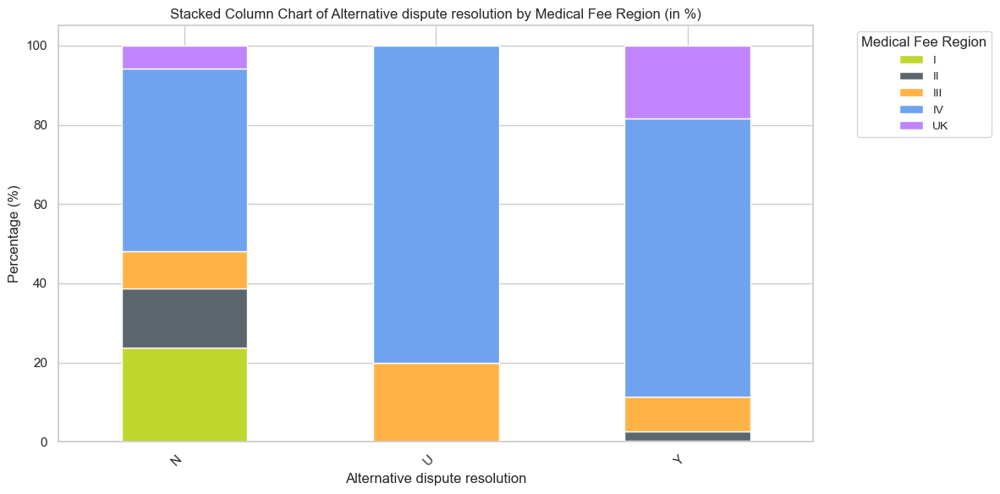

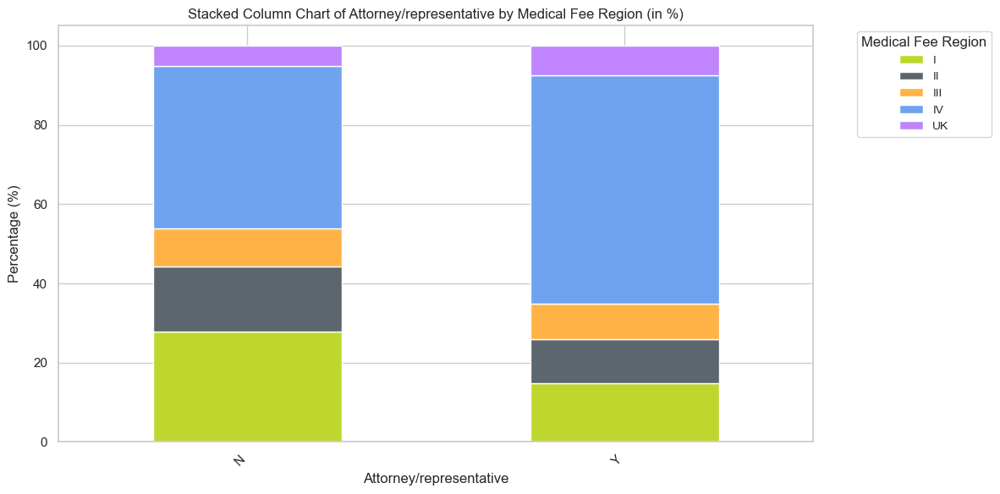

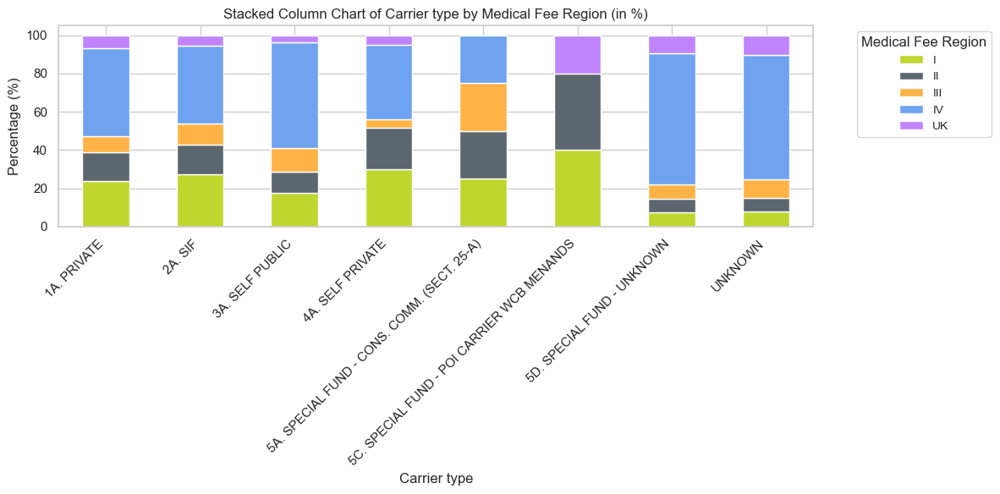

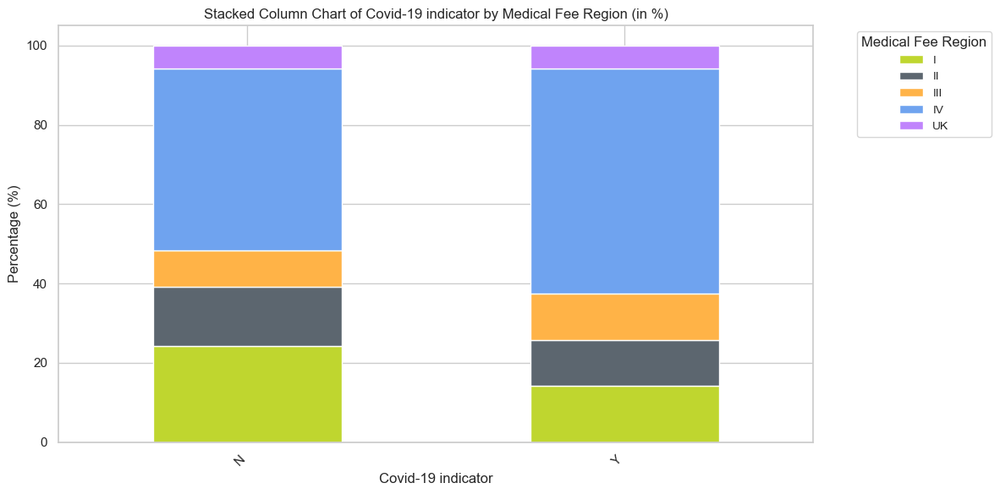

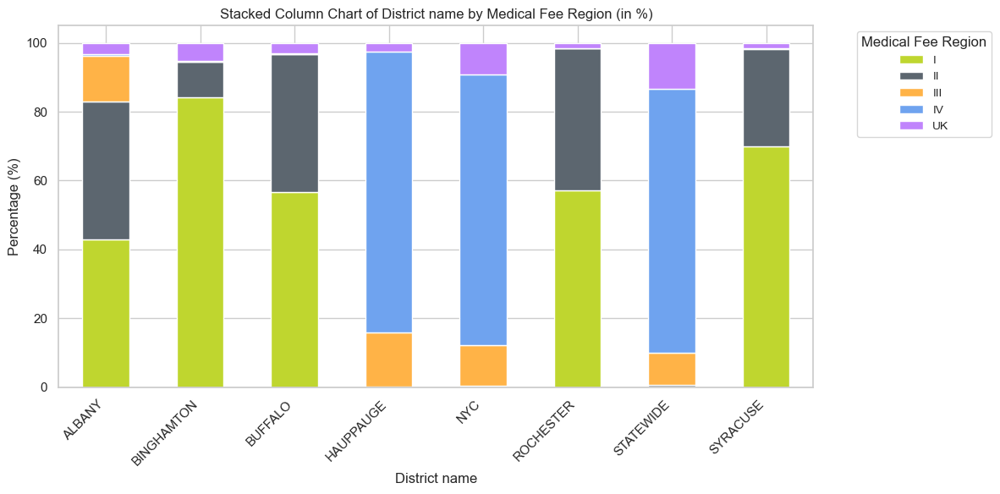

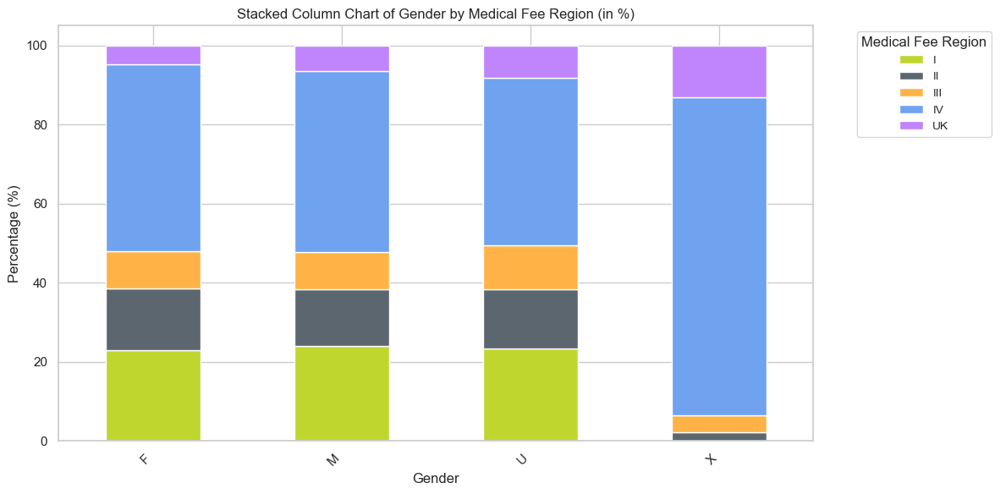

In [82]:
for feature in cat_feat_few_classes:
    if feature != "Medical Fee Region":
        # Create a crosstab
        ct = pd.crosstab(df[feature], df['Medical Fee Region'])
        
        # Normalize the counts to percentages
        ct_percentage = ct.div(ct.sum(axis=1), axis=0) * 100
        
        # Plotting the stacked column chart
        ct_percentage.plot(kind='bar', stacked=True, figsize=(12, 6))

        # Adding labels and title
        plt.xlabel(f'{feature.capitalize()}')
        plt.ylabel('Percentage (%)')
        plt.title(f'Stacked Column Chart of {feature.capitalize()} by Medical Fee Region (in %)')
        plt.xticks(rotation=45, ha='right')
        plt.legend(title='Medical Fee Region', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title_fontsize='medium')
        plt.tight_layout()  # Adjust layout
        plt.show()

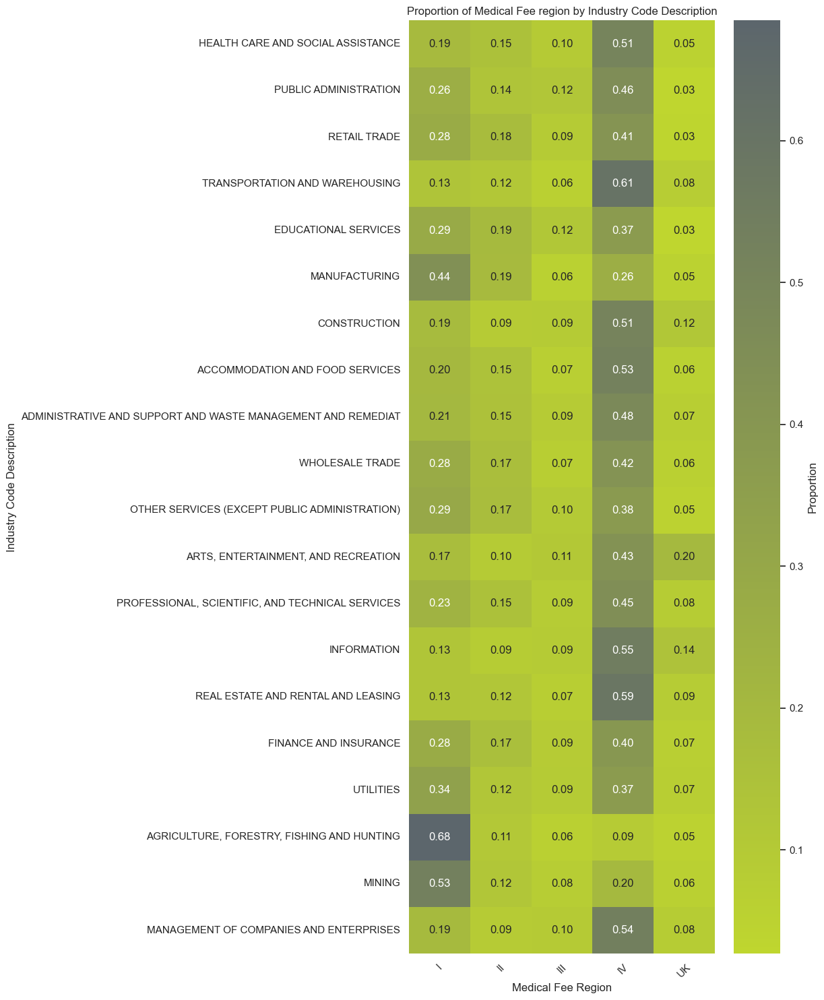

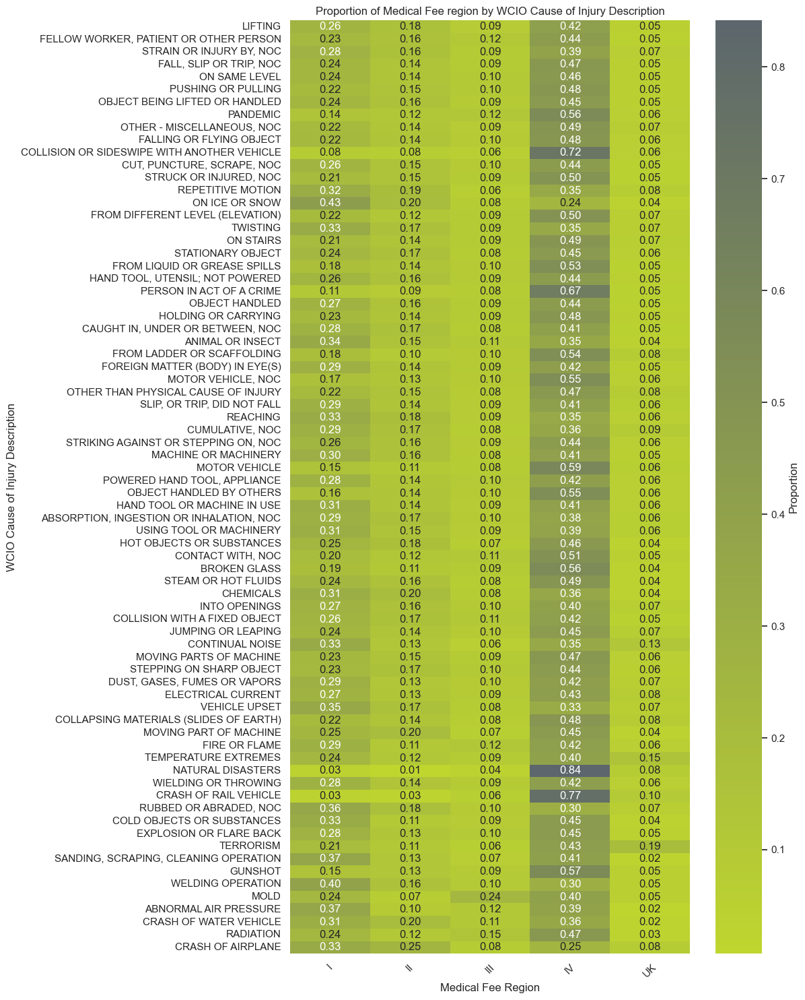

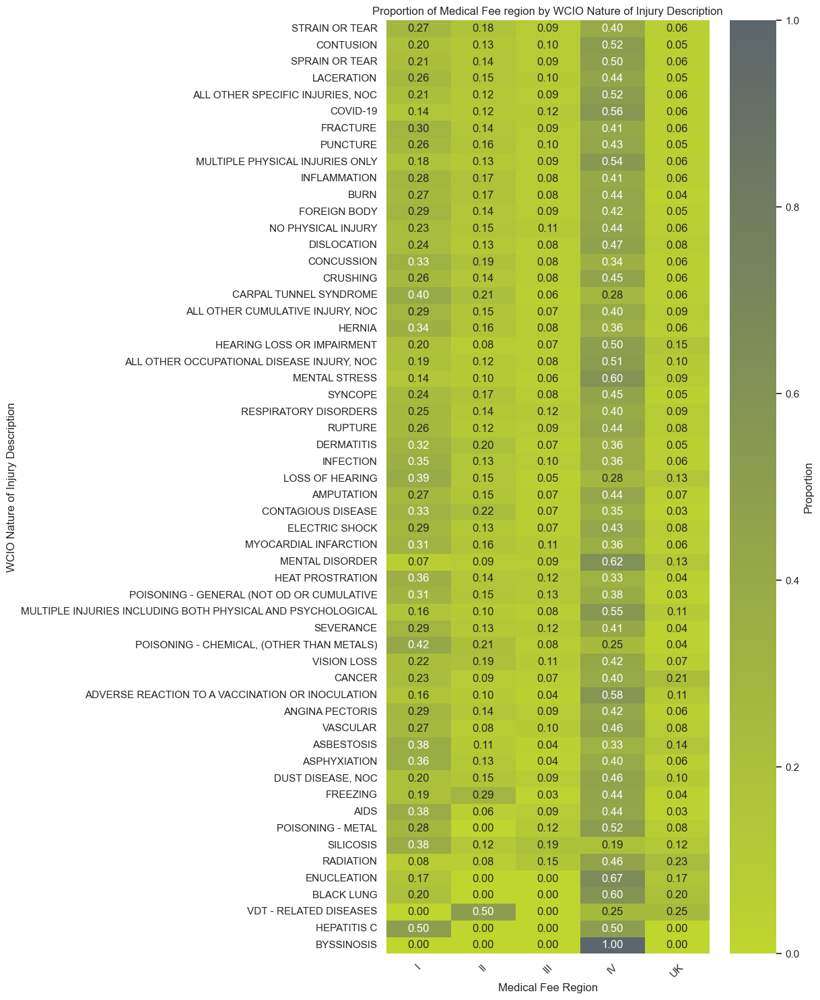

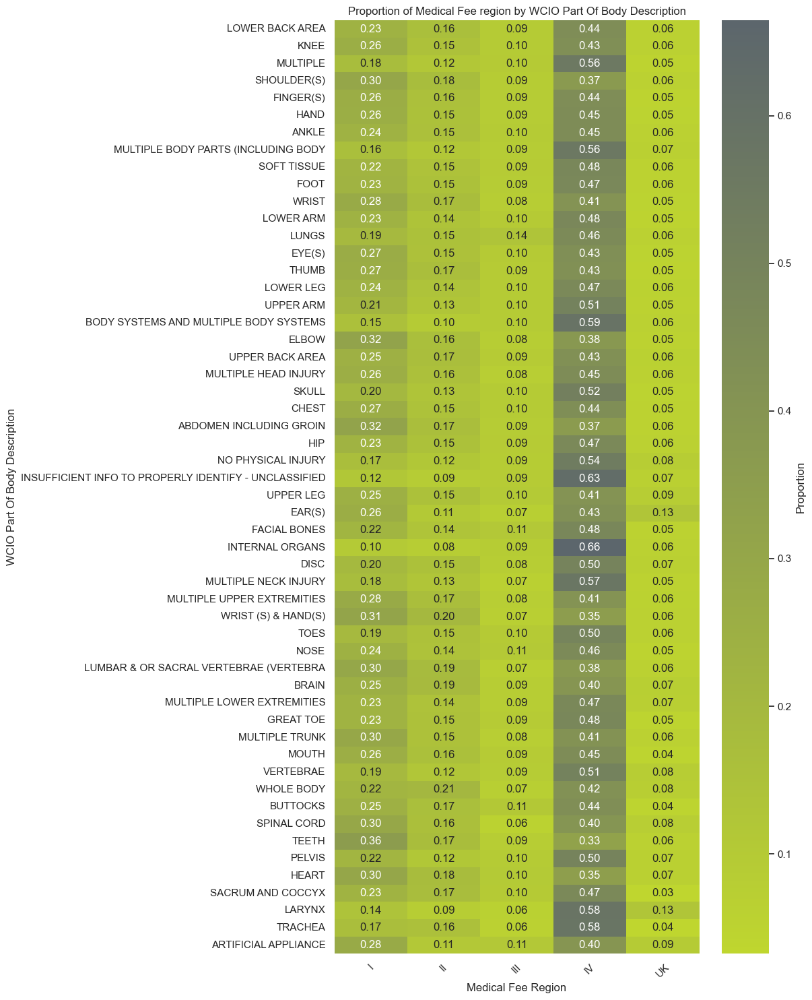

In [83]:
for feature in cat_feat_des:
    # Calculate proportions
    prop_table = df.groupby([feature, 'Medical Fee Region']).size().unstack(fill_value=0)
    prop_table = prop_table.apply(lambda x: x / x.sum(), axis=1)  # Normalize rows to get proportions

    # Sort feature categories by descending frequency (total counts)
    category_order = df[feature].value_counts(ascending=False).index
    prop_table = prop_table.reindex(category_order) 
    # Plot as a heatmap
    plt.figure(figsize=(12, 15))
    sns.heatmap(prop_table, cmap=custom_cmap, annot=True, fmt=".2f", cbar_kws={'label': 'Proportion'})
    plt.title(f'Proportion of Medical Fee region by {feature}')
    plt.xlabel('Medical Fee Region')
    plt.ylabel(feature)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

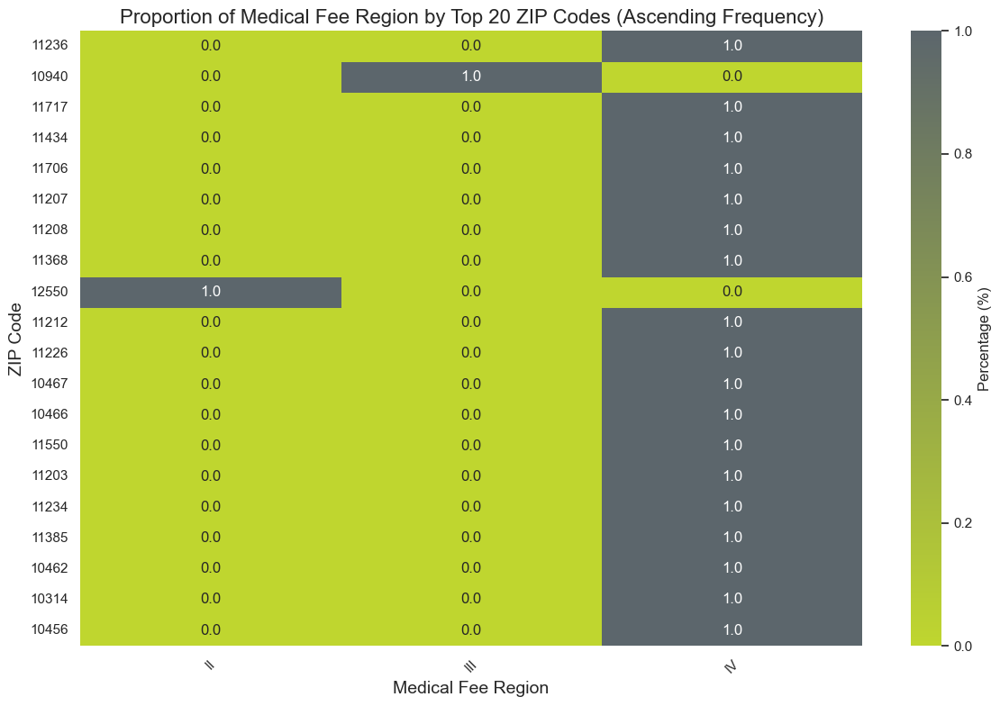

In [84]:
top_20_zip_codes = df['Zip Code'].value_counts().head(20).sort_values(ascending=False)

# Filter the DataFrame to include only rows with the top 20 ZIP codes
df_filtered = df[df['Zip Code'].isin(top_20_zip_codes.index)]

# Create a crosstab
crosstab = pd.crosstab(df_filtered['Zip Code'], df_filtered['Medical Fee Region'])

# Normalize to get proportions
crosstab_percentage = crosstab.div(crosstab.sum(axis=1), axis=0)

# Reindex the crosstab by the ZIP codes' frequency order
crosstab_percentage = crosstab_percentage.reindex(top_20_zip_codes.index)

# Plot as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    crosstab_percentage, 
    annot=True, 
    fmt=".1f", 
    cmap=custom_cmap, 
    cbar_kws={'label': 'Percentage (%)'}
)

plt.title('Proportion of Medical Fee Region by Top 20 ZIP Codes (Ascending Frequency)', fontsize=16)
plt.xlabel('Medical Fee Region', fontsize=14)
plt.ylabel('ZIP Code', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

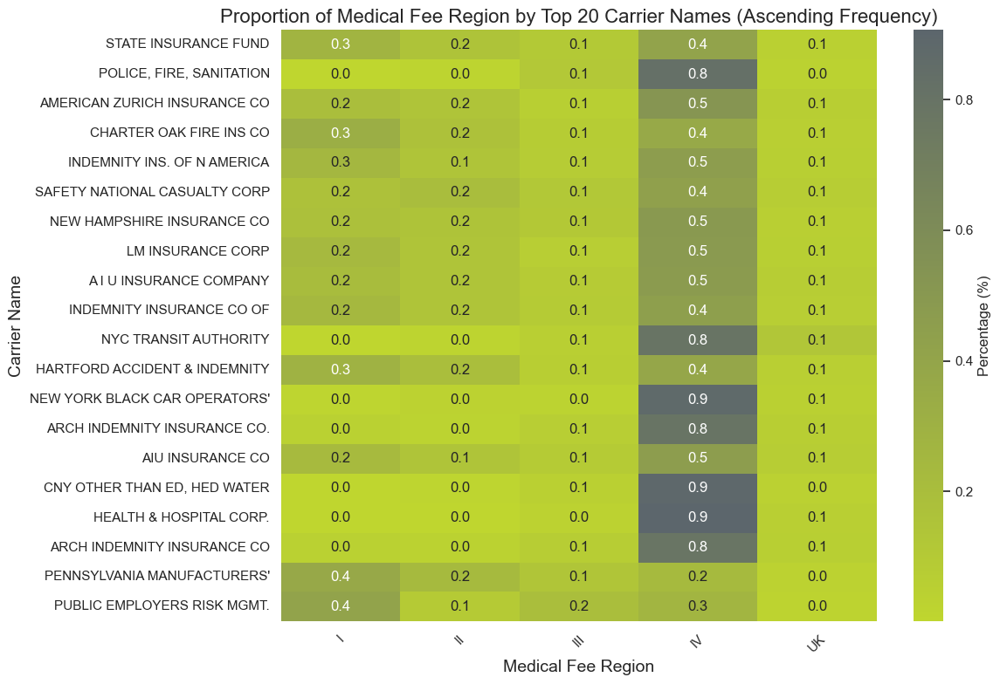

In [85]:
top_20_carrier_names = df['Carrier Name'].value_counts().head(20).sort_values(ascending=False)

# Filter the DataFrame to include only rows with the top 20 Carrier Names
df_filtered = df[df['Carrier Name'].isin(top_20_carrier_names.index)]

# Create a crosstab
crosstab = pd.crosstab(df_filtered['Carrier Name'], df_filtered['Medical Fee Region'])

# Normalize to get proportions
crosstab_percentage = crosstab.div(crosstab.sum(axis=1), axis=0)

# Reindex the crosstab by the Carrier Names' frequency order
crosstab_percentage = crosstab_percentage.reindex(top_20_carrier_names.index)

# Plot as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    crosstab_percentage, 
    annot=True, 
    fmt=".1f", 
    cmap=custom_cmap, 
    cbar_kws={'label': 'Percentage (%)'}
)

plt.title('Proportion of Medical Fee Region by Top 20 Carrier Names (Ascending Frequency)', fontsize=16)
plt.xlabel('Medical Fee Region', fontsize=14)
plt.ylabel('Carrier Name', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 3.5.3. Mean and Quantiles of Numeric Features Grouped by Categorical Features

`Step 42` Calculate mean and quantiles by Categorical Features <br>
`Step 42.1` Calculate median and mean of `Age at Injury` by `Industry Code Description`

In [86]:
df.groupby('Industry Code Description').agg({'Age at Injury': ['median', 'mean']})

Age at Injury           
                                                          median       mean
Industry Code Description                                                  
ACCOMMODATION AND FOOD SERVICES                             35.0  37.405125
ADMINISTRATIVE AND SUPPORT AND WASTE MANAGEMENT...          40.0  40.924002
AGRICULTURE, FORESTRY, FISHING AND HUNTING                  39.0  40.821131
ARTS, ENTERTAINMENT, AND RECREATION                         32.0  36.567172
CONSTRUCTION                                                40.0  40.652461
EDUCATIONAL SERVICES                                        49.0  47.202757
FINANCE AND INSURANCE                                       44.0  43.454711
HEALTH CARE AND SOCIAL ASSISTANCE                           44.0  43.897305
INFORMATION                                                 47.0  44.255837
MANAGEMENT OF COMPANIES AND ENTERPRISES                     40.0  38.951351
MANUFACTURING                                               43.0  42.997824
MINING                                                      44.0  43.532374
OTHER SERVICES (EXCEPT PUBLIC ADMINISTRATION)               43.0  42.984790
PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES            36.0  39.066837
PUBLIC ADMINISTRATION                                       40.0  41.616923
REAL ESTATE AND RENTAL AND LEASING                          48.0  45.832477
RETAIL TRADE                                                38.0  39.635842
TRANSPORTATION AND WAREHOUSING                              42.0  42.063195
UTILITIES                                                   47.0  44.604362
WHOLESALE TRADE                                             41.0  41.562680

`Step 42.2` Calculate mean and quantiles of `Average Weekly Wage` by `Industry Code Description`

In [87]:
df.groupby('Industry Code Description').agg({'Average Weekly Wage': ['mean', 'median', lambda x: x.quantile(0.75)]}).rename(columns={'<lambda_0>': '75th quantile'})

Average Weekly Wage         \
                                                                  mean median   
Industry Code Description                                                       
ACCOMMODATION AND FOOD SERVICES                             228.008561    0.0   
ADMINISTRATIVE AND SUPPORT AND WASTE MANAGEMENT...          379.521924    0.0   
AGRICULTURE, FORESTRY, FISHING AND HUNTING                  362.952552    0.0   
ARTS, ENTERTAINMENT, AND RECREATION                         353.005339    0.0   
CONSTRUCTION                                                754.081590  360.0   
EDUCATIONAL SERVICES                                        282.874239    0.0   
FINANCE AND INSURANCE                                       375.010607    0.0   
HEALTH CARE AND SOCIAL ASSISTANCE                           450.644410    0.0   
INFORMATION                                                1003.587962    0.0   
MANAGEMENT OF COMPANIES AND ENTERPRISES                     319.061183    0.0   
MANUFACTURING                                               419.823626    0.0   
MINING                                                      532.620422    0.0   
OTHER SERVICES (EXCEPT PUBLIC ADMINISTRATION)               353.898755    0.0   
PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES            287.251633    0.0   
PUBLIC ADMINISTRATION                                       829.673856    0.0   
REAL ESTATE AND RENTAL AND LEASING                          481.980402    0.0   
RETAIL TRADE                                                240.604267    0.0   
TRANSPORTATION AND WAREHOUSING                              618.463594    0.0   
UTILITIES                                                  1060.749474    0.0   
WHOLESALE TRADE                                             479.811013    0.0   

                                                                  
                                                   75th quantile  
Industry Code Description                                         
ACCOMMODATION AND FOOD SERVICES                         350.5725  
ADMINISTRATIVE AND SUPPORT AND WASTE MANAGEMENT...      700.0000  
AGRICULTURE, FORESTRY, FISHING AND HUNTING              710.0000  
ARTS, ENTERTAINMENT, AND RECREATION                     232.6200  
CONSTRUCTION                                           1107.8800  
EDUCATIONAL SERVICES                                    343.4800  
FINANCE AND INSURANCE                                   660.2250  
HEALTH CARE AND SOCIAL ASSISTANCE                       813.5100  
INFORMATION                                            1878.7450  
MANAGEMENT OF COMPANIES AND ENTERPRISES                 105.5600  
MANUFACTURING                                           815.6300  
MINING                                                 1093.3350  
OTHER SERVICES (EXCEPT PUBLIC ADMINISTRATION)           648.6150  
PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES          0.0000  
PUBLIC ADMINISTRATION                                  1524.6100  
REAL ESTATE AND RENTAL AND LEASING                      899.6500  
RETAIL TRADE                                            395.2875  
TRANSPORTATION AND WAREHOUSING                         1028.5025  
UTILITIES                                              2068.1000  
WHOLESALE TRADE                                         897.2000

`Step 42.3` Calculate mean and quantiles of `Average Weekly Wage` by `Medical Fee Region`

In [88]:
df.groupby('Medical Fee Region').agg({'Average Weekly Wage': ['mean', 'median', lambda x: x.quantile(0.75)]}).rename(columns={'<lambda_0>': '75th quantile'})

Average Weekly Wage                     
                                  mean median 75th quantile
Medical Fee Region                                         
I                           392.223199    0.0      670.6800
II                          405.080585    0.0      690.0000
III                         537.172398    0.0      950.0100
IV                          547.309798    0.0      944.9325
UK                          590.596165    0.0     1100.9100

`Step 42.4` Calculate mean and quantiles of `Average Weekly Wage` by `Carrier Type`

In [89]:
df.groupby('Carrier Type').agg({'Average Weekly Wage': ['mean', 'median', lambda x: x.quantile(0.75)]}).rename(columns={'<lambda_0>': '75th quantile'})

Average Weekly Wage         \
                                                           mean median   
Carrier Type                                                             
1A. PRIVATE                                          414.559930    0.0   
2A. SIF                                              607.213457    0.0   
3A. SELF PUBLIC                                      651.502141    0.0   
4A. SELF PRIVATE                                     307.760009    0.0   
5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)            0.000000    0.0   
5C. SPECIAL FUND - POI CARRIER WCB MENANDS             0.000000    0.0   
5D. SPECIAL FUND - UNKNOWN                           385.391513    0.0   
UNKNOWN                                               10.470488    0.0   

                                                           
                                            75th quantile  
Carrier Type                                               
1A. PRIVATE                                       661.725  
2A. SIF                                          1100.000  
3A. SELF PUBLIC                                  1259.715  
4A. SELF PRIVATE                                  333.340  
5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)         0.000  
5C. SPECIAL FUND - POI CARRIER WCB MENANDS          0.000  
5D. SPECIAL FUND - UNKNOWN                        720.000  
UNKNOWN                                             0.000

### 3.5.4. Plotting Input Features Against the Target Feature

##### Numeric features

`Step 43` Create boxplots of the numeric features against the target feature.

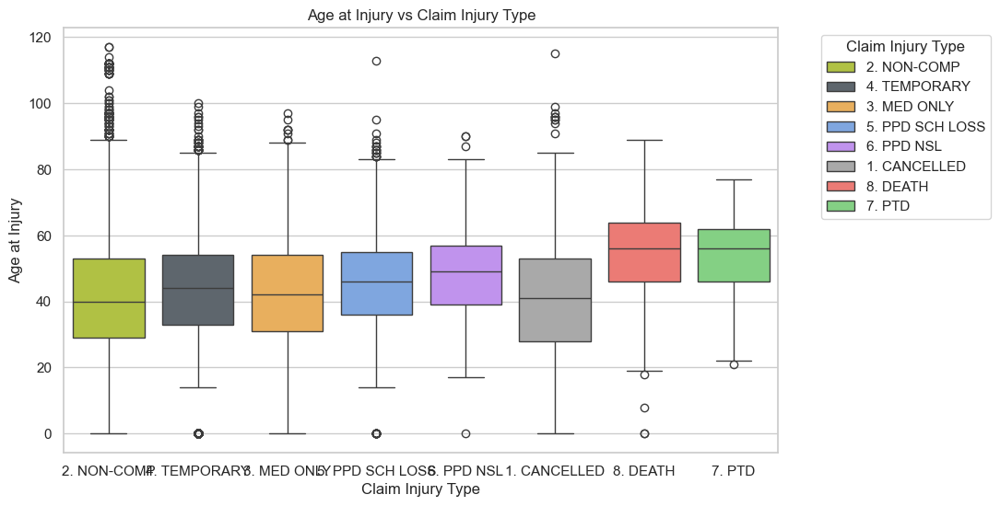

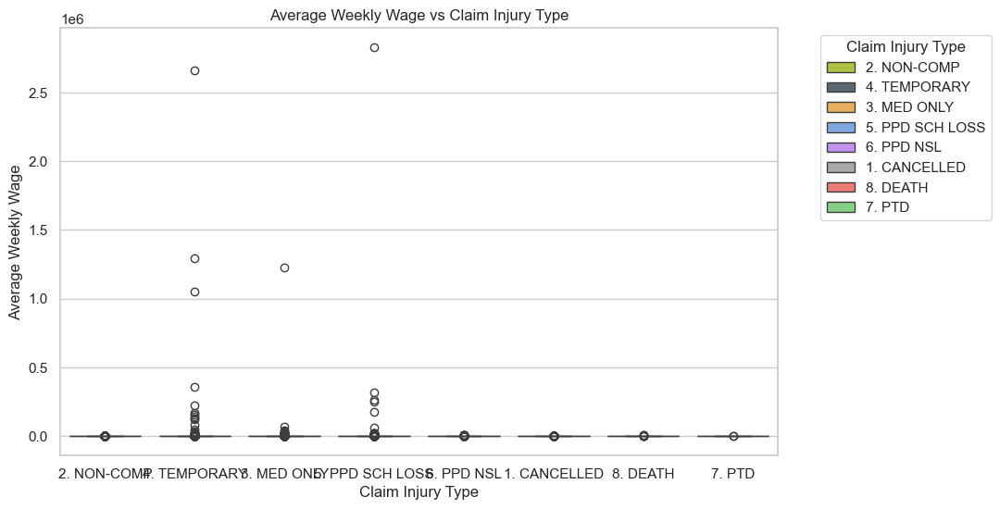

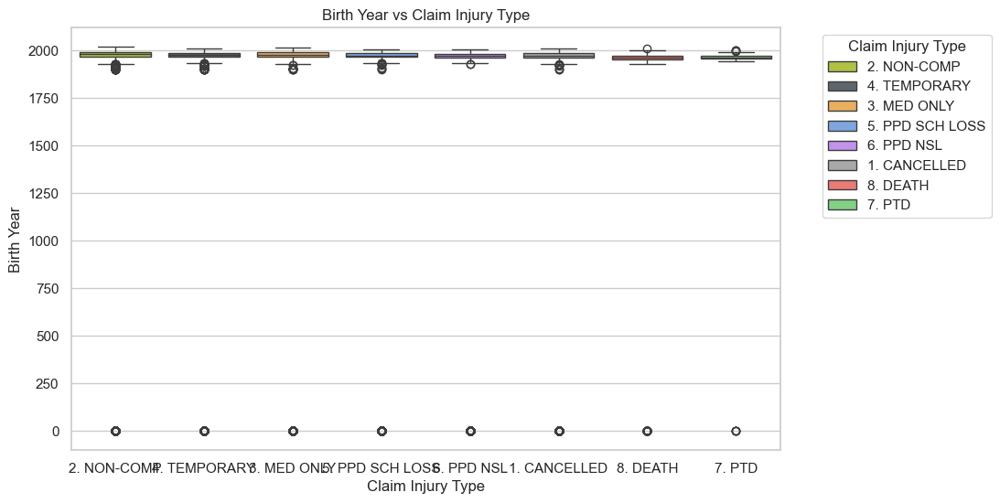

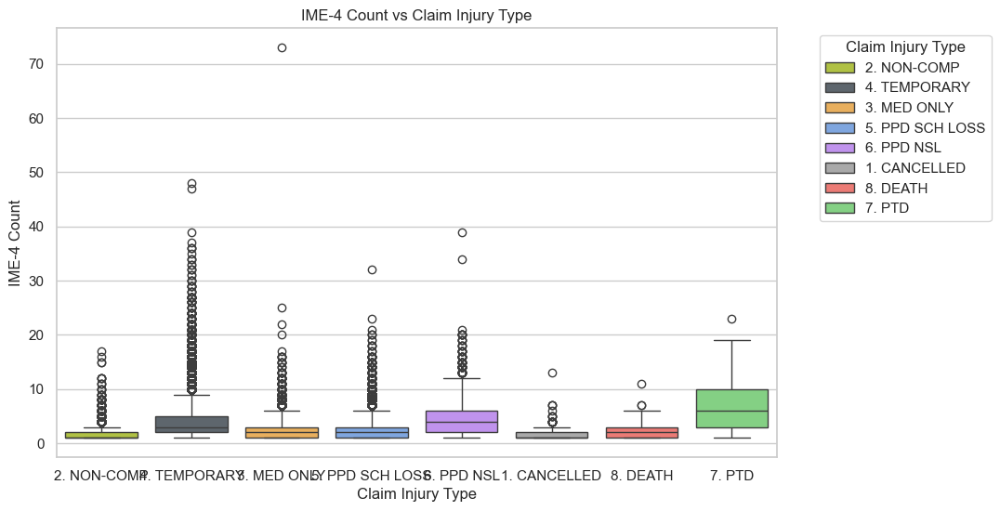

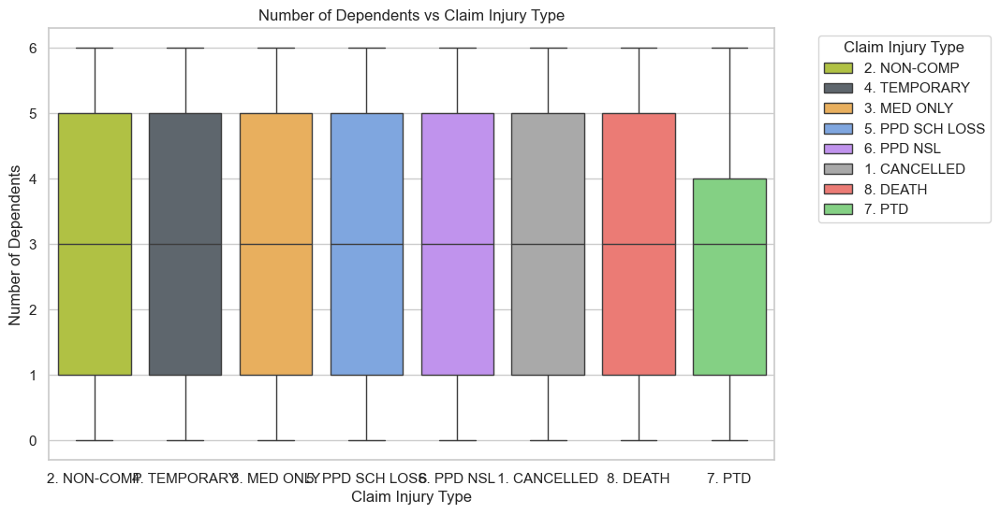

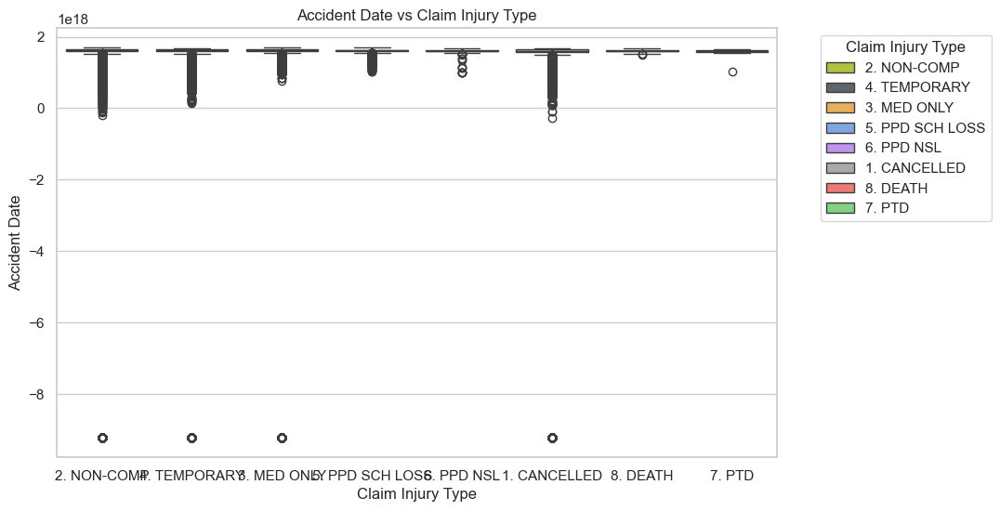

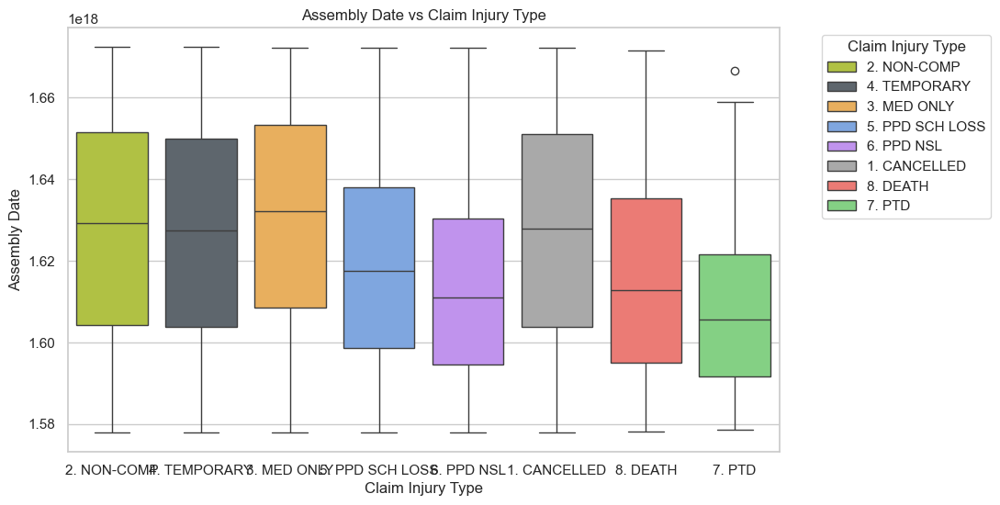

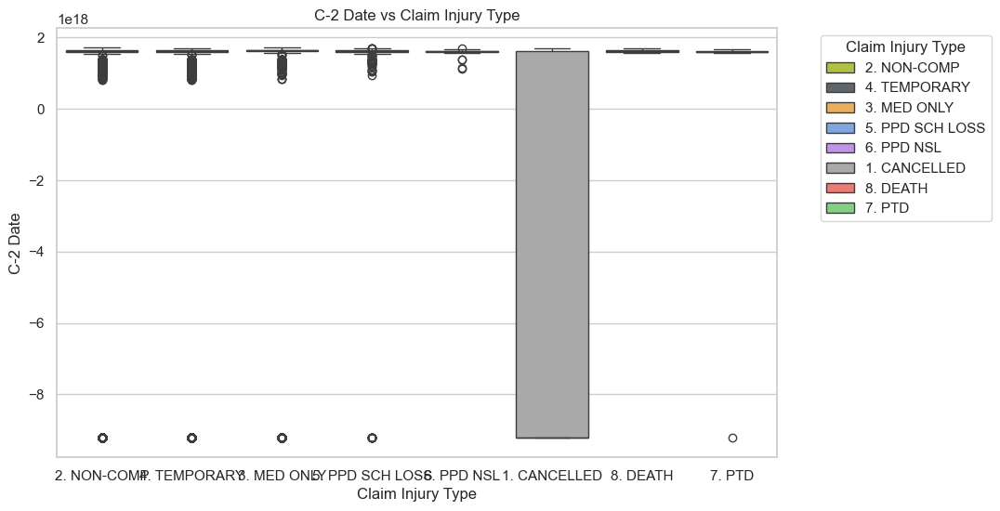

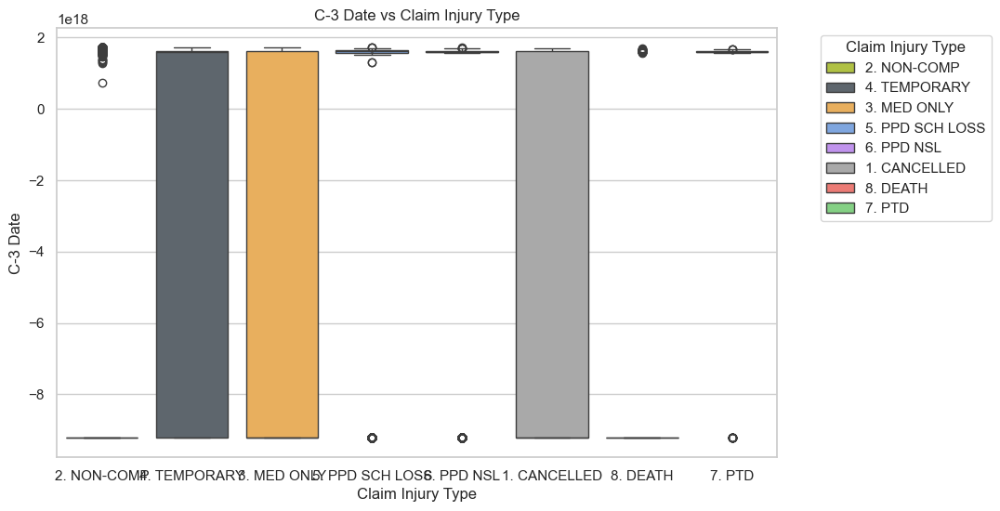

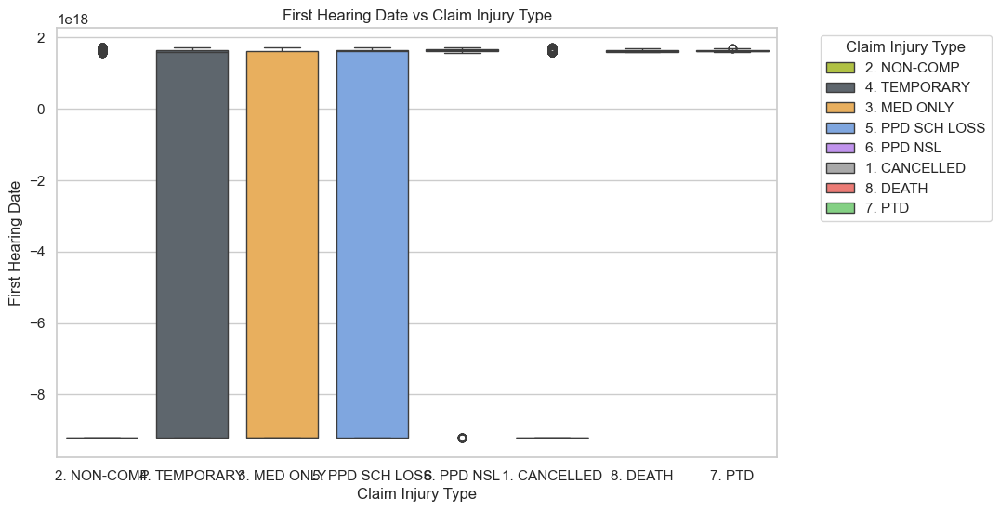

In [90]:
# Suppress warnings
warnings.filterwarnings("ignore")

# Target variable
target_variable = 'Claim Injury Type'

# Get unique categories in the target variable
unique_categories = df[target_variable].unique()


# Loop through each numeric feature and create a plot
for feature in numeric_features:
    plt.figure(figsize=(10, 6))  # Create a new figure for each plot
    if feature in df.select_dtypes(include=['datetime']).columns:  # Check if the feature is a date
        # If the feature is a datetime, convert it to numeric for plotting
        df[feature] = pd.to_numeric(df[feature].astype(np.int64), errors='coerce')

    # Create the boxplot with the custom palette and hue
    sns.boxplot(x=target_variable, y=feature, data=df, hue=target_variable, dodge=False)
    plt.title(f'{feature} vs {target_variable}')
    plt.xlabel(target_variable)
    plt.ylabel(feature)
    # Remove the legend if you want to avoid duplication
    plt.legend(title='Claim Injury Type', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()  # Show each plot individually

##### Categorical features

`Step 44` Create barplots of the categorical features against the target feature.

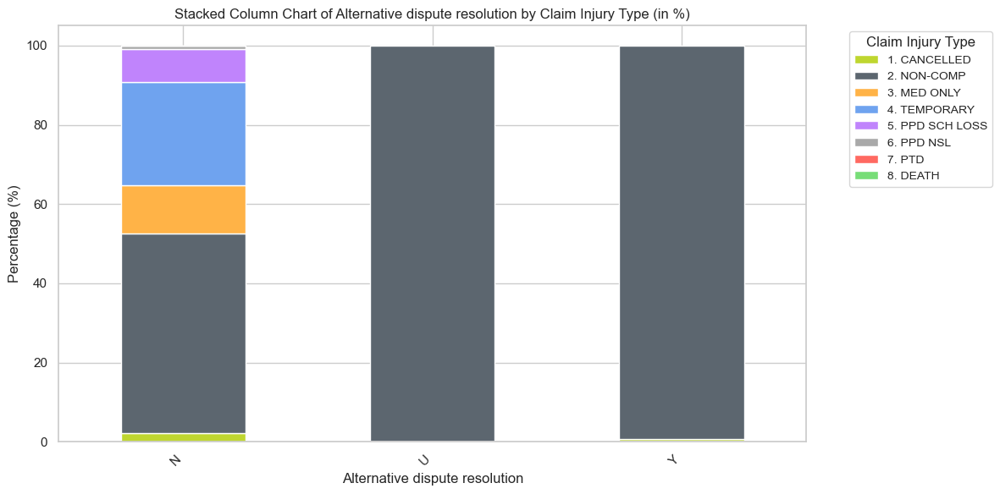

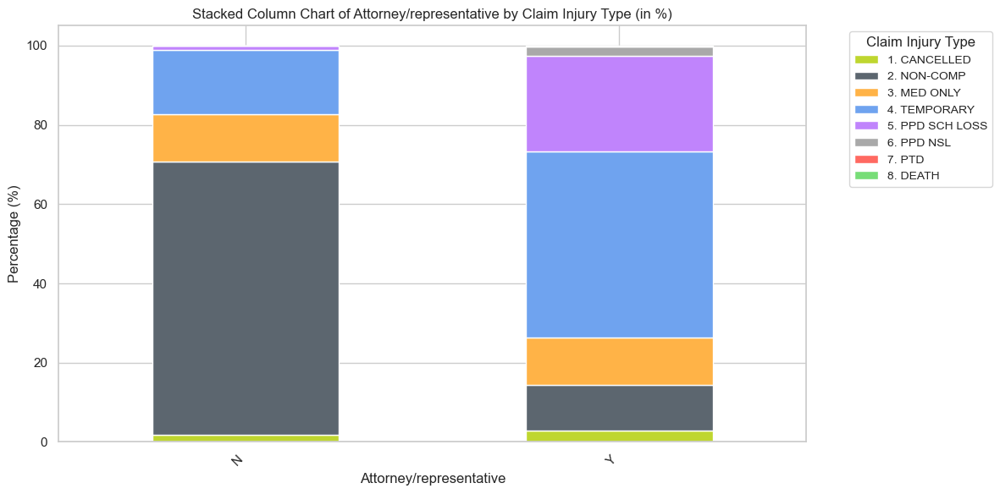

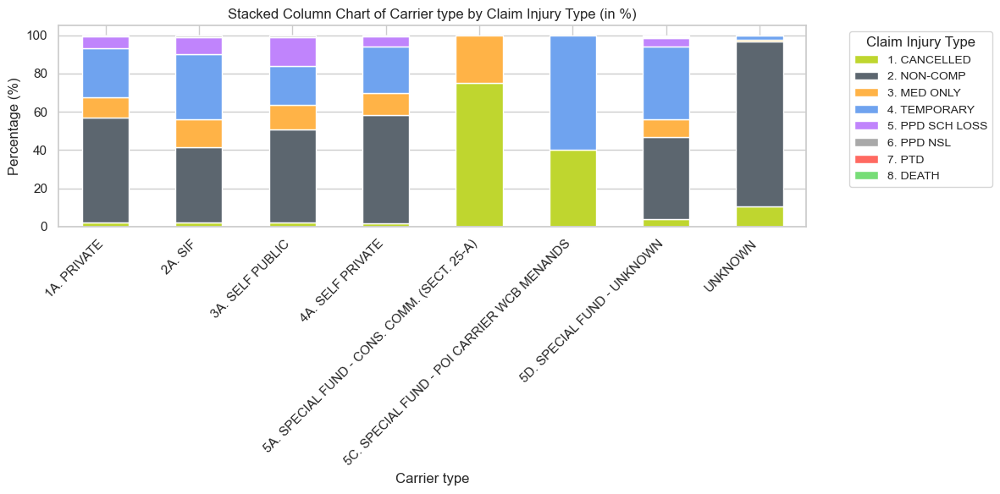

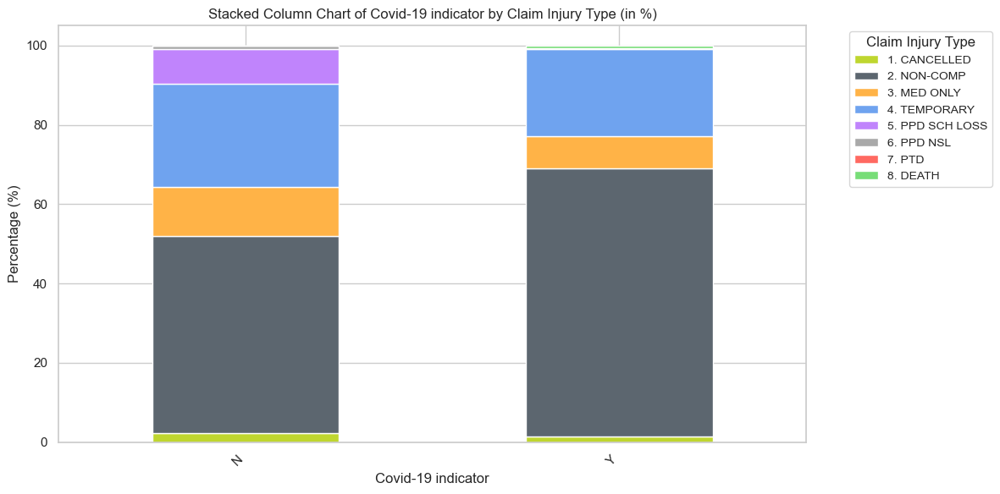

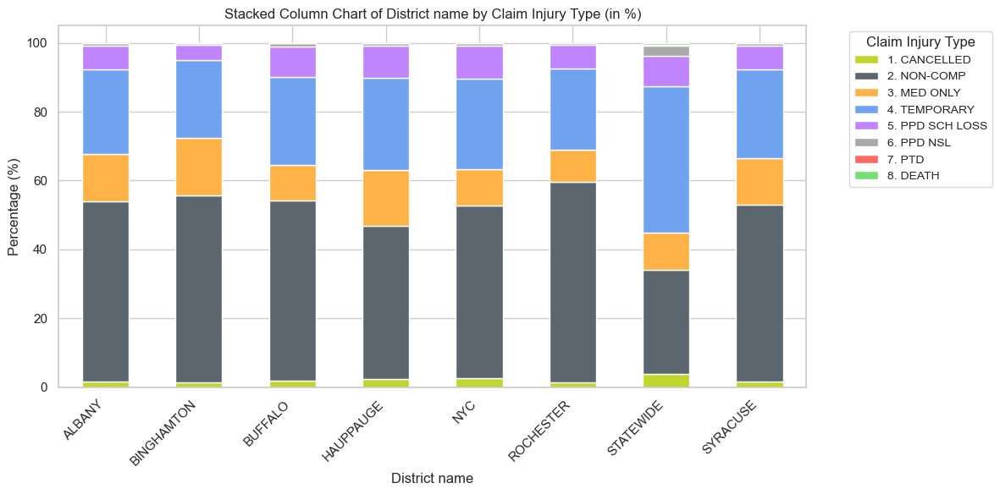

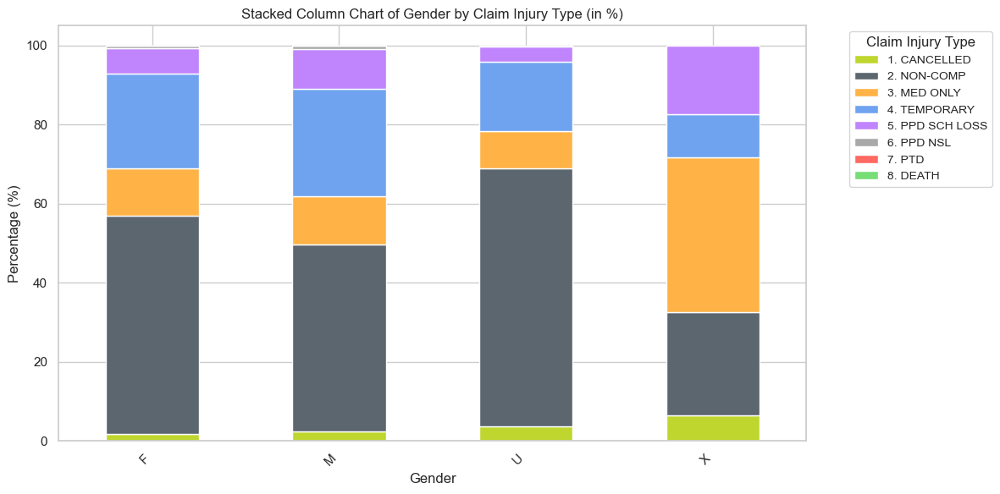

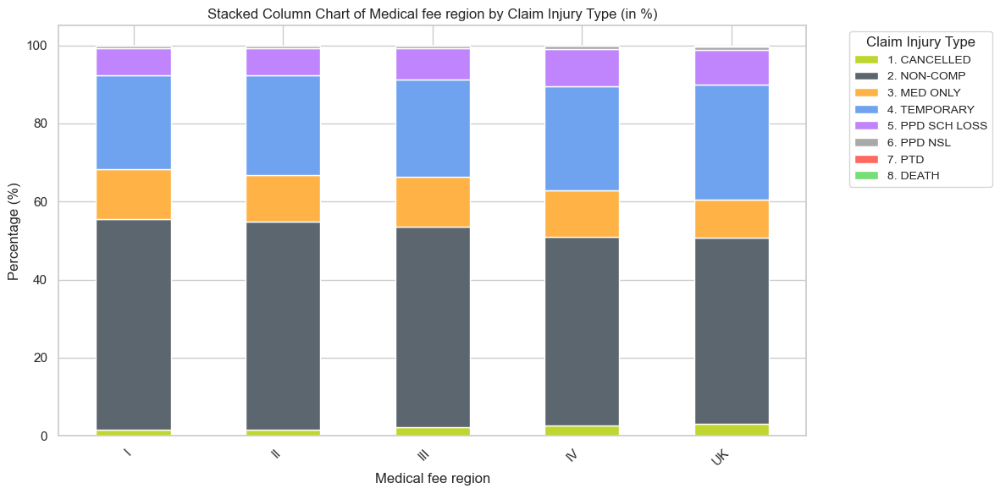

In [91]:
for feature in cat_feat_few_classes:
    # Create a crosstab
    ct = pd.crosstab(df[feature], df['Claim Injury Type'])
    
    # Normalize the counts to percentages
    ct_percentage = ct.div(ct.sum(axis=1), axis=0) * 100
    
    # Plotting the stacked column chart
    ct_percentage.plot(kind='bar', stacked=True, figsize=(12, 6))

    # Adding labels and title
    plt.xlabel(f'{feature.capitalize()}')
    plt.ylabel('Percentage (%)')
    plt.title(f'Stacked Column Chart of {feature.capitalize()} by Claim Injury Type (in %)')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Claim Injury Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title_fontsize='medium')
    plt.tight_layout()  # Adjust layout
    plt.show()

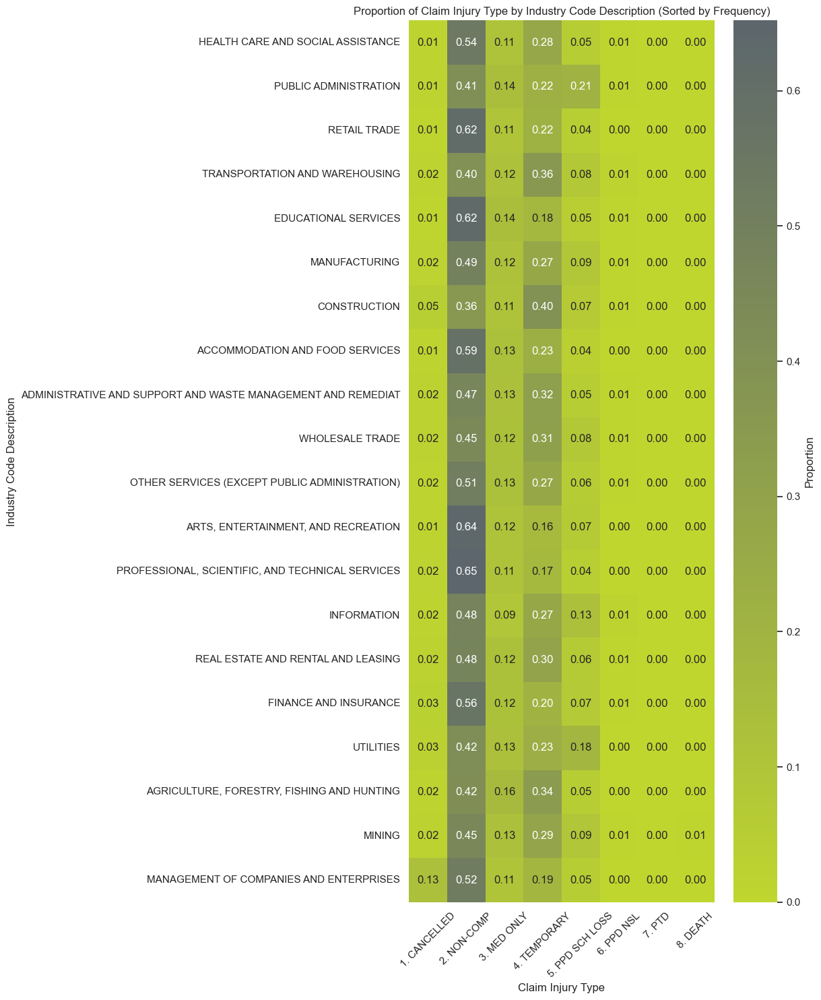

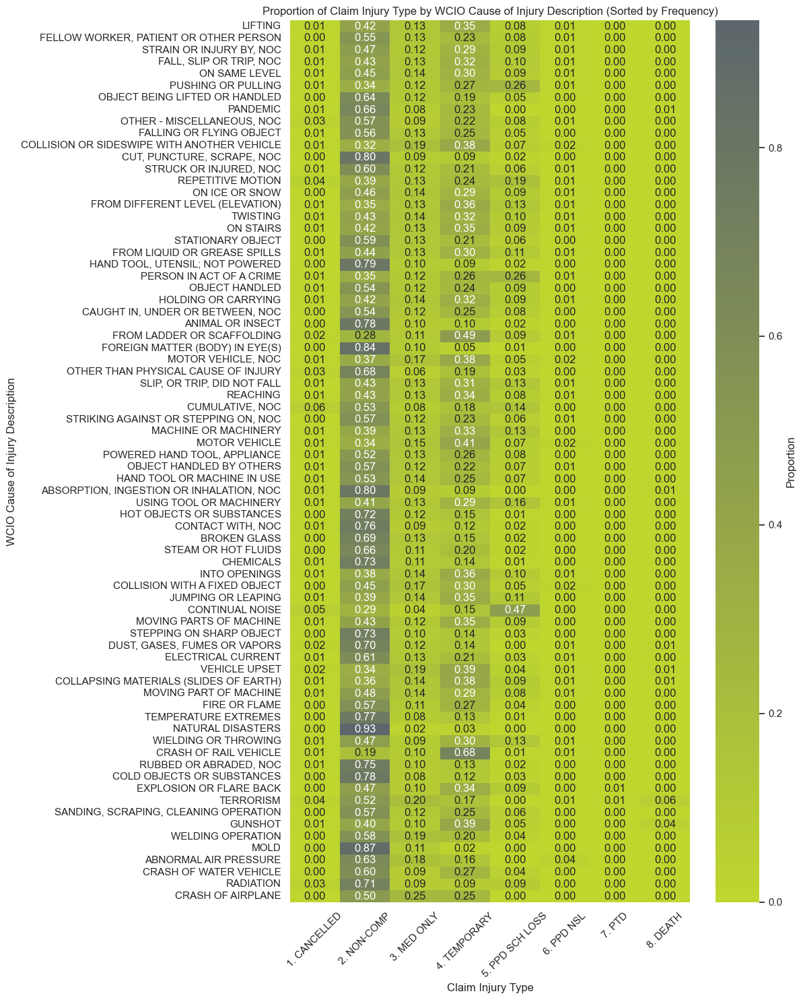

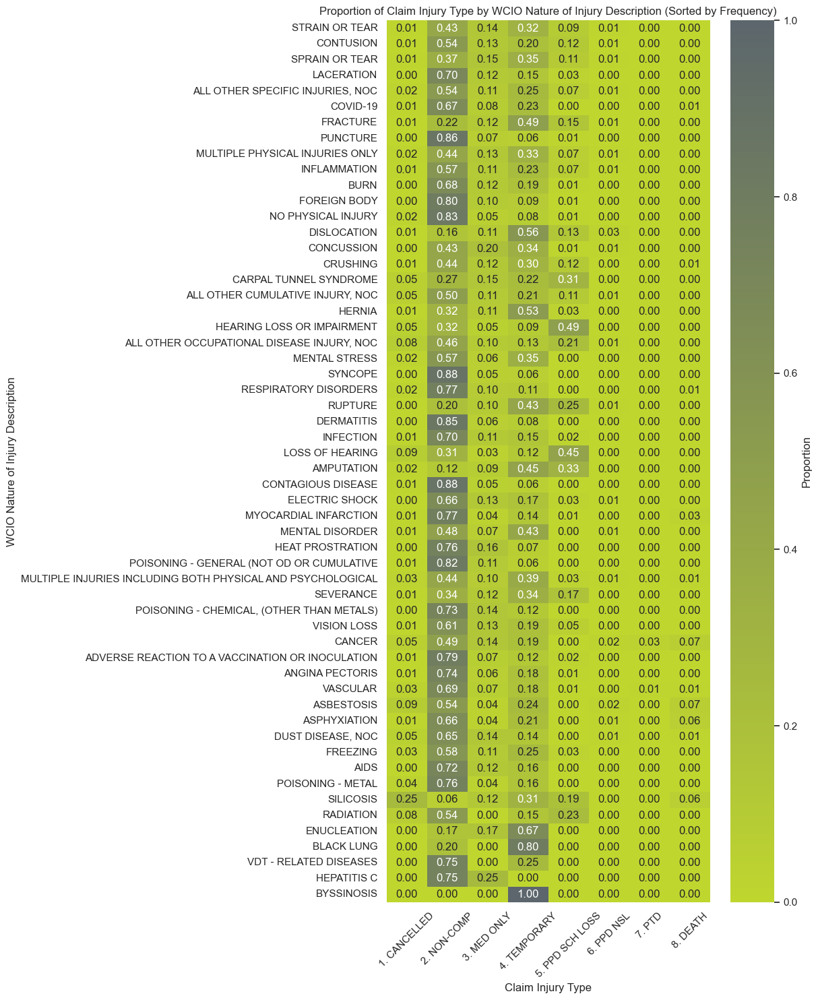

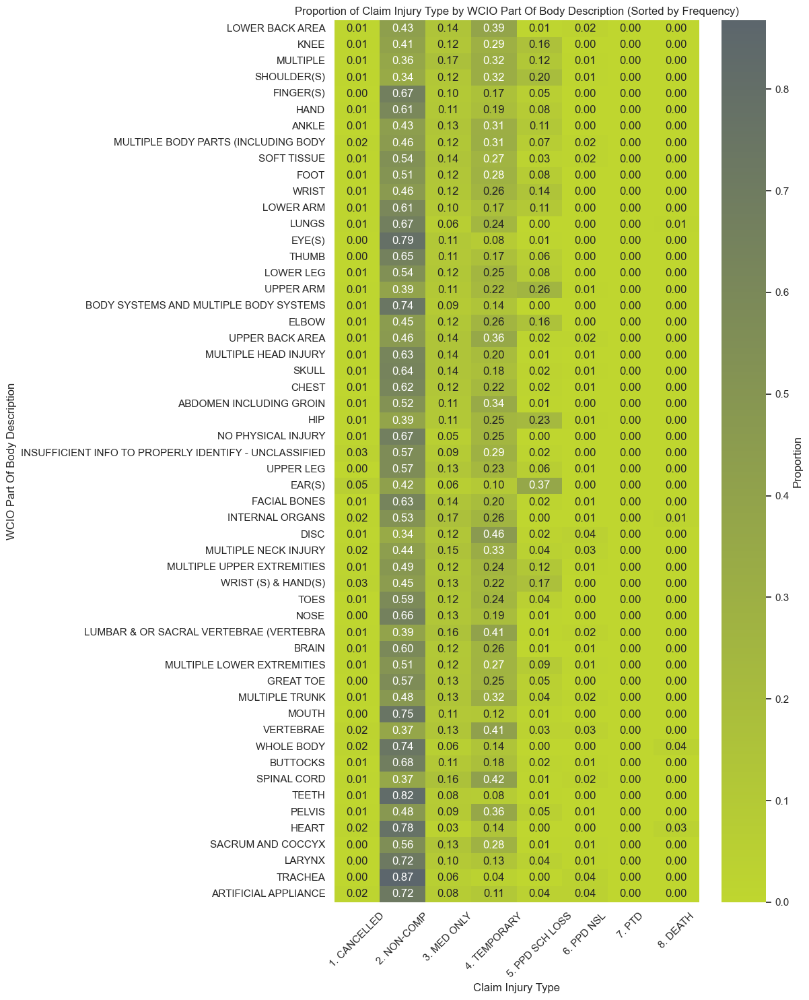

In [92]:
for feature in cat_feat_des:
    # Calculate proportions for each category within Claim Injury Type
    prop_table = df.groupby([feature, 'Claim Injury Type']).size().unstack(fill_value=0)
    prop_table = prop_table.apply(lambda x: x / x.sum(), axis=1)  # Normalize rows to get proportions

    # Sort feature categories by ascending frequency (total counts)
    category_order = df[feature].value_counts(ascending=False).index
    prop_table = prop_table.reindex(category_order)  # Reorder by frequency

    # Plot as a heatmap
    plt.figure(figsize=(12, 15))
    sns.heatmap(prop_table, cmap=custom_cmap, annot=True, fmt=".2f", cbar_kws={'label': 'Proportion'})
    plt.title(f'Proportion of Claim Injury Type by {feature} (Sorted by Frequency)')
    plt.xlabel('Claim Injury Type')
    plt.ylabel(feature)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

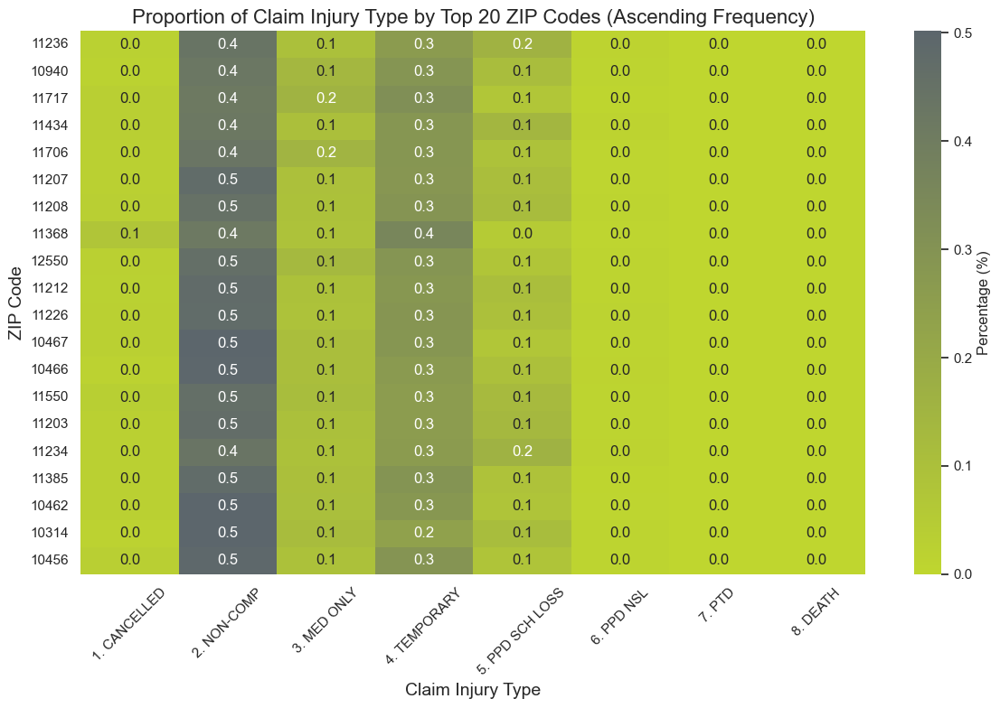

In [93]:
top_20_zip_codes = df['Zip Code'].value_counts().head(20).sort_values(ascending=False)

# Filter the DataFrame to include only rows with the top 20 ZIP codes
df_filtered = df[df['Zip Code'].isin(top_20_zip_codes.index)]

# Create a crosstab between 'Zip Code' and the target variable 'Claim Injury Type'
crosstab = pd.crosstab(df_filtered['Zip Code'], df_filtered['Claim Injury Type'])

# Normalize to get proportions
crosstab_percentage = crosstab.div(crosstab.sum(axis=1), axis=0)

# Reindex the crosstab by the ZIP codes' frequency order
crosstab_percentage = crosstab_percentage.reindex(top_20_zip_codes.index)

# Plot as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    crosstab_percentage, 
    annot=True, 
    fmt=".1f", 
    cmap=custom_cmap, 
    cbar_kws={'label': 'Percentage (%)'}
)

plt.title('Proportion of Claim Injury Type by Top 20 ZIP Codes (Ascending Frequency)', fontsize=16)
plt.xlabel('Claim Injury Type', fontsize=14)
plt.ylabel('ZIP Code', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

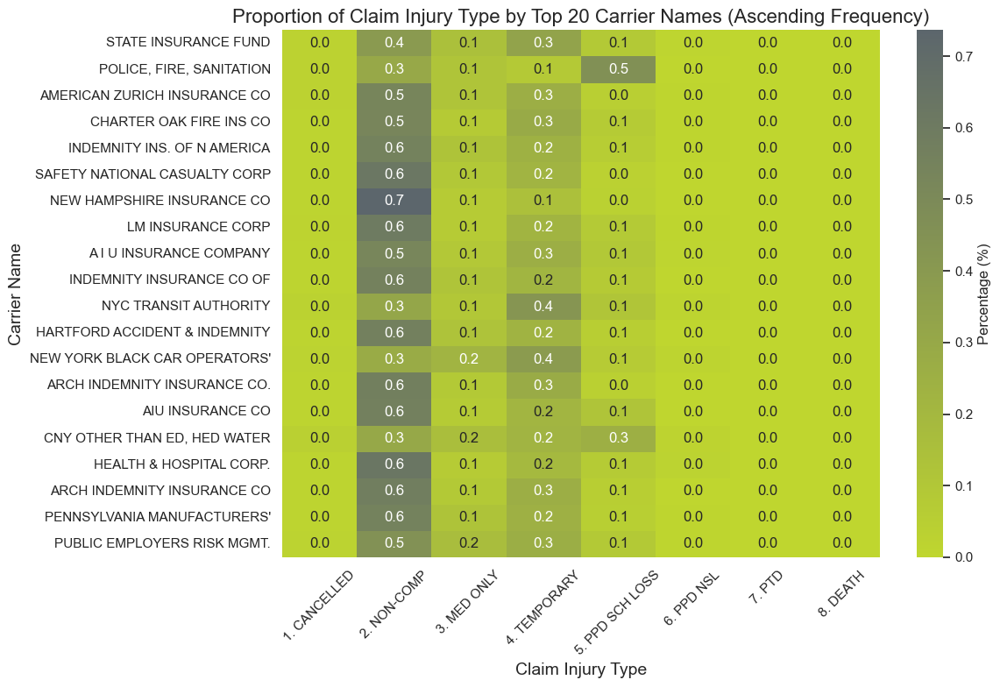

In [94]:
top_20_carrier_names = df['Carrier Name'].value_counts().head(20).sort_values(ascending=False)

# Filter the DataFrame to include only rows with the top 20 Carrier Names
df_filtered = df[df['Carrier Name'].isin(top_20_carrier_names.index)]

# Create a crosstab between 'Carrier Name' and the target variable 'Claim Injury Type'
crosstab = pd.crosstab(df_filtered['Carrier Name'], df_filtered['Claim Injury Type'])

# Normalize to get proportions
crosstab_percentage = crosstab.div(crosstab.sum(axis=1), axis=0)

# Reindex the crosstab by the Carrier Names' frequency order
crosstab_percentage = crosstab_percentage.reindex(top_20_carrier_names.index)

# Plot as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    crosstab_percentage, 
    annot=True, 
    fmt=".1f", 
    cmap=custom_cmap, 
    cbar_kws={'label': 'Percentage (%)'}
)

plt.title('Proportion of Claim Injury Type by Top 20 Carrier Names (Ascending Frequency)', fontsize=16)
plt.xlabel('Claim Injury Type', fontsize=14)
plt.ylabel('Carrier Name', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### Conclusions

#### Pairwise relationship of Numerical features
- Regarding correlations between the numeric features, we have high correlations in variables: `Birth Year` and `Age at Injury` **(-0.87)**. This makes sense because younger people (higher `Birth Year`) tend to have a lower `Age at Injury` when injured at work.`Assembly Date` and `Accident Date` have a correlation of **(0.89)**, wich means that the different claims take almost the same number of days to be assembled. `C-2 Date` and `Accident Date` have a correlation of **0.93**, meaning that C-2 is received within a similar time frame following the accident date for the different claims. `C-2 Date` and `Assembly Date` are as well highly correlated, so the same conclusions can be taken for these two features.
- It is also worth mentioning that `Number of Dependents` have very low correlation with all the other varaibles (almost 0).
- `Average Weekly Wage` and `First Hearing Date` have a positive correlation of **0.52** meaning that the higher the salary of the injury worker, the more time it takes for him to be heared about its injury.
- `Age at Injury` presents multidimensional outliers with variables `Average Weekly Wage` and `IME-4 Count`
- `Average Weekly Wage` present multidimensional outliers with `Birth Year` and `Number of Dependents`. We can see that in the pairplot `Average Weekly Wage` and `IME-4 Count` there are no high values for `Average Weekly Wage` which means that all the workers with a high weekly wage have missing values in `IME-4 Count`
- `IME-4 Count` presents multidimensional outliers with `Number of Dependents`.


#### Comparing categorical features

- The majority of the workers whose `Carrier Type` is **5C. SPECIAL FUND - POI CARRIER WCB MENANDS**, **5D. SPECIAL FUND - UNKNOWN** or **UNKNOWN** have a attorney as their representative.
- The vast majority of the cases that are being handled by the WCB office in **STATEWIDE** have an attorney as the worker representative.
- Almost 100% of the Non-binary people in our dataset have an attorney as their representative.
- Most workers injured because of **CONTINUAL NOISE** or because of **TERRORISM** have an Attorney/Representative. When it comes to the Nature of Injury, most workers with **HEARING LOSS OR IMPAIRMENT** or with **LOSS OF HEARING** have an Attorney/Representative, which makes sense given the statements made above for de **cause of injury**.
-  For all the workers whose value in `Alternative Dispute Resolution` is unknown, their carrier type is **4A. SELF PRIVATE**. The same happens for the workers that had an alternative dispute resolution.
-  **STATEWIDE** is the only district name where the `Carier Type` is **UNKNOWN** and **5D. SPECIAL FUND - UNKNOWN**.
- The majority of non-binary people `Carrier Type` is **3A. SELF PUBLIC**. Additionally, it is in this gender of people that we find the value **UNKNOWN** for the variable `Carrier Type`
- Most workers in **EDUCATIONAL SERVICES** or in **PUBLIC ADMINISTRATION** have a **SELF PUBLIC** carrier type.
- Most workers in the services sector (**FINANCE AND INSURANCE**, **INFORMATION**, **MANAGEMENT OF COMPANIES AND ENTERPRISES**) have a **PRIVATE** carrier type.
- `Carrier Type` is perfectly correlated with `Carrier Name`. The workers with the same `Carrier Name` have the same `Carrier Type`
-  Workers with an adjudication process external to the Board, or for whom this information is unknown, were not appointed as potential cases of COVID-19.
- Workers whose `Carier Type` are: **5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)**, **5C. SPECIAL FUND - POI CARRIER WCB MENANDS**, **5D. SPECIAL FUND - UNKNOWN** were not appointed as potential cases of COVID-19.
- Non-binary workers weren't appointed as potential cases of COVID-19.
- Workers in Agriculture, Forestry, Fishing and Hunting weren't appointed as potential cases of COVID-19.
- As it was expected, workers with **PANDEMIC**  and **NATURAL DISASTERS** as cause of injury are related to COVID-19.
- All the workers whose value in `Alternative Dispute Resolution` is unknown, are male.
- Cases whose `Carrier Type` is **5C. SPECIAL FUND - POI CARRIER WCB MENANDS** only provide conpensation to male and people whose gender is unknown.
- We have female workers specially in **EDUCATIONAL SERVICES** and in **HEALTH CARE AND ASSISTANCE** and male workers specially in **CONSTRUCTION**, **MINING**, **REAL ESTATE AND RENTAL AND LEASING**, **UTILITIES** and **WHOLESALE TREADE**.
- **NEW YORK BLACK CAR OPERATORS'** is a `Carrier Name` mostly related to males.
- In all other categorical features, the distribution of male and female are similar across all categories.
- Poeple whose `Alternative Dispute Resolution` is unknown are treated only in medical regions III and IV.
- The region the workers are treated depends on the District office that oversees the claim.
- **AGRICULTURE, FORESTY, FISHING AND HUTING** are mostly assigned to medical region *I*, which means that is is likely a forest/agriculture area. In fact, industries related to services have a very small percentage of workers assigned to this medical region.
- `Zip Code` is perfectly correlated with `Medical Fee Region`.


#### Mean and quantiles of numerical features grouped by categorical features

- Mean and median of `Age at Injury` is around the same values for all diferente industries.
- When it comes to `Average Weekly Wage`, industries like **INFORMATION**, **PUBLIC ADMINISTRATION** and **UTILITIES** have a higher mean and 75th quantile. The medians are almost all zero.
- Medical regions I and II have a lower `Average Weekly Wage`, while III, IV and unknow regions have a higher value for this numerical feature.


#### Ploting input features against the target feature

#### Numeric features
- `Age at Injury`, `IME-4 Count`, `Assembly Date`, `C-2 Date`, `C-3 Date` and `First Hearing Date` are variables that have discriminatory power to aid us classify the value in the target variable. The quantiles of `Age at Injury` are specially different in the **CANCELLED**, **DEATH** and **PTD** categories. The categories **TEMPORARY**, **PPD NSL** and **PTD** have higher quantiles for `IME-4 Count`.
- `Accident Date`, `Number of Dependents`, `Birth Year` and `Average Weekly Wage` are variables that do not appear to have any kind of discriminatory power towards the different values in the target feature.

#### Categorical features
- `Alternative Dispute Resolution`, `Attorney/Representative`, `Carrier Type`, `COVID-19 Indicator` variables have some discriminatory power towards the target feature.
    - If the value in `Alternative Dispute Resolution` is U the `Claim Injury Type` is **2. NON-COMP**.
    - If the value in `Alternative Dispute Resolution` is Y the `Claim Injury Type` is **2. NON-COMP** almost always.
    - The variable `Attorney/Representative` aids us in identifying class **5. PPD SCH LOSS**, since if the value is 'N', there is very low percentage of observations in that correspond to class **5. PPD SCH LOSS**, while if the value is 'Y' then this percentage is largely increased.
    - If the value in `Carrier Type` is **5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)** the values of the target feature can only be **1. CANCELLED** or **3. MED ONLY**.
    - If the value in `Carrier Type` is **5C. SPECIAL FUND - POI CARRIER WCB MENANDS** the values of the target feature can only be **1. CANCELLED** or **4. TEMPORARY**.
    - If the value in `Carrier Type` is **UNKOWN** then there is a significant proportion of injuries classified as **2. NON-COMP**
    - Variable `COVID-19 Indicator` aids us in identifying class **5. PPD SCH LOSS**, having the opposite behaviour of variable `Attorney/Representative` (more % in the 'N' and very low percentage in 'Y').
- When it comes to the codes and descriptions, there are some classes that can help us predicting the target
    - The cause of Injury **CONTINUAL NOISE** is **almost 50% of the times** classified as **PPD SCH LOSS**. **Almost 70%** of **CRASH OF RAIL VEHICLE** is classified as **TEMPORARY**.
    - The codes and the descriptions **don't help** predicting the minoritary classes for the target.

## 3.6. Additional Features Exploration

`Step 45` Create variable time_to_assembly that is the difference between `Assembly Date` and `Accident Date`.

In [95]:
# Convert again the date columns to date time
for col in date_columns:
    df[col] = pd.to_datetime(df[col], errors='coerce')

In [96]:
df['time_to_assembly'] = (df['Assembly Date'] - df['Accident Date']).dt.days

`Step 45.1` Check the histogram of this new created variable.

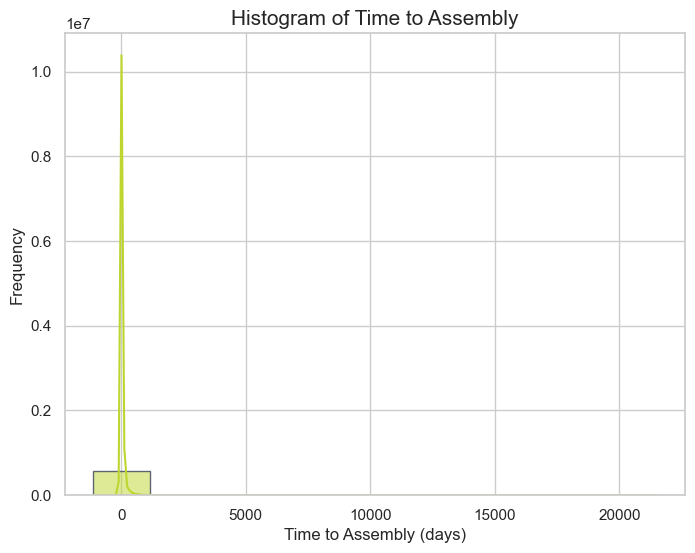

In [97]:
# Plot histogram of 'time_to_assembly'
plt.figure(figsize=(8, 6))
sns.histplot(df['time_to_assembly'], bins=10, kde=True, color=color_390, edgecolor=color_431)

# Add labels
plt.title('Histogram of Time to Assembly', fontsize=15)
plt.xlabel('Time to Assembly (days)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Show the plot
plt.show()

`Step 45.2` Checking the box plot of this new created variable.

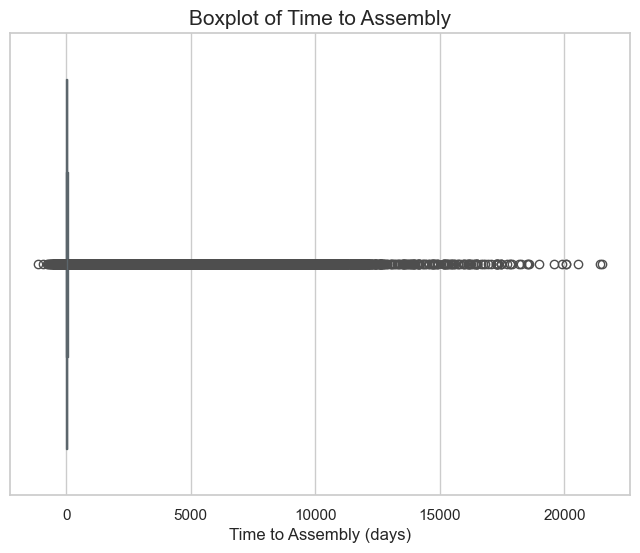

In [98]:
# Suppress warnings
warnings.filterwarnings("ignore") 

# Plot boxplot of 'time_to_assembly'
plt.figure(figsize=(8, 6))  # Optional: adjust the size of the plot
sns.boxplot(x=df['time_to_assembly'], color=color_390,
                boxprops=dict(edgecolor=color_431), 
                whiskerprops=dict(color=color_431),
                capprops=dict(color=color_431),
                medianprops=dict(color=color_431))

# Add labels
plt.title('Boxplot of Time to Assembly', fontsize=15)
plt.xlabel('Time to Assembly (days)', fontsize=12)

# Show the plot
plt.show()

`Step 45.3` Ploting `time_to_assembly` against `Claim Injury Type` using a boxplot.

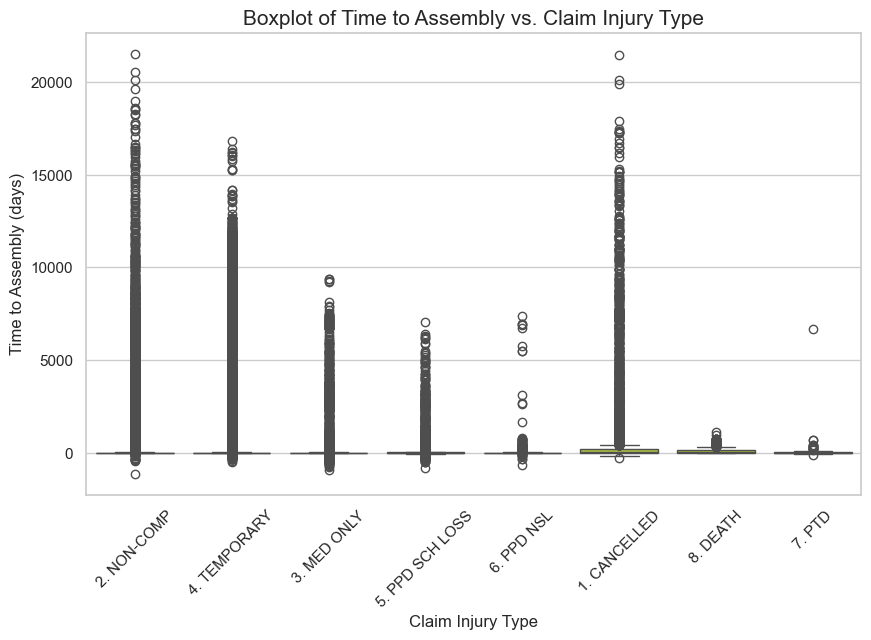

In [99]:
# Example DataFrame (Assuming df already has 'Claim Injury Type' and 'time_to_assembly' columns)
# Plot boxplot of 'time_to_assembly' against 'Claim Injury Type'
plt.figure(figsize=(10, 6))  # Optional: adjust the size of the plot
sns.boxplot(x='Claim Injury Type', y='time_to_assembly', data=df)

# Rotate x-axis labels if they are long
plt.xticks(rotation=45)

# Add labels and title
plt.title('Boxplot of Time to Assembly vs. Claim Injury Type', fontsize=15)
plt.xlabel('Claim Injury Type', fontsize=12)
plt.ylabel('Time to Assembly (days)', fontsize=12)

# Show the plot
plt.show()

`Step 46` Create the variable `C-2 delivered on time` that takes the value 1 if the difference between `C-2 Date` and `Accident Date` is lower or equal than 10 days and 0 otherwise. If the value in one of the rows in NaN this new variable will have the value NaN.

In [100]:
df['C-2 delivered on time'] = np.where(
    (df['C-2 Date'].notna()) & (df['Accident Date'].notna()) & 
    ((df['C-2 Date'] - df['Accident Date']).dt.days <= 10),
    1, np.where(
        (df['C-2 Date'].notna()) & (df['Accident Date'].notna()) & 
        ((df['C-2 Date'] - df['Accident Date']).dt.days > 10),
        0, np.nan
    )
)

`Step 46.1` Create a bar plot of `C-2 delivered on time`.

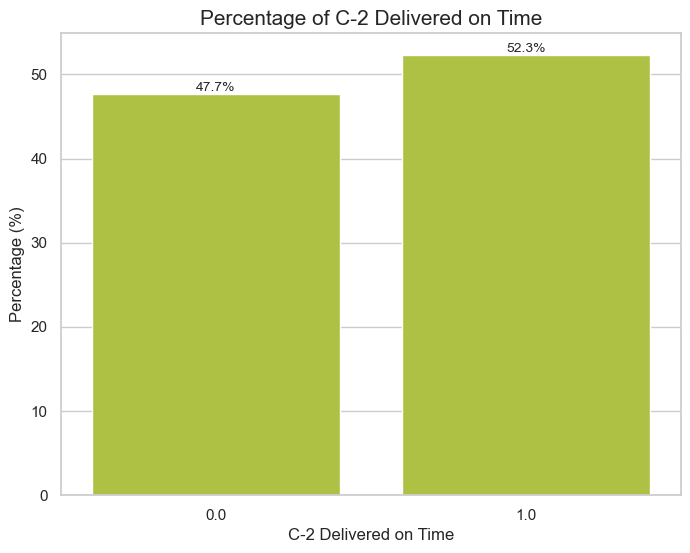

In [101]:
# Set Seaborn style
sns.set(style='whitegrid')

# Calculate the percentage of each category
percentage_data = df['C-2 delivered on time'].value_counts(normalize=True) * 100
percentage_df = percentage_data.reset_index()
percentage_df.columns = ['C-2 delivered on time', 'Percentage']

# Create a bar plot of percentages
plt.figure(figsize=(8, 6))
bar_plot = sns.barplot(x='C-2 delivered on time', y='Percentage', data=percentage_df, color=color_390)

# Add labels and title
plt.title('Percentage of C-2 Delivered on Time', fontsize=15)
plt.xlabel('C-2 Delivered on Time', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)

# Annotate the bars with percentage values
for p in bar_plot.patches:
    bar_plot.annotate(f'{p.get_height():.1f}%', 
                      (p.get_x() + p.get_width() / 2., p.get_height()), 
                      ha='center', va='bottom', fontsize=10)

# Show the plot
plt.show()

`Step 46.2` Plot `C-2 delivered on time` against the target feature.

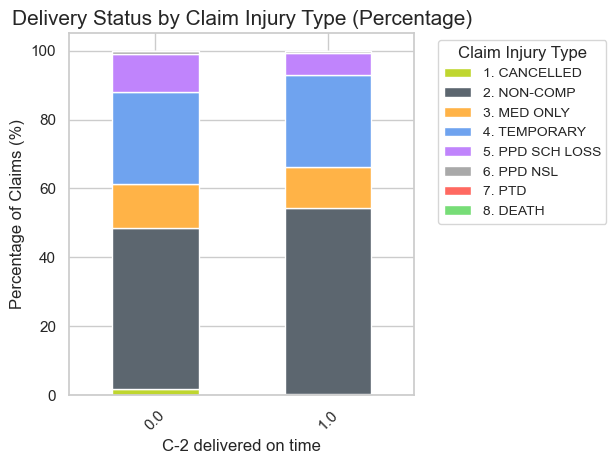

In [102]:
sns.set_palette(custom_palette)

# Count occurrences of each Claim Injury Type for both delivered and not delivered
count_df = df.groupby(['C-2 delivered on time', 'Claim Injury Type']).size().unstack(fill_value=0)

# Calculate percentages
percentage_df = count_df.div(count_df.sum(axis=1), axis=0) * 100

# Plotting the stacked bar chart
percentage_df.plot(kind='bar', stacked=True)

# Adding titles and labels
plt.title('Delivery Status by Claim Injury Type (Percentage)', fontsize=15)
plt.xlabel('C-2 delivered on time', fontsize=12)
plt.ylabel('Percentage of Claims (%)', fontsize=12)
plt.legend(title='Claim Injury Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title_fontsize='medium')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

`Step 47` Create the variable `C-3 delivered on time` that takes the value 1 if the difference between `C-3 Date` and `Accident Date` is lower or equal than 730 days and 0 otherwise. If the value in one of the rows in NaN this new variable will have the value NaN.

In [103]:
# Calculate the difference in days
date_difference = (df['C-3 Date'] - df['Accident Date']).dt.days

# Create the 'C-3 delivered on time' variable
df['C-3 delivered on time'] = date_difference.apply(lambda x: 1 if x <= 730 and x >= 0 else (0 if x > 730 else None))

# Show the updated DataFrame
df['C-3 delivered on time'].value_counts()

C-3 delivered on time
1.0    180247
0.0      2262
Name: count, dtype: int64

`Step 47.1` Create a bar plot of `C-3 delivered on time`.

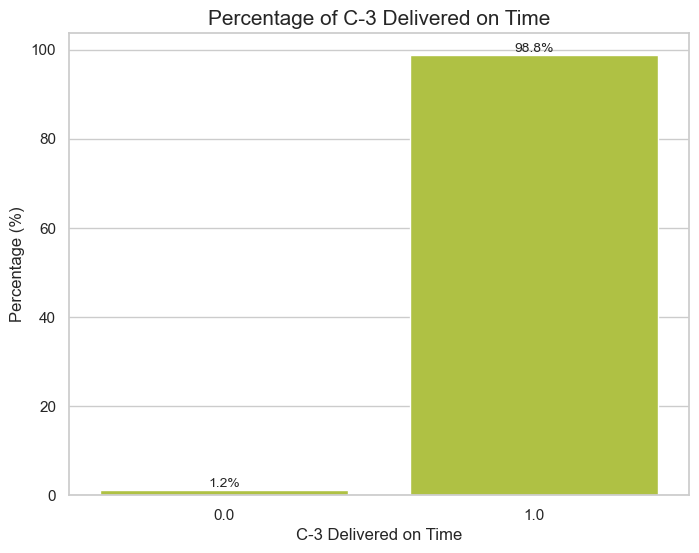

In [104]:
# Calculate the percentage of each category
percentage_data = df['C-3 delivered on time'].value_counts(normalize=True) * 100
percentage_df = percentage_data.reset_index()
percentage_df.columns = ['C-3 delivered on time', 'Percentage']

# Create a bar plot of percentages
plt.figure(figsize=(8, 6))
bar_plot = sns.barplot(x='C-3 delivered on time', y='Percentage', data=percentage_df, color=color_390)

# Add labels and title
plt.title('Percentage of C-3 Delivered on Time', fontsize=15)
plt.xlabel('C-3 Delivered on Time', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)

# Annotate the bars with percentage values
for p in bar_plot.patches:
    bar_plot.annotate(f'{p.get_height():.1f}%', 
                      (p.get_x() + p.get_width() / 2., p.get_height()), 
                      ha='center', va='bottom', fontsize=10)

# Show the plot
plt.show()

`Step 47.2` Plot `C-3 delivered on time` against the target feature.

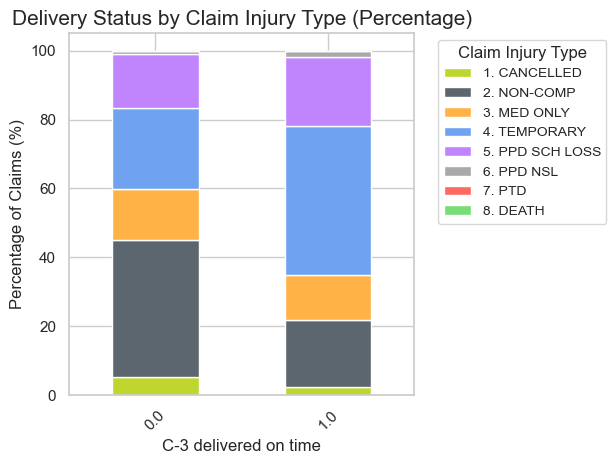

In [105]:
# Count occurrences of each Claim Injury Type for both delivered and not delivered
count_df = df.groupby(['C-3 delivered on time', 'Claim Injury Type']).size().unstack(fill_value=0)

# Calculate percentages
percentage_df = count_df.div(count_df.sum(axis=1), axis=0) * 100

# Plotting the stacked bar chart
percentage_df.plot(kind='bar', stacked=True)

# Adding titles and labels
plt.title('Delivery Status by Claim Injury Type (Percentage)', fontsize=15)
plt.xlabel('C-3 delivered on time', fontsize=12)
plt.ylabel('Percentage of Claims (%)', fontsize=12)
plt.legend(title='Claim Injury Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title_fontsize='medium')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

`Step 48` Create the variable `Hearing` that has the value 1 if the the value in `First Hearing Date` is not NaN, and 0 otherwise.

In [106]:
df['Hearing'] = np.where(df['First Hearing Date'].notna(), 1, 0)
df['Hearing'].value_counts()

Hearing
0    442673
1    150798
Name: count, dtype: int64

`Step 48.1` Create a bar plot of `Hearing`. 

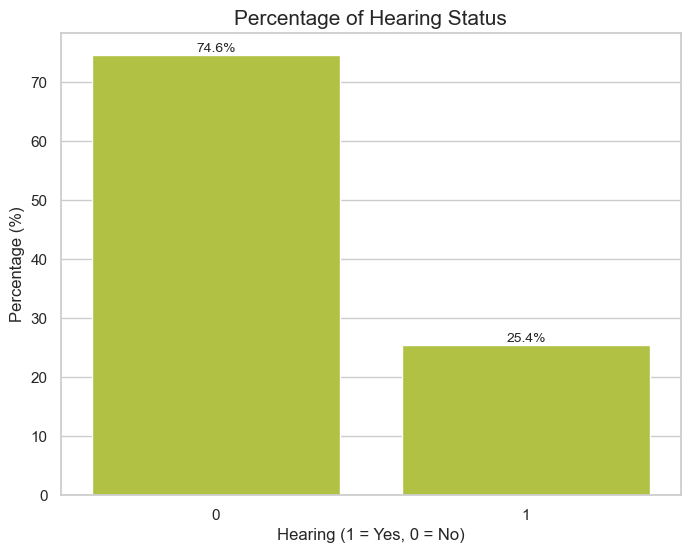

In [107]:
# Calculate the percentage of each category in the 'Hearing' variable
percentage_data = df['Hearing'].value_counts(normalize=True) * 100
percentage_df = percentage_data.reset_index()
percentage_df.columns = ['Hearing', 'Percentage']

# Create a bar plot of percentages
plt.figure(figsize=(8, 6))
bar_plot = sns.barplot(x='Hearing', y='Percentage', data=percentage_df)

# Add labels and title
plt.title('Percentage of Hearing Status', fontsize=15)
plt.xlabel('Hearing (1 = Yes, 0 = No)', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)

# Annotate the bars with percentage values
for p in bar_plot.patches:
    bar_plot.annotate(f'{p.get_height():.1f}%', 
                      (p.get_x() + p.get_width() / 2., p.get_height()), 
                      ha='center', va='bottom', fontsize=10)

# Show the plot
plt.show()

`Step 48.2` Plot `Hearing` against the target feature.

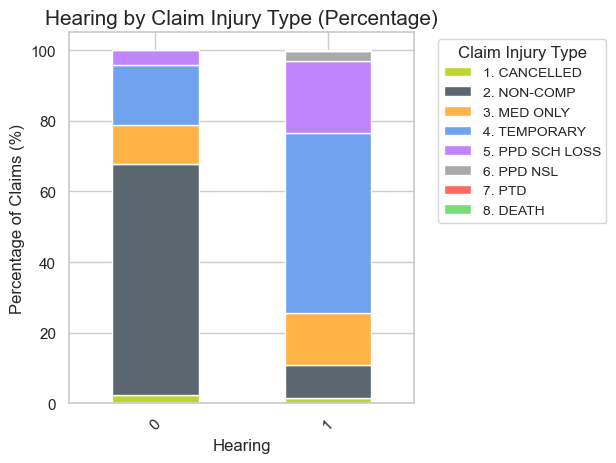

In [108]:
# Count occurrences of each Claim Injury Type for both delivered and not delivered
count_df = df.groupby(['Hearing', 'Claim Injury Type']).size().unstack(fill_value=0)

# Calculate percentages
percentage_df = count_df.div(count_df.sum(axis=1), axis=0) * 100

# Plotting the stacked bar chart
percentage_df.plot(kind='bar', stacked=True)

# Adding titles and labels
plt.title('Hearing by Claim Injury Type (Percentage)', fontsize=15)
plt.xlabel('Hearing', fontsize=12)
plt.ylabel('Percentage of Claims (%)', fontsize=12)
plt.legend(title='Claim Injury Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title_fontsize='medium')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

`Step 49` Create features `accident_year` and `accident_month` that is the year of the accident and the month of the accident respectively.

In [109]:
df['accident_year'] = df['Accident Date'].dt.year
df['accident_month'] = df['Accident Date'].dt.month

`Step 49.1` Compute the histogram of `accident_year` and `accident_month`.

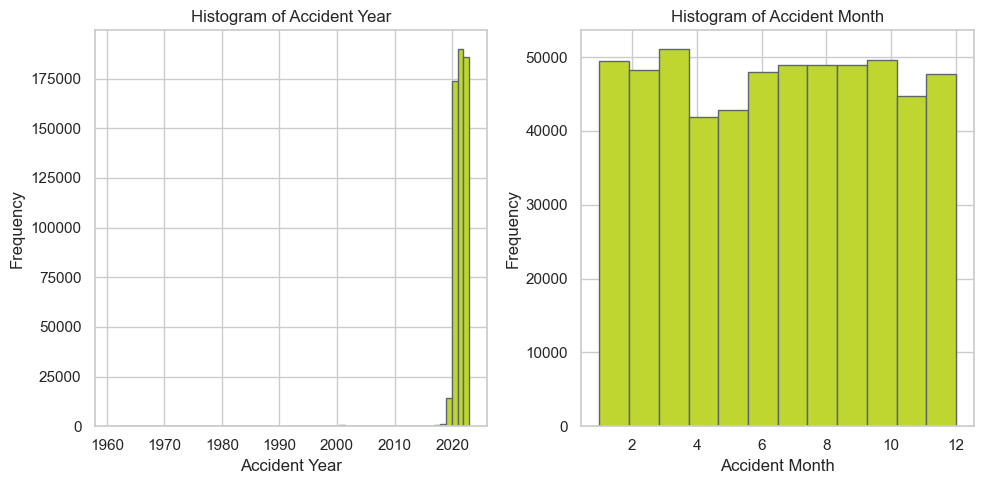

In [110]:
# Compute and display histogram for `accident_year`
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
plt.hist(df['accident_year'], bins=len(df['accident_year'].unique()), color=color_390, edgecolor=color_431)
plt.xlabel('Accident Year')
plt.ylabel('Frequency')
plt.title('Histogram of Accident Year')

# Compute and display histogram for `accident_month`
plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
plt.hist(df['accident_month'], bins=12, color=color_390, edgecolor=color_431)
plt.xlabel('Accident Month')
plt.ylabel('Frequency')
plt.title('Histogram of Accident Month')

# Display the histograms
plt.tight_layout()
plt.show()

`Step 49.2` Plot `accident_year` and `accident_month` against the target feature.

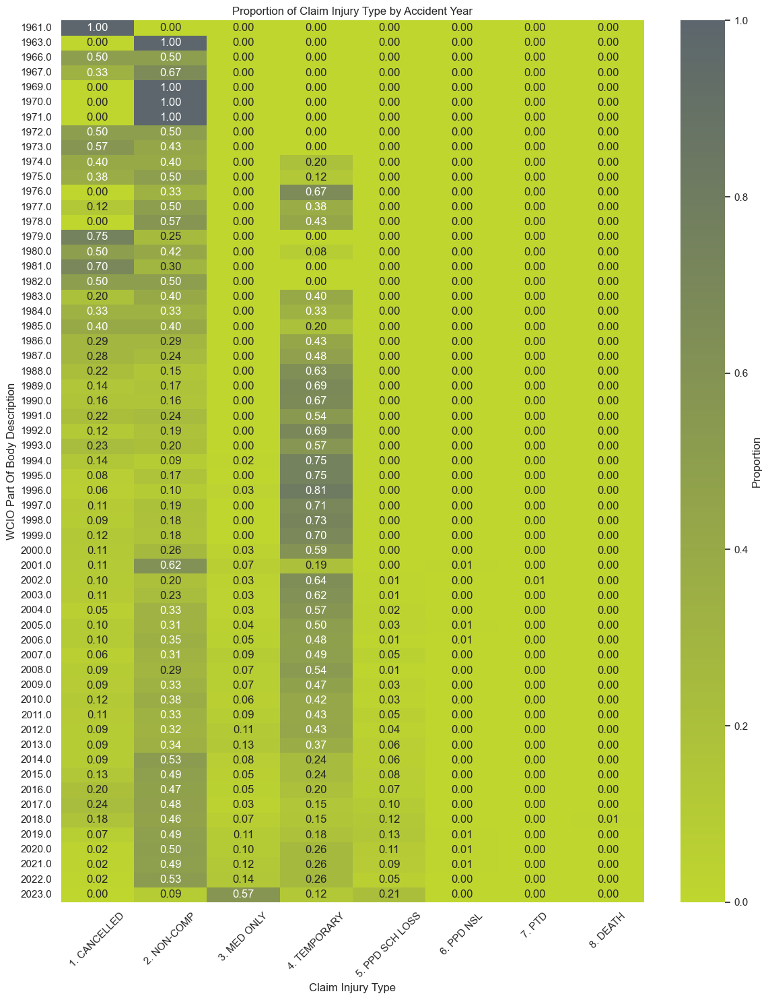

In [111]:
prop_table = df.groupby(['accident_year', 'Claim Injury Type']).size().unstack(fill_value=0)
prop_table = prop_table.apply(lambda x: x / x.sum(), axis=1)  # Normalize rows to get proportions

# Plot as a heatmap
plt.figure(figsize=(12, 15))
sns.heatmap(prop_table, cmap=custom_cmap, annot=True, fmt=".2f", cbar_kws={'label': 'Proportion'})
plt.title(f'Proportion of Claim Injury Type by Accident Year')
plt.xlabel('Claim Injury Type')
plt.ylabel(feature)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

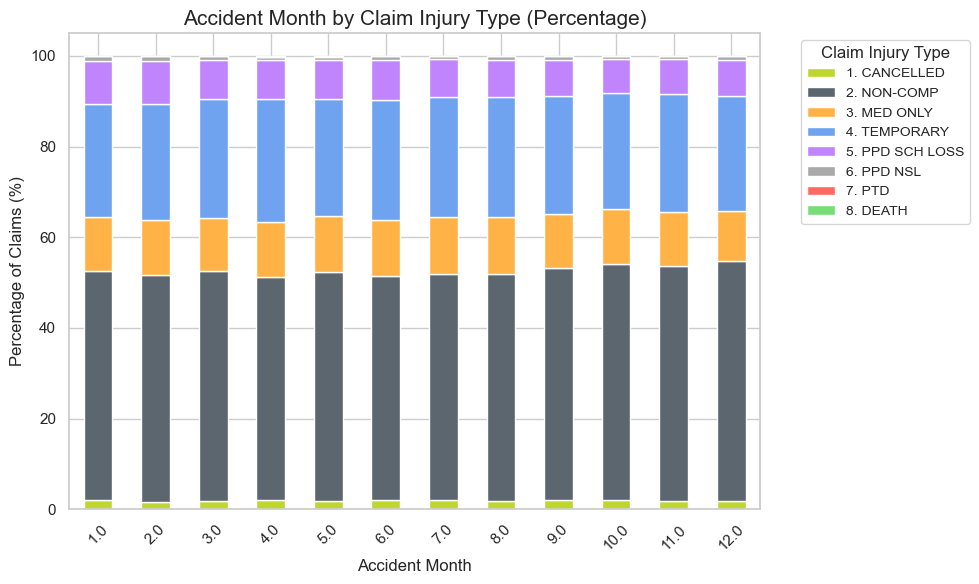

In [112]:
# Group by accident_month and target, then count occurrences
count_month_df = df.groupby(['accident_month', 'Claim Injury Type']).size().unstack(fill_value=0)

# Calculate percentages for each month
percentage_month_df = count_month_df.div(count_month_df.sum(axis=1), axis=0) * 100

# Plotting the stacked bar chart for accident_month
percentage_month_df.plot(kind='bar', stacked=True, figsize=(10, 6))

# Adding titles and labels
plt.title('Accident Month by Claim Injury Type (Percentage)', fontsize=15)
plt.xlabel('Accident Month', fontsize=12)
plt.ylabel('Percentage of Claims (%)', fontsize=12)
plt.legend(title='Claim Injury Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title_fontsize='medium')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

In [113]:
df = df.drop(columns=['accident_year', 'accident_month'])

#### Conclusions
`time_to_assembly`

- This variable happears to have a more symetric distribution.
- The variable have an absurd number of outliers
- In terms of given us discriminatory power towards the target, it is not very usefull.

`C-2 delivered on time`

- **47.7%** of the employers that had a worked who suffered an injury did not delivered the C-2 form on time.
- This feature does not display a major discriminatory power towards the target feature.

`C-3 delivered on time`

- **98.8%** of the workers that suffered an injury did deliver the C-3 form on time.
- This variable is definitely better than `C-2 delivered on time` in terms of discriminatory power, but it still does not seem to have a lot of power to do so.

`Hearing`

- **74.6%** of the injured workers weren't still been hearder by the WCB board.
- In terms of discriminatory power towards the target it seems to have some discriminatory power towards the target feature. It helps us identify **6. PPD NSL**, **2. NON-COMP** and **5. PPD SCH LOSS**.

`Accident Year` & `Accident Month`

- These variables do not seem to give us much predictive power.

# 4. Data Preprocissing

### Treat Incoherences

`Step 50` Solving incoherences in variable `Accident Date`.

In [114]:
# Create a copy of the dataset
data = df.copy()

# Remove the rows where "Accident Date" is Bigger then the "C-2 Date"
data = data[~(data['Accident Date'] > data['C-2 Date'])]

# Remove the rows where "Accident Date" is Bigger then the "C-3 Date"
data = data[~(data['Accident Date'] > data['C-3 Date'])]

# Remove values from 2023
data = data[data['Accident Date'] <= "2022-12-31"]

`Step 51` Transforming the values in column `Age at Injury` that are equal to 0 into NaN.

In [115]:
data[data['Age at Injury'] == 0]
data["Age at Injury"] = data["Age at Injury"].replace(0, np.nan)

`Step 51.1` Removing rows where `Age at Injury` is lower than 18.

In [116]:
data = data[data['Age at Injury'] > 18]

`Step 52` Transforming the values in column `Birth Year` that are equal to 0 into NaN.

In [117]:
data["Birth Year"] = data["Birth Year"].replace(0, np.nan)

`Step 53` Solve missing values in `Birth Year` as the difference in the year in `Accident Date` and `Age at Injury`.

In [118]:
data["Birth Year"] = data["Birth Year"].fillna(data['Accident Date'].dt.year - data['Age at Injury'])

`Step 54` Attribute the arbitrary value '2030-01-01' to the missing values in `First Hearing Date`, since missing values represent that a missing value in this variable represents that the hearing was not held.

In [119]:
# Substitute missing values in 'First Hearing Date' with '2025-01-01'
data['First Hearing Date'] = data['First Hearing Date'].fillna('2030-01-01')

# Verify the substitution
data['First Hearing Date'].isna().sum()

0

`Step 55` Remove rows where the First Hearing was held before the the accident or before assembly.

In [120]:
# Remove rows where 'First Hearing Date' is less than both 'Accident Date' and 'Assembly Date'
data = data[~((data['First Hearing Date'] < data['Accident Date']) | (data['First Hearing Date'] < data['Assembly Date']))]

`Step 56` Turning into NaN all observations with incoherences in `C-2 Date`.

In [121]:
# Replace 'C-2 Date' values with NaN where 'C-2 Date' is after 'First Hearing Date'
data.loc[(data['C-2 Date'] > data['First Hearing Date']) & 
               data['C-2 Date'].notna() & 
               data['First Hearing Date'].notna(), 'C-2 Date'] = np.nan

# Define the maximum valid 'Assembly Date'
max_assembly_date = pd.to_datetime('2022-12-31')

# Replace 'C-2 Date' values with NaN where 'C-2 Date' is after the maximum valid 'Assembly Date'
data.loc[(data['C-2 Date'] > max_assembly_date) & 
               data['C-2 Date'].notna(), 'C-2 Date'] = np.nan

`Step 57` Solving the incoherences in variable `COVID-19 Indicator`.

In [122]:
# Update 'COVID-19 Indicator' to 'Y' where the in WCIO Nature of Injury Description it is indicated as COVID-19
data.loc[(data['COVID-19 Indicator'] != 'Y') & (data['WCIO Nature of Injury Description'] == 'COVID-19'), 'COVID-19 Indicator'] = 'Y'

`Step 58` Change value MULTIPLE to NaN in variable `WCIO Part Of Body Description`.

In [123]:
data['WCIO Part Of Body Description'] = data['WCIO Part Of Body Description'].replace("MULTIPLE", np.nan)

`Step 59` Transform the rows whose `Zip Code` is a float into an integer value.

In [124]:
data['Zip Code'] = data['Zip Code'].apply(lambda x: int(float(x)) if can_be_int(x) else x)

`Step 59.1` Turn into NaN Zip Codes whose value is a string.

In [125]:
# Create a mask for non-5-digit zip codes that cannot be converted to integers
invalid_zip_mask = data['Zip Code'].notna() & data['Zip Code'].apply(cannot_be_int)

# Set those observations to NaN in the 'Zip Code' column
data.loc[invalid_zip_mask, 'Zip Code'] = np.nan

`Step 59.2` Turn into NaN Zip Codes whose value is below 10000 (have less than 5 digits).

In [126]:
data.loc[data['Zip Code'] < 10000, 'Zip Code'] = np.nan

### Feature Engeneering

`Step 60` Turn the variable `Attorney/Representative` into a binary (0, 1) where 1 is Y and 0 is N.

In [127]:
data['Attorney/Representative'] = data['Attorney/Representative'].map({'Y': 1, 'N': 0})

`Step 61` Turn the variable `COVID-19 Indicator` into a binary (0, 1) where 1 is Y and 0 is N.

In [128]:
data['COVID-19 Indicator'] = data['COVID-19 Indicator'].map({'Y': 1, 'N': 0})

`Step 62` Create a list *var_frequency_encoding* that stores the name of the features that will transformed through frequency encoding.

In [129]:
var_frequency_encoding = ["Alternative Dispute Resolution", "Carrier Name", "Carrier Type", "County of Injury", "District Name", "Gender", 
                          "Industry Code Description", "Medical Fee Region", "WCIO Cause of Injury Description", 
                          "WCIO Nature of Injury Description", "WCIO Part Of Body Description", "Zip Code"]

`Step 62.1` Define a function named frequency_encoding to perform frequency encoding.

In [130]:
# Function to perform frequency encoding on multiple columns
def frequency_encoding(df, columns):
    for column in columns:
        # Calculate the frequency of each category in the column
        freq_encoding = df[column].value_counts(normalize=True)  # relative frequencies
        # Replace categories with their corresponding frequencies
        df[column] = df[column].map(freq_encoding)
    return df

`Step 62.2` Apply the function *frequency_encoding* to the dataframe data.

In [131]:
data = frequency_encoding(data, var_frequency_encoding)

`Step 63` Turn Date variables into numeric by calculating the difference in days between each date and a reference date (January 1, 2000).

In [132]:
data['Accident Date'] = (data['Accident Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
data['Assembly Date'] = (data['Assembly Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
data['C-2 Date'] = (data['C-2 Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
data['C-3 Date'] = (data['C-3 Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
data['First Hearing Date'] = (data['First Hearing Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')

`Step 64` Remove all the columns that are not going to be used to develop the model.

In [133]:
columns_to_drop = ["OIICS Nature of Injury Description", "Agreement Reached", "WCB Decision", "Industry Code",
                   "WCIO Cause of Injury Code", "WCIO Nature of Injury Code", "WCIO Part Of Body Code", "time_to_assembly",
                   "C-2 delivered on time", "C-3 delivered on time"]

data.drop(columns=columns_to_drop, inplace= True)

`Step 65` Set the index as `Claim Identifier`.

In [134]:
data.set_index('Claim Identifier', inplace=True)

### Handling missing values

`Step 66` Create a varaible called `X` that store the values of the input features and `y` that stores the values of the target feature.

In [135]:
X = data.drop(columns=['Claim Injury Type'], axis =1)
y = data['Claim Injury Type']

`Step 67` Split the data in train and test set in a 70/30 split, with random_state = 0, stratification by y and with shuffle of the dataset.

In [136]:
X_train, X_val, y_train, y_val = train_test_split(X,y, test_size = 0.3, 
                                                  random_state = 0, 
                                                  stratify = y, 
                                                  shuffle = True)

`Step 68` Create a list with the features that have missing values.

In [137]:
columns_to_input = ["Average Weekly Wage", "C-2 Date", "C-3 Date", "IME-4 Count", "Industry Code Description", 
                    "WCIO Cause of Injury Description", "WCIO Nature of Injury Description", "WCIO Part Of Body Description",
                   "Zip Code"]

`Step 68.1` Apply an Iterative Imputer with a DecisionTreeRegressor to the columns that need to be imputed with missing values.

In [138]:
# Initialize the IterativeImputer with DecisionTreeRegressor
imputer = IterativeImputer(estimator=DecisionTreeRegressor(), max_iter=10, random_state=15)

# Fit the imputer on the training data and transform it
X_train_imputed = pd.DataFrame(imputer.fit_transform(X_train[columns_to_input]), columns=columns_to_input, index=X_train.index)

# Transform the validation data using the same imputer
X_val_imputed = pd.DataFrame(imputer.transform(X_val[columns_to_input]), columns=columns_to_input, index=X_val.index)

# Update the original DataFrames
X_train[columns_to_input] = X_train_imputed
X_val[columns_to_input] = X_val_imputed

In [139]:
X_train.isna().sum()

Accident Date                        0
Age at Injury                        0
Alternative Dispute Resolution       0
Assembly Date                        0
Attorney/Representative              0
Average Weekly Wage                  0
Birth Year                           0
C-2 Date                             0
C-3 Date                             0
Carrier Name                         0
Carrier Type                         0
County of Injury                     0
COVID-19 Indicator                   0
District Name                        0
First Hearing Date                   0
Gender                               0
IME-4 Count                          0
Industry Code Description            0
Medical Fee Region                   0
WCIO Cause of Injury Description     0
WCIO Nature of Injury Description    0
WCIO Part Of Body Description        0
Zip Code                             0
Number of Dependents                 0
Hearing                              0
dtype: int64

### Outliers

`Step 69` Check the upper limit of the variable `Age at Injury`.

In [140]:
# Calculate the upper limit for 'Age at Injury'
Q1 = X_train['Age at Injury'].quantile(0.25)
Q3 = X_train['Age at Injury'].quantile(0.75)
IQR = Q3 - Q1
upper_limit_age = Q3 + 1.5 * IQR

print(f"Upper limit for 'Age at Injury': {upper_limit_age}")

Upper limit for 'Age at Injury': 88.5


`Step 69.1` Remove the outliers in column `Age at Injury`.

In [141]:
# Remove outliers in X_train and also filter y_train
X_train = X_train[X_train['Age at Injury'] < upper_limit_age]
y_train = y_train.loc[X_train.index]

# Remove outliers in X_val and also filter y_val
X_val = X_val[X_val['Age at Injury'] < upper_limit_age]
y_val = y_val.loc[X_val.index]

`Step 70` Check the upper limit of the variable `IME-4 Count`.

Upper limit for 'IME-4 Count': 8.5


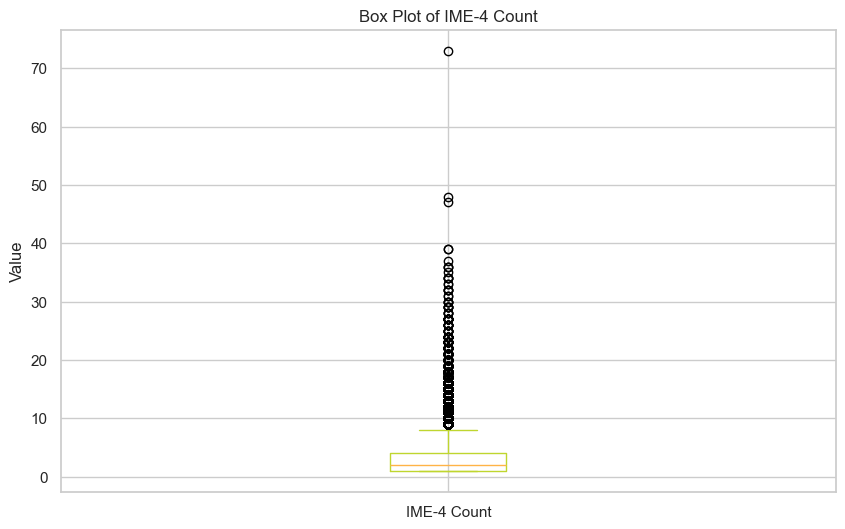

In [142]:
plt.figure(figsize=(10, 6))
data['IME-4 Count'].plot(kind='box')
plt.title('Box Plot of IME-4 Count')
plt.ylabel('Value')
# Calculate the upper limit for 'IME-4 COunt'
Q1 = data['IME-4 Count'].quantile(0.25)
Q3 = data['IME-4 Count'].quantile(0.75)
IQR = Q3 - Q1
upper_limit_ime = Q3 + 1.5 * IQR

print(f"Upper limit for 'IME-4 Count': {upper_limit_ime}")

`Step 70.1` Removing only the extreme outliers on the variable `IME-4 Count`.

In [143]:
# Remove outliers in X_train and also filter y_train
X_train = X_train[X_train['IME-4 Count'] < 70]
y_train = y_train.loc[X_train.index]

# Remove outliers in X_val and also filter y_val
X_val = X_val[X_val['IME-4 Count'] < 70]
y_val = y_val.loc[X_val.index]

`Step 71` Check the upper limit of the variable `C-3 Date`.

Upper limit for 'C-3 Date': 8954.5


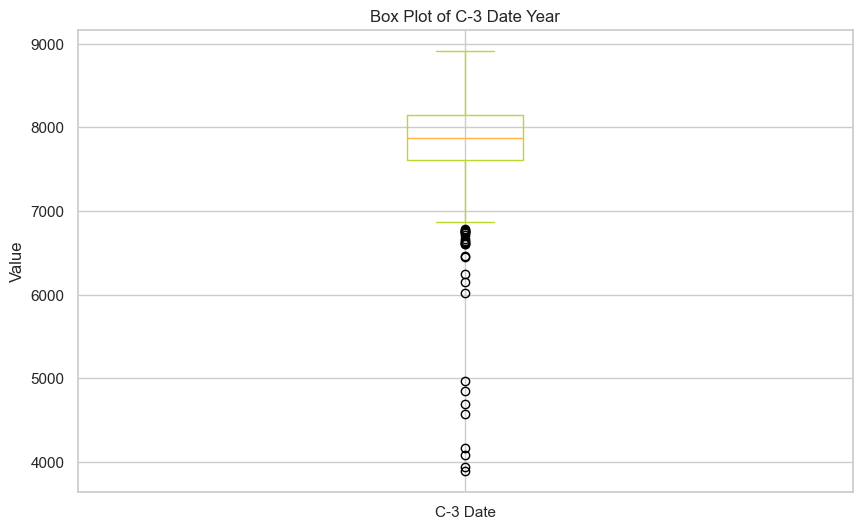

In [144]:
plt.figure(figsize=(10, 6))
data['C-3 Date'].plot(kind='box')
plt.title('Box Plot of C-3 Date Year')
plt.ylabel('Value')
# Calculate the IQR again for 'Age at Injury'
Q1 = data['C-3 Date'].quantile(0.25)
Q3 = data['C-3 Date'].quantile(0.75)
IQR = Q3 - Q1
upper_limit_c3 = Q3 + 1.5 * IQR

print(f"Upper limit for 'C-3 Date': {upper_limit_c3}")

`Step 71.1` Removing only the extreme outliers on the variable `C-3 Date`.

In [145]:
# Remove outliers in X_train and also filter y_train
X_train = X_train[X_train['C-3 Date'] > 5000]
y_train = y_train.loc[X_train.index]

# Remove outliers in X_val and also filter y_val
X_val = X_val[X_val['C-3 Date'] > 5000]
y_val = y_val.loc[X_val.index]

# 5. Feature Selection

### Filter Methods

`Step 72` Create a list *X_num_features* and list *X_cat_features* that store the name of the numeric and categorical features.

In [146]:
X_num_features = ["Accident Date", "Age at Injury", "Assembly Date", "Average Weekly Wage", "Birth Year", "C-2 Date", "C-3 Date", 
                  "IME-4 Count", "First Hearing Date", "Number of Dependents"]
X_cat_features = ["Alternative Dispute Resolution", "Attorney/Representative", "Carrier Name", "Carrier Type", "County of Injury", 
                  "COVID-19 Indicator", "District Name", "Gender", "Industry Code Description", "Medical Fee Region", "Hearing",
                  "WCIO Cause of Injury Description", "WCIO Nature of Injury Description", "WCIO Part Of Body Description", "Zip Code"]

`Step 72.1` Create variables X_train_num that stores the numeric features and X_train_cat, X_val_num and X_val_cat.

In [147]:
X_train_num = X_train[X_num_features]
X_train_cat = X_train[X_cat_features]

X_val_num = X_val[X_num_features]
X_val_cat = X_val[X_cat_features]

`Step 73` Check the variance of the numeric features looking for univariate features.

In [148]:
X_train_num.var()

Accident Date           4.323465e+05
Age at Injury           1.822671e+02
Assembly Date           9.926673e+04
Average Weekly Wage     2.362455e+07
Birth Year              1.850031e+02
C-2 Date                1.642074e+05
C-3 Date                1.103550e+05
IME-4 Count             5.682004e+00
First Hearing Date      1.591437e+06
Number of Dependents    4.006678e+00
dtype: float64

`Step 74` Checking the correlations of the features in *X_train_num*.

In [149]:
cor_spearman = X_train_num.corr(method ='spearman')
cor_spearman

,Accident Date,Age at Injury,Assembly Date,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,IME-4 Count,First Hearing Date,Number of Dependents
Accident Date,1.000000,-0.025903,0.961479,-0.017158,0.102122,0.947270,0.901489,-0.042631,0.128961,0.000267
Age at Injury,-0.025903,1.000000,-0.018903,0.113828,-0.991587,-0.018114,-0.009318,0.040975,-0.114601,0.001254
Assembly Date,0.961479,-0.018903,1.000000,-0.037125,0.080514,0.979950,0.930576,-0.051116,0.125594,-0.000277
Average Weekly Wage,-0.017158,0.113828,-0.037125,1.000000,-0.108615,-0.026770,-0.019351,0.197045,-0.485202,-0.001987
Birth Year,0.102122,-0.991587,0.080514,-0.108615,1.000000,0.081218,0.067888,-0.042130,0.119649,-0.001193
C-2 Date,0.947270,-0.018114,0.979950,-0.026770,0.081218,1.000000,0.933292,-0.055314,0.113093,-0.000406
C-3 Date,0.901489,-0.009318,0.930576,-0.019351,0.067888,0.933292,1.000000,-0.031955,0.114051,-0.000702
IME-4 Count,-0.042631,0.040975,-0.051116,0.197045,-0.042130,-0.055314,-0.031955,1.000000,-0.184530,0.000155
First Hearing Date,0.128961,-0.114601,0.125594,-0.485202,0.119649,0.113093,0.114051,-0.184530,1.000000,-0.000559
Number of Dependents,0.000267,0.001254,-0.000277,-0.001987,-0.001193,-0.000406,-0.000702,0.000155,-0.000559,1.000000


`Step 74.1` Creating an heatmap of the correlations of the variables.

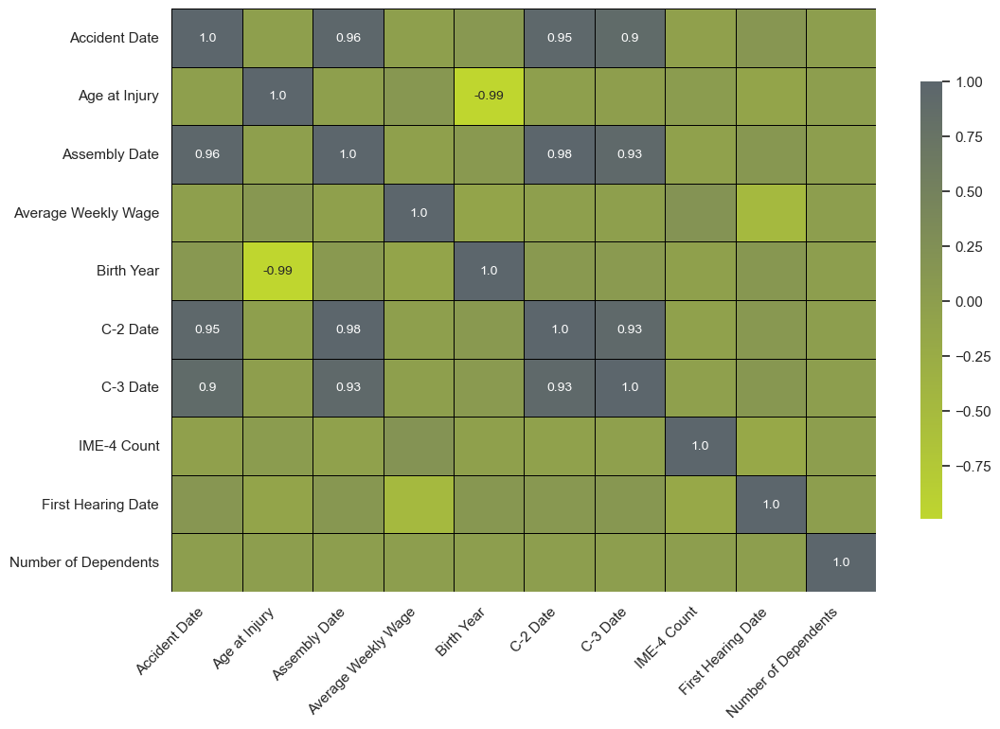

In [150]:
cor_heatmap1(cor_spearman)

### Wrapper Methods

`Step 75` Scale the data to be used for the RFE.

In [151]:
#call function
scaler = MinMaxScaler()
#transform the data
X_train_num_scaled = scaler.fit_transform(X_train_num) # this will return an array
X_train_num_scaled = pd.DataFrame(X_train_num_scaled, columns = X_train_num.columns).set_index(X_train.index)

# Transform the validation data using the already fitted scaler
X_val_num_scaled = scaler.transform(X_val_num)
X_val_num_scaled = pd.DataFrame(X_val_num_scaled, columns = X_val_num.columns).set_index(X_val.index)

`Step 75.1` Encode the target feature.

In [152]:
# Create an instance of Label Encoder
enc = LabelEncoder()

# Transform y labels
y_train = enc.fit_transform(y_train)
y_val = enc.transform(y_val)  # Use transform instead of fit_transform to avoid data leakage

`Step 75.2` Check what is the optimal number of features to be used for the model

In [153]:
from sklearn.linear_model import LogisticRegression

# Number of features to test
nof_list = np.arange(1, 11)
high_score = 0
nof = 0           

# Lists to store train and validation scores
train_score_list = []
val_score_list = []

for n in range(len(nof_list)):
    # Logistic Regression for multiclass
    model = LogisticRegression(multi_class='multinomial', solver='saga', max_iter=200) #multiclass classification, saga for large datasets
    
    # Recursive Feature Elimination (RFE) with the current number of features
    rfe = RFE(estimator=model, n_features_to_select=nof_list[n])
    X_train_rfe = rfe.fit_transform(X_train_num_scaled, y_train)
    X_val_rfe = rfe.transform(X_val_num_scaled)
    
    # Fit model
    model.fit(X_train_rfe, y_train)
    
    # Store training f1 score
    train_score = f1_score(y_train, model.predict(X_train_rfe), average='macro')
    train_score_list.append(train_score)
    
    # Store validation f1 score
    val_score = f1_score(y_val, model.predict(X_val_rfe), average='macro')
    val_score_list.append(val_score)
    
    # Check if the current validation score is the highest
    if val_score >= high_score:
        high_score = val_score
        nof = nof_list[n]

print("Optimum number of features: %d" % nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 10
Score with 10 features: 0.171432


`Step 75.3` Plot the results.

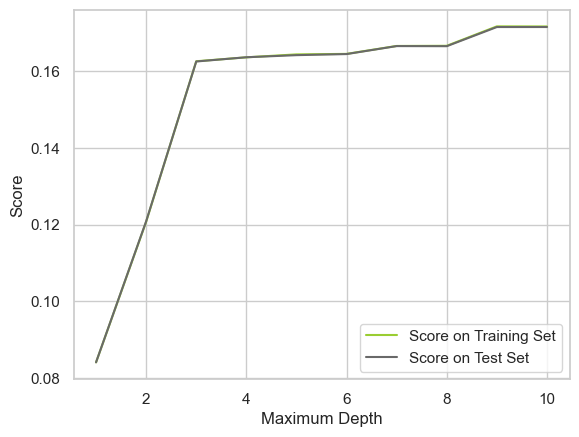

In [154]:
plt.plot(list(range(1,11)), train_score_list, label="Score on Training Set", color='yellowgreen')
plt.plot(list(range(1,11)), val_score_list, label="Score on Test Set", color='dimgray')
plt.xlabel("Maximum Depth")
plt.ylabel("Score")
plt.legend()
plt.show()

`Step 75.4` Using RFE, create a RFE instance called `rfe` and initialize by defining the following parameters:
- `estimator` = model
- `n_features_to_select` = 9 <br> <br>

In [155]:
model = LogisticRegression(multi_class='multinomial', solver='saga', max_iter=200)
rfe = RFE(estimator=model, n_features_to_select=9)

`Step 75.5` Transform the data using RFE by applying the method `fit_transform()` to the instance `rfe`, where `X` is assigned to the independent variables and `y` to the dependent variable and assign it to the object `X_rfe`.

In [156]:
X_rfe = rfe.fit_transform(X = X_train_num, y = y_train)

`Step 75.6` Create an object named `selected_features` that will have as index the `X_train_num` columns names and the `support_` attribute as value.

In [157]:
selected_features = pd.Series(rfe.support_, index = X_train_num.columns)
selected_features

Accident Date            True
Age at Injury            True
Assembly Date            True
Average Weekly Wage      True
Birth Year               True
C-2 Date                 True
C-3 Date                 True
IME-4 Count              True
First Hearing Date       True
Number of Dependents    False
dtype: bool

### Embedded Methods

`Step 76` Using LassoCV, create a Lasso Regression instance called `reg`.

In [158]:
reg = LassoCV()

`Step 76.1` Fit the data to `reg` by using the method `fit()` where `X` should be assigned to `X_train_num` and `y` to the dependent variable.

In [159]:
reg.fit(X_train_num_scaled, y_train)

LassoCV()

`Step 76.2` Create an object named `coef` that will have as index the `data` columns names and the `coef_` attribute as value.

In [160]:
coef = pd.Series(reg.coef_, index = X_train_num_scaled.columns)
coef

Accident Date           0.000000
Age at Injury           0.246937
Assembly Date          -0.050653
Average Weekly Wage     0.000000
Birth Year             -0.000000
C-2 Date               -0.789111
C-3 Date                0.300308
IME-4 Count             1.889696
First Hearing Date     -1.619646
Number of Dependents   -0.002624
dtype: float64

`Step 76.3` Check how many variables did Lasso picked (if the coef is different from 0) and how many variables did Lasso eliminated (if the coef is equal to 0).

In [161]:
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Lasso picked 7 variables and eliminated the other 3 variables


`Step 77` Check the importance of categorical features to the random forest classification.

In [162]:
# Initialize the RandomForestClassifier
rf_model = RandomForestClassifier(random_state=42)

# Fit the model
rf_model.fit(X_train_cat, y_train)

# Get feature importances
feature_importances = pd.Series(rf_model.feature_importances_, index=X_train_cat.columns)

# Sort and display the feature importances
feature_importances = feature_importances.sort_values(ascending=False)
print("Feature Importances from Random Forest:")
print(feature_importances)

Feature Importances from Random Forest:
Zip Code                             0.178527
WCIO Cause of Injury Description     0.110757
Attorney/Representative              0.110180
Carrier Name                         0.107308
WCIO Part Of Body Description        0.106208
County of Injury                     0.079187
Hearing                              0.076198
Industry Code Description            0.069418
WCIO Nature of Injury Description    0.066988
District Name                        0.029681
Medical Fee Region                   0.026154
Carrier Type                         0.019712
Gender                               0.014990
COVID-19 Indicator                   0.003452
Alternative Dispute Resolution       0.001239
dtype: float64


### Numerical Data

| Predictor           | Spearman | RFE LR  |  Lasso  | What to do? (One possible way to "solve")|
|---------------------|----------|---------|---------|----------------------------------------|
| Age at Injury       | Keep     | Keep    | Keep    |Include in the model                    |
| Birth Year          | Discard  | Keep    | Discard |Discard                                 |
| Accident Date       | Discard  | Keep    | Discard |Discard                                 |
| Assembly Date       | Keep     | Keep    | Keep    |Include in the model                    |
| C-2 Date            | Discard  | Keep    | Keep    |Discard                                 |
| C-3 Date            | Discard  | Keep    | Keep    |Discard                                 |
| First Hearing Date  | Keep     | Keep    | Keep    |Include in the model                    |
| Average Weekly Wage | Keep     | Keep    | Discard |Try with and without                    |
| Number of dependents| Keep     | Discard | Keep    |Try with and without                    |
| IME-4 Count         | Keep     | Keep    | Keep    |Include in the model                    |

---

### Categorical Data

|           Predictor           | Feature Importance (RF) |  What to do? (One possible way to "solve")|
|-------------------------------|-------------------------|-------------------------------------------|
| Alternative Dispute Resolution|        Discard          |              Try with and without         |
| Attorney/Representative       |        Keep             |                      Keep                 |
| Carrier Name                  |        Keep             |                      Keep                 |
| Carrier Type                  |        Keep             |                      Keep                 |
| County of Injury              |        Keep             |                      Keep                 |
| COVID-19 Indicator            |        Discard          |              Try with and without         |
| District Name                 |        Keep             |                      Keep                 |
| Gender                        |        Keep             |                      Keep                 |
| Industry Code                 |        Keep             |                      Keep                 | 
| WCIO Cause of Injury Code     |        Keep             |                      Keep                 |
| WCIO Nature of Injury Code    |        Keep             |                      Keep                 |
| WCIO Part Of Body Code        |        Keep             |                      Keep                 |
| Zip Code                      |        Keep             |                      Keep                 |
| Hearing                       |        Keep             |                      Keep                 |

# 6. Model selection & Assessment

## 6.1. Model selection

`Step 78` Create an instance of each algorithm to test for cross-validation.

In [163]:
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()
mlr = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=200)
xgb = XGBClassifier()

`Step 79` Create a copy of the df dataframe and set index as Claim Identifier.

In [164]:
df1 = df.copy()
df1 = df1.set_index("Claim Identifier")

`Step 80` Use stratidied sampling to otimize the code.

In [165]:
# Create a sample size of 30% of the dataset
sample_size = 0.3 

# Stratified sampling to reduce dataset size
stratified_sample = df1.groupby('Claim Injury Type', group_keys=False).apply(lambda x: x.sample(frac=sample_size, random_state=42))

`Step 81` Check distribution of original data and for the sample.

In [166]:
# Check original class distribution
original_distribution = data['Claim Injury Type'].value_counts(normalize=True)

# Check sample class distribution
sample_distribution = stratified_sample['Claim Injury Type'].value_counts(normalize=True)

print("Original Distribution:\n", original_distribution)
print("Sample Distribution:\n", sample_distribution)

Original Distribution:
 Claim Injury Type
2. NON-COMP        0.506850
4. TEMPORARY       0.261348
3. MED ONLY        0.119941
5. PPD SCH LOSS    0.084375
1. CANCELLED       0.019024
6. PPD NSL         0.007465
8. DEATH           0.000829
7. PTD             0.000169
Name: proportion, dtype: float64
Sample Distribution:
 Claim Injury Type
2. NON-COMP        0.507082
4. TEMPORARY       0.258712
3. MED ONLY        0.120042
5. PPD SCH LOSS    0.084108
1. CANCELLED       0.021735
6. PPD NSL         0.007334
8. DEATH           0.000819
7. PTD             0.000168
Name: proportion, dtype: float64


`Step 82` Split the data into X and y.

In [167]:
X = stratified_sample.drop(columns=['Claim Injury Type'], axis =1)
y = stratified_sample['Claim Injury Type']

`Step 83` Define a function to solve incoherences.

In [168]:
def clean_data(data):
    # Accident Date
    # Remove the rows where "Accident Date" is Bigger then the "C-2 Date"
    data = data[~(data['Accident Date'] > data['C-2 Date'])]

    # Remove the rows where "Accident Date" is Bigger then the "C-3 Date"
    data = data[~(data['Accident Date'] > data['C-3 Date'])]

    # Remove values from 2023
    data = data[data['Accident Date'] <= "2022-12-31"]

    # Age at Injury
    data[data['Age at Injury'] == 0]
    data["Age at Injury"] = data["Age at Injury"].replace(0, np.nan)

    data = data[data['Age at Injury'] > 18]

    # Birth Year
    data["Birth Year"] = data["Birth Year"].replace(0, np.nan)
    data["Birth Year"] = data["Birth Year"].fillna(data['Accident Date'].dt.year - data['Age at Injury'])

    # First Hearing Date
    # Substitute missing values in 'First Hearing Date' with '2025-01-01'
    data['First Hearing Date'] = data['First Hearing Date'].fillna('2030-01-01')

    # Verify the substitution
    data['First Hearing Date'].isna().sum()

    data = data[~((data['First Hearing Date'] < data['Accident Date']) | (data['First Hearing Date'] < data['Assembly Date']))]

    # C-2 Date
    # Replace 'C-2 Date' values with NaN where 'C-2 Date' is after 'First Hearing Date'
    data.loc[(data['C-2 Date'] > data['First Hearing Date']) & 
                   data['C-2 Date'].notna() & 
                   data['First Hearing Date'].notna(), 'C-2 Date'] = np.nan

    # Define the maximum valid 'Assembly Date'
    max_assembly_date = pd.to_datetime('2022-12-31')

    # Replace 'C-2 Date' values with NaN where 'C-2 Date' is after the maximum valid 'Assembly Date'
    data.loc[(data['C-2 Date'] > max_assembly_date) & 
               data['C-2 Date'].notna(), 'C-2 Date'] = np.nan

    # COVID-19 Indicator 
    # Update 'COVID-19 Indicator' to 'Y' where the in WCIO Nature of Injury Description it is indicated as COVID-19
    data.loc[(data['COVID-19 Indicator'] != 'Y') & (data['WCIO Nature of Injury Description'] == 'COVID-19'), 'COVID-19 Indicator'] = 'Y'

    # WCIO Part Of Body Description
    data['WCIO Part Of Body Description'] = data['WCIO Part Of Body Description'].replace("MULTIPLE", np.nan)

    # ZIP Code
    data['Zip Code'] = data['Zip Code'].apply(lambda x: int(float(x)) if can_be_int(x) else x)

    # Create a mask for non-5-digit zip codes that cannot be converted to integers
    invalid_zip_mask = data['Zip Code'].notna() & data['Zip Code'].apply(cannot_be_int)

    # Set those observations to NaN in the 'Zip Code' column
    data.loc[invalid_zip_mask, 'Zip Code'] = np.nan

    data.loc[data['Zip Code'] < 10000, 'Zip Code'] = np.nan

    return data

`Step 84` Define a function to handle missing values. 

In [169]:
# Define the cleaning and imputation function
def clean_and_impute(df, columns_to_drop, columns_to_input, imputer):
    # Drop specified columns
    df = df.drop(columns=columns_to_drop, errors='ignore')  # errors='ignore' in case any columns are missing
    
    # Apply imputation only to specified columns
    df_imputed = pd.DataFrame(imputer.fit_transform(df[columns_to_input]), columns=columns_to_input, index=df.index)
    
    # Update original DataFrame with imputed columns
    df[columns_to_input] = df_imputed
    
    return df

`Step 85` Define the function **cv_scores** that does the cross validation with 5 partitions in the data.

In [170]:
def cv_scores(model, X, y):
    warnings.filterwarnings("ignore")
    '''Function takes as argument the model you intend to use, the predictors and the labels. It splits the data using KFold,
    trains the model using X and y as predictors and label. Then it returns the results obtained from cross-validation.'''
    
    # Apply KFold
    skf = StratifiedKFold(n_splits=5)
    
    # Create lists to store the results from the different models 
    precision_train = []
    precision_val = []
    recall_train = []
    recall_val = []
    f1_train = []
    f1_val = []
    
    # Start timer
    timer = []
    
    for train_index, test_index in skf.split(X, y):
        
        # Get the indexes of the observations assigned for each partition
        X_train, X_val = X.iloc[train_index], X.iloc[test_index]
        y_train, y_val = y.iloc[train_index], y.iloc[test_index]
        
        # Start counting time
        begin = time.perf_counter()
        
        # Data Preprocessing

        # Create variable Hearing
        X_train['Hearing'] = np.where(X_train['First Hearing Date'].notna(), 1, 0)
        X_val['Hearing'] = np.where(X_val['First Hearing Date'].notna(), 1, 0)
        
        # Solving incoherences
        X_train = clean_data(X_train)
        X_val = clean_data(X_val)

        # Feature Engeneering 
        # Map Attorney/Representative to binary values
        X_train['Attorney/Representative'] = X_train['Attorney/Representative'].map({'Y': 1, 'N': 0})
        X_val['Attorney/Representative'] = X_val['Attorney/Representative'].map({'Y': 1, 'N': 0})
        

        # Map COVID-19 Indicator to binary values
        X_train['COVID-19 Indicator'] = X_train['COVID-19 Indicator'].map({'Y': 1, 'N': 0})
        X_val['COVID-19 Indicator'] = X_val['COVID-19 Indicator'].map({'Y': 1, 'N': 0})
        
        # Transform the dates into integers via (Unit)
        X_train['Accident Date'] = (X_train['Accident Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
        X_train['Assembly Date'] = (X_train['Assembly Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
        X_train['C-2 Date'] = (X_train['C-2 Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
        X_train['C-3 Date'] = (X_train['C-3 Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
        X_train['First Hearing Date'] = (X_train['First Hearing Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')

        X_val['Accident Date'] = (X_val['Accident Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
        X_val['Assembly Date'] = (X_val['Assembly Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
        X_val['C-2 Date'] = (X_val['C-2 Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
        X_val['C-3 Date'] = (X_val['C-3 Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
        X_val['First Hearing Date'] = (X_val['First Hearing Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')


        var_frequency_encoding = ["Alternative Dispute Resolution", "Carrier Name", "Carrier Type", 
                                  "County of Injury", "District Name", "Gender", "Industry Code Description", 
                                  "Medical Fee Region", "WCIO Cause of Injury Description", 
                                  "WCIO Nature of Injury Description", "WCIO Part Of Body Description", "Zip Code"]

        # Applying frequency encoding to X_train
        X_train = frequency_encoding(X_train, var_frequency_encoding)
        X_val = frequency_encoding(X_val, var_frequency_encoding)

        # Imputing Missing Values
        # Define columns and imputer
        columns_to_drop = ["First Hearing Date", "OIICS Nature of Injury Description", "Agreement Reached", "WCB Decision", "Industry Code",
                   "WCIO Cause of Injury Code", "WCIO Nature of Injury Code", "WCIO Part Of Body Code", "time_to_assembly",
                   "C-2 delivered on time", "C-3 delivered on time"]
        columns_to_input = ["Accident Date", "Age at Injury", "Average Weekly Wage", "Birth Year", "C-2 Date", "C-3 Date", "IME-4 Count", 
                    "Zip Code", "Industry Code Description", "WCIO Cause of Injury Description", 
                    "WCIO Nature of Injury Description", "WCIO Part Of Body Description"]

        # Initialize the IterativeImputer with DecisionTreeRegressor
        imputer = IterativeImputer(estimator=DecisionTreeRegressor(), max_iter=10, random_state=15)

        # Apply the function to X_train and X_val
        X_train = clean_and_impute(X_train, columns_to_drop, columns_to_input, imputer)
        X_val = clean_and_impute(X_val, columns_to_drop, columns_to_input, imputer)

        # Outliers 
        # Remove outliers in X_train
        X_train = X_train[X_train['Age at Injury'] < upper_limit_age]

        # Remove outliers in X_val
        X_val = X_val[X_val['Age at Injury'] < upper_limit_age]

        # Remove outliers in X_train
        X_train = X_train[X_train['IME-4 Count'] < 70]

        # Remove outliers in X_val
        X_val = X_val[X_val['IME-4 Count'] < 70]

        # Remove outliers in X_train and also filter y_train
        X_train = X_train[X_train['C-3 Date'] > 5000]
        y_train = y_train.loc[X_train.index]

        # Remove outliers in X_val and also filter y_val
        X_val = X_val[X_val['C-3 Date'] > 5000]
        y_val = y_val.loc[X_val.index]

        # Transform y labels with the Label Encoder created previously
        y_train = enc.transform(y_train)
        y_val = enc.transform(y_val)  # Use transform instead of fit_transform to avoid data leakage

        # Feature Selection
        C_remove = ["Birth Year", "Accident Date", "C-2 Date", "C-3 Date"]

        # Drop the specified columns from X_train and X_val
        X_train.drop(columns=C_remove, inplace=True, errors='ignore')
        X_val.drop(columns=C_remove, inplace=True, errors='ignore')
        
        # Scaling
        feature_scaler = MinMaxScaler().fit(X_train)
        
        # Apply to training data
        X_train_scaled = pd.DataFrame(feature_scaler.transform(X_train), columns=X_train.columns, index=X_train.index)
    
        # Apply to val data
        X_val_scaled = pd.DataFrame(feature_scaler.transform(X_val), columns=X_val.columns, index=X_val.index)

        # Fit the model to the data
        model.fit(X_train_scaled, y_train)
        
        # Finish counting time
        end = time.perf_counter()
        
        # Predict for the train
        pred_train = model.predict(X_train_scaled)
        
        # Predict for val
        pred_val = model.predict(X_val_scaled)
        
        # Create variables for scores
        precision_train_val = precision_score(y_train, pred_train, average='macro', zero_division=0)
        precision_val_val = precision_score(y_val, pred_val, average='macro', zero_division=0)
        
        recall_train_val = recall_score(y_train, pred_train, average='macro', zero_division=0)
        recall_val_val = recall_score(y_val, pred_val, average='macro', zero_division=0)
        
        f1_train_val = f1_score(y_train, pred_train, average='macro', zero_division=0)
        f1_val_val = f1_score(y_val, pred_val, average='macro', zero_division=0)
                                   
        # Store the scores in the corresponding lists
        precision_train.append(precision_train_val)
        precision_val.append(precision_val_val)
        recall_train.append(recall_train_val)
        recall_val.append(recall_val_val)
        f1_train.append(f1_train_val)
        f1_val.append(f1_val_val)
        timer.append(end - begin)
        
    # Store results in df
    model_results = pd.DataFrame(data={
        'Train_Precision': precision_train,
        'Test_Precision': precision_val,
        'Train_Recall': recall_train,
        'Test_Recall': recall_val,
        'Train_F1': f1_train,
        'Test_F1': f1_val,
        'Time': timer
    }, index=[f'Fold {i}' for i in range(1, 6)])  # Changed 10 to 6 to match the number of folds
    
    # Return results
    return model_results

`Step 86` Run the crosso validation with 5 folds to the following models: *Decision Tree*, *Random Forest*, *Multinomial Logistic Regression* and *Extreme Gradiant Boosting*.

In [171]:
dt_results = cv_scores(dt, X, y)

In [172]:
rf_results = cv_scores(rf, X, y)

In [173]:
mlr_results = cv_scores(mlr, X, y)

In [174]:
xgb_results = cv_scores(xgb, X, y)

`Step 86.1` Compute the average perfomance of the models.

In [175]:
dt_results_means = dt_results.mean()
rf_results_means = rf_results.mean()
mlr_results_means = mlr_results.mean()
xgb_results_means = xgb_results.mean()

`Step 86.2` Plot the results.

In [176]:
average_model_performances = pd.DataFrame([dt_results_means, rf_results_means, mlr_results_means, xgb_results_means]).T
average_model_performances.columns = ['Decision Tree','Random Forest', 'Multinomial Logistic Regression', 'XGBoost']
average_model_performances

,Decision Tree,Random Forest,Multinomial Logistic Regression,XGBoost
Train_Precision,0.999998,0.999997,0.251090,0.865842
Test_Precision,0.288321,0.384729,0.256728,0.377045
Train_Recall,0.999777,0.999970,0.225721,0.620470
Test_Recall,0.290584,0.299100,0.226109,0.267260
Train_F1,0.999887,0.999983,0.215416,0.651832
Test_F1,0.289037,0.292413,0.215771,0.252278
Time,328.288051,367.122206,334.115035,322.825733


### Conclusion

On average the best model is: `Random Forest`.

# 7. Deployment

`Step 87` Import the test dataset.

In [183]:
test = pd.read_csv('Data/test_data.csv', sep=',')
test.head(2)

,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,...,Medical Fee Region,OIICS Nature of Injury Description,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Number of Dependents
0,2022-12-24,19,N,2023-01-02,N,NaN,2003.0,2023-01-02,NaN,INDEMNITY INSURANCE CO OF,...,IV,NaN,31.0,"FALL, SLIP OR TRIP, NOC",10.0,CONTUSION,54.0,LOWER LEG,10466,1
1,2022-11-20,19,N,2023-01-02,N,NaN,2003.0,2023-01-02,NaN,A I U INSURANCE COMPANY,...,IV,NaN,75.0,FALLING OR FLYING OBJECT,10.0,CONTUSION,10.0,MULTIPLE HEAD INJURY,11691,1


`Step 88` Check the missing values in the test set.

In [184]:
test.isna().sum()

Accident Date                           2444
Age at Injury                              0
Alternative Dispute Resolution             0
Assembly Date                              0
Attorney/Representative                    0
Average Weekly Wage                    19204
Birth Year                             19470
C-2 Date                                9134
C-3 Date                              302759
Carrier Name                               0
Carrier Type                               0
Claim Identifier                           0
County of Injury                           0
COVID-19 Indicator                         0
District Name                              0
First Hearing Date                    344947
Gender                                     0
IME-4 Count                           352726
Industry Code                           7736
Industry Code Description               7736
Medical Fee Region                         0
OIICS Nature of Injury Description    387975
WCIO Cause

`Step 89` Assign Claim Identifier as the index of the test set.

In [185]:
test.set_index('Claim Identifier', inplace=True)

`Step 90` Do the necessary transformations to the data and input the missing values.

In [186]:
# Create variable Hearing
test['Hearing'] = np.where(test['First Hearing Date'].notna(), 1, 0)

# Transform Date variables in datetime
for col in date_columns:
    test[col] = pd.to_datetime(test[col], errors='coerce')

# Solving incoherences

# Age at Injury
test["Age at Injury"] = test["Age at Injury"].replace(0, np.nan)

# First Hearing Date
# Substitute missing values in 'First Hearing Date' with '2025-01-01'
test['First Hearing Date'] = test['First Hearing Date'].fillna('2030-01-01')

# COVID-19 Indicator 
# Update 'COVID-19 Indicator' to 'Y' where the in WCIO Nature of Injury Description it is indicated as COVID-19
test.loc[(test['COVID-19 Indicator'] != 'Y') & (test['WCIO Nature of Injury Description'] == 'COVID-19'), 'COVID-19 Indicator'] = 'Y'

# WCIO Part Of Body Description
test['WCIO Part Of Body Description'] = test['WCIO Part Of Body Description'].replace("MULTIPLE", np.nan)

# ZIP Code
test['Zip Code'] = test['Zip Code'].apply(lambda x: int(float(x)) if can_be_int(x) else x)

# Create a mask for non-5-digit zip codes that cannot be converted to integers
invalid_zip_mask = test['Zip Code'].notna() & test['Zip Code'].apply(cannot_be_int)

# Set those observations to NaN in the 'Zip Code' column
test.loc[invalid_zip_mask, 'Zip Code'] = np.nan

test.loc[test['Zip Code'] < 10000, 'Zip Code'] = np.nan

# Feature Engeneering 
# Map Attorney/Representative to binary values
test['Attorney/Representative'] = test['Attorney/Representative'].map({'Y': 1, 'N': 0})
        
# Map COVID-19 Indicator to binary values
test['COVID-19 Indicator'] = test['COVID-19 Indicator'].map({'Y': 1, 'N': 0})
        
# Transform the dates into integers via (Unit)
test['Accident Date'] = (test['Accident Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
test['Assembly Date'] = (test['Assembly Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
test['C-2 Date'] = (test['C-2 Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
test['C-3 Date'] = (test['C-3 Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')
test['First Hearing Date'] = (test['First Hearing Date'] - pd.Timestamp('2000-01-01')) // pd.Timedelta('1D')


var_frequency_encoding = ["Alternative Dispute Resolution", "Carrier Name", "Carrier Type", "County of Injury", "District Name", "Gender", 
                          "Industry Code Description", "Medical Fee Region", "WCIO Cause of Injury Description", "WCIO Nature of Injury Description", 
                          "WCIO Part Of Body Description", "Zip Code"]

# Applying frequency encoding to X_train
test = frequency_encoding(test, var_frequency_encoding)

# Imputing Missing Values
# Define columns and imputer
columns_to_drop = [ "OIICS Nature of Injury Description", "Agreement Reached", "WCB Decision", "Industry Code", "WCIO Cause of Injury Code", 
                   "WCIO Nature of Injury Code", "WCIO Part Of Body Code"]

columns_to_input = ["Accident Date", "Age at Injury", "Average Weekly Wage", "Birth Year", "C-2 Date", "C-3 Date", "IME-4 Count",  "Zip Code", 
                    "Industry Code Description", "WCIO Cause of Injury Description",  "WCIO Nature of Injury Description", "WCIO Part Of Body Description"]

# Initialize the IterativeImputer with DecisionTreeRegressor
imputer = IterativeImputer(estimator=DecisionTreeRegressor(), max_iter=10, random_state=15)

# Apply the function to X_train and X_val
test = clean_and_impute(test, columns_to_drop, columns_to_input, imputer)

# Feature Selection
C_remove = ["Birth Year", "Accident Date", "C-2 Date", "C-3 Date"]

# Drop the specified columns from X_train and X_val
test.drop(columns=C_remove, inplace=True, errors='ignore')

`Step 91` Remove from X_train_scaled the features that were considered inrelevant during feature selection.

In [188]:
# Feature Selection
C_remove = ["Birth Year", "Accident Date", "C-2 Date", "C-3 Date"]

# Drop the specified columns from X_train and X_val
X_train.drop(columns=C_remove, inplace=True, errors='ignore')

`Step 91.1` Scale the data.

In [189]:
# Scaling
feature_scaler = MinMaxScaler().fit(X_train)
        
# Apply to training data
X_train_scaled = pd.DataFrame(feature_scaler.transform(X_train), columns=X_train.columns, index=X_train.index)

# Apply to the test
test_scaled = pd.DataFrame(feature_scaler.transform(test), columns=test.columns, index=test.index)

`Step 92` Create an instance of the Random Forest Classifier fitted to the training data.

In [190]:
rf = RandomForestClassifier()
rf.fit(X_train_scaled, y_train)

RandomForestClassifier()

`Step 93` Make predictions of the target variable.

In [192]:
labels_test = rf.predict(test_scaled)
labels_test

array([1, 1, 1, ..., 1, 1, 1])

`Step 94` Reverse the encoding of the target feature.

In [193]:
labels_test = enc.inverse_transform(labels_test)
labels_test

array(['2. NON-COMP', '2. NON-COMP', '2. NON-COMP', ..., '2. NON-COMP',
       '2. NON-COMP', '2. NON-COMP'], dtype=object)

`Step 95` Create an answer to the problem and store it into.

In [194]:
index = test.index.T
answer = pd.DataFrame([index, labels_test]).T
answer.columns = ['Claim Identifier','Claim Injury Type']
answer

,Claim Identifier,Claim Injury Type
0,6165911,2. NON-COMP
1,6166141,2. NON-COMP
2,6165907,2. NON-COMP
3,6166047,2. NON-COMP
4,6166102,2. NON-COMP
...,...,...
387970,6553137,2. NON-COMP
387971,6553119,2. NON-COMP
387972,6553542,2. NON-COMP
387973,6553455,2. NON-COMP


`Step 95.1` Set `Claim Identifier` as type 'int32'.

In [195]:
answer['Claim Identifier'] = answer['Claim Identifier'].astype('int32')

`Step 96` Save the answer as a csv.

In [196]:
answer.set_index('Claim Identifier').to_csv('Handout.csv')